# PREPARACIÓN DEL ENTORNO

## Importación

In [1]:
# Importación
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import plotly.express as px
import umap.umap_ as umap
import copy
import lightgbm as lgb
import joblib
import shap

from sklearn.linear_model import LinearRegression
from sklearn.metrics import (r2_score, silhouette_score, accuracy_score,
                            classification_report, confusion_matrix,
                            roc_auc_score, roc_curve, auc)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import trustworthiness
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from lightgbm import LGBMClassifier
from minisom import MiniSom
from pylab import bone, pcolor, colorbar, plot, show  # Visualización de la U-Matrix (Unified Distance Matrix).

pd.set_option('display.max_columns', None)  # Mostrar todas las columnas en pandas.

import warnings
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")

C:\Users\danie\.conda\envs\m3\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Carga de datos

In [2]:
# Cargamos los datasets
clientes = pd.read_csv("./source/CLIENTES.txt", sep="|", encoding='latin1')
ventas = pd.read_csv("./source/VENTAS.txt", sep='|', encoding='latin1')
consultas = pd.read_csv("./source/CONSULTAS.txt", sep='|', encoding='latin1')

## Exploración inicial de datos

In [3]:
print("CLIENTES")
print(clientes.shape)
print(clientes.info())
clientes.head(3)

CLIENTES
(9512, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9512 entries, 0 to 9511
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   ID                      9512 non-null   int64 
 1   FECHA_REGISTRO          9512 non-null   object
 2   CANAL_REGISTRO          9512 non-null   object
 3   FECHA_CLIENTE           9512 non-null   object
 4   CLIENTEPORCAMPAÑAEMAIL  9512 non-null   int64 
 5   FORMAJURIDICA           9512 non-null   object
 6   SECTOR                  9512 non-null   object
 7   DESC_SECTOR             9512 non-null   object
 8   ESTADO                  9512 non-null   object
 9   DEPARTAMENTO            3912 non-null   object
 10  TAMAÑO                  3912 non-null   object
 11  ANTIGUEDAD              3912 non-null   object
 12  DIASCLIENTE             9512 non-null   int64 
 13  CONSUMOSTOTAL           9512 non-null   int64 
 14  EMPRESASUNICAS_CONSULT  9512 non-nul

,ID,FECHA_REGISTRO,CANAL_REGISTRO,FECHA_CLIENTE,CLIENTEPORCAMPAÑAEMAIL,FORMAJURIDICA,SECTOR,DESC_SECTOR,ESTADO,DEPARTAMENTO,TAMAÑO,ANTIGUEDAD,DIASCLIENTE,CONSUMOSTOTAL,EMPRESASUNICAS_CONSULT,NUM_COMPRAS,IMPORTE_COMPRAS
0,6384286,15/3/2017 15:24:29,WEB,15/3/2017 15:36:22,0,PERSONA FISICA,9,NOSECTOR,VIVA,NaN,NaN,NaN,0,11,3,1,35
1,6384667,15/3/2017 19:18:31,WEB,8/3/2018 11:01:32,0,SOCIEDAD,K,ACTIVIDADES FINANCIERAS Y DE SEGUROS,ACTIVA,BOGOTA,MICRO,De 5 a 10 Años,358,1,1,1,15
2,6389279,21/3/2017 11:39:08,WEB,21/3/2017 11:39:11,0,SOCIEDAD,N,ACTIVIDADES DE SERVICIOS ADMINISTRATIVOS Y DE ...,ACTIVA,BOLIVAR,PEQUEÑA,Más de 10 Años,0,75,36,38,904


In [4]:
print("VENTAS")
print(ventas.shape)
print(ventas.info())
ventas.head(3)

VENTAS
(20537, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20537 entries, 0 to 20536
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ID                20537 non-null  int64 
 1   FECHAVENTA        20537 non-null  object
 2   PRODUCTOCOMPRADO  20537 non-null  object
 3   CANALVENTA        20537 non-null  object
 4   IMPORTE           20537 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 802.4+ KB
None


,ID,FECHAVENTA,PRODUCTOCOMPRADO,CANALVENTA,IMPORTE
0,6389279,21/3/2017 0:00:00,VP Informe,WEB,22
1,6389989,21/3/2017 0:00:00,VP Informe,WEB,15
2,6329507,1/2/2017 0:00:00,VP Informe,WEB,35


In [5]:
print("CONSULTAS")
print(consultas.shape)
print(consultas.info())
consultas.head(3)

CONSULTAS
(960805, 9)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 960805 entries, 0 to 960804
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   IDCONSUMO               960805 non-null  int64 
 1   ID                      960805 non-null  int64 
 2   FECHACONSUMO            960805 non-null  object
 3   PRODUCTO                960805 non-null  object
 4   EMPCONSUL_ICI           960589 non-null  object
 5   EMPCONSUL_SECTOR        958330 non-null  object
 6   EMPCONSUL_TAMAÑO        958304 non-null  object
 7   EMPCONSUL_DEPARTAMENTO  958322 non-null  object
 8   EMPCONSUL_ESTADO        958330 non-null  object
dtypes: int64(2), object(7)
memory usage: 66.0+ MB
None


,IDCONSUMO,ID,FECHACONSUMO,PRODUCTO,EMPCONSUL_ICI,EMPCONSUL_SECTOR,EMPCONSUL_TAMAÑO,EMPCONSUL_DEPARTAMENTO,EMPCONSUL_ESTADO
0,76672021,7344051,19/12/2022 0:00:00,Ficha,1700503357600000.0,I,PEQUEÑA,BOLIVAR,ACTIVA
1,76672026,7344051,19/12/2022 0:00:00,Ficha,1700012074500000.0,C,PEQUEÑA,BOGOTA,ACTIVA
2,76672035,6371831,19/12/2022 0:00:00,Ficha,1700015801700000.0,C,MICRO,CUNDINAMARCA,ACTIVA


## Tratamiento de variables

### CLIENTES

#### Nombres de columnas

In [6]:
# Diccionario para renombrar las columnas
nuevas_cols = {'ID': 'id',
               'FECHA_REGISTRO': 'fecha_registro',
               'CANAL_REGISTRO': 'canal_registro',
               'FECHA_CLIENTE': 'fecha_cliente',
               'CLIENTEPORCAMPAÑAEMAIL': 'cliente_por_campana_email',
               'FORMAJURIDICA': 'forma_juridica',
               'SECTOR': 'sector',
               'DESC_SECTOR': 'desc_sector',
               'ESTADO': 'estado',
               'DEPARTAMENTO': 'departamento',
               'TAMAÑO': 'tamano',
               'ANTIGUEDAD': 'antiguedad',
               'DIASCLIENTE': 'dias_cliente',
               'CONSUMOSTOTAL': 'consumos_total',
               'EMPRESASUNICAS_CONSULT': 'empresas_unicas_consult',
               'NUM_COMPRAS': 'num_compras',
               'IMPORTE_COMPRAS': 'importe_compras'}

# Renombramos
clientes.rename(columns=nuevas_cols, inplace=True)

#### Revisión y tratamiento de nulos

In [7]:
# Conteo de nulos por variable
clientes.isnull().sum()

id                              0
fecha_registro                  0
canal_registro                  0
fecha_cliente                   0
cliente_por_campana_email       0
forma_juridica                  0
sector                          0
desc_sector                     0
estado                          0
departamento                 5600
tamano                       5600
antiguedad                   5600
dias_cliente                    0
consumos_total                  0
empresas_unicas_consult         0
num_compras                     0
importe_compras                 0
dtype: int64

In [8]:
# Porcenaje de nulos por variable
100 * clientes.isnull().sum() / len(clientes)

id                            0.000000
fecha_registro                0.000000
canal_registro                0.000000
fecha_cliente                 0.000000
cliente_por_campana_email     0.000000
forma_juridica                0.000000
sector                        0.000000
desc_sector                   0.000000
estado                        0.000000
departamento                 58.873003
tamano                       58.873003
antiguedad                   58.873003
dias_cliente                  0.000000
consumos_total                0.000000
empresas_unicas_consult       0.000000
num_compras                   0.000000
importe_compras               0.000000
dtype: float64

En principio, hay 3 variables con demasiados nulos:
- departamento
- tamano
- antiguedad

Se podrían eliminar o dejar, teniendo en cuenta que posiblemente se refieren solo a un tipo de datos: empresas (no personas físicas).

In [9]:
# Se imputa "NO APLICA" a los NaN
clientes['departamento'] = clientes['departamento'].fillna('NO APLICA')
clientes['tamano'] = clientes['tamano'].fillna('NO APLICA')
clientes['antiguedad'] = clientes['antiguedad'].fillna('NO APLICA')

#### Detección de valores anómalos

In [10]:
# Estadísticas para columnas numéricas (solo columnas numéricas)
clientes.describe().T

,count,mean,std,min,25%,50%,75%,max
id,9512.0,8.210751e+06,1.099346e+06,6308943.0,7227208.75,8342317.0,9160217.75,9987369.0
cliente_por_campana_email,9512.0,8.357864e-02,2.767694e-01,0.0,0.00,0.0,0.00,1.0
dias_cliente,9512.0,9.939035e+01,2.702284e+02,0.0,0.00,0.0,19.00,2103.0
consumos_total,9512.0,1.016175e+02,4.102039e+03,1.0,1.00,1.0,4.00,371738.0
empresas_unicas_consult,9512.0,5.052807e+01,1.728143e+03,1.0,1.00,1.0,2.00,154069.0
num_compras,9512.0,2.159062e+00,3.719538e+00,1.0,1.00,1.0,2.00,173.0
importe_compras,9512.0,1.681921e+02,6.825295e+02,6.0,22.00,40.0,100.00,25200.0


Mirando los máximos y mínimos no vemos ningún valor que haya que corregir.

#### Cambiar tipos variables

In [11]:
# A tipo fecha
a_fecha = ['fecha_registro', 'fecha_cliente']

for i in a_fecha:
    clientes[i] = pd.to_datetime(clientes[i], format='%d/%m/%Y %H:%M:%S', dayfirst=True)

In [12]:
# A tipo categórica
a_categorica = ['forma_juridica',
                'sector',
                'estado',
                'departamento',  # Tiene nulos.
                'tamano',  # Tiene nulos.
                'antiguedad',  # Tiene nulos.
                'canal_registro']

for i in a_categorica:
    clientes[i] = clientes[i].astype('category')

In [13]:
# A categórica ordenada

# estado. Orden: desde opera normalmente hasta cese total de actividad. Inicio: persona física (VIVA).
orden_estado = ['VIVA',
                'ACTIVA',
                'INACTIVA',
                'INSOLVENTE',
                'EXTINGUIDA']
clientes['estado'] = pd.Categorical(clientes['estado'], categories=orden_estado, ordered=True)

# tamano (tiene NaN)
orden_tamano = ['MICRO',
                'PEQUEÑA',
                'MEDIANA',
                'GRANDE',
                'SIN DETERMINAR',
                'NO APLICA']
clientes['tamano'] = pd.Categorical(clientes['tamano'], categories=orden_tamano, ordered=True)

# antiguedad (tiene NaN)
orden_antiguedad = ['Menos de 3 Meses',
                    'De 3 a 18 Meses',
                    'De 18 Meses a 3 Años',
                    'De 3 a 5 Años',
                    'De 5 a 10 Años',
                    'Más de 10 Años',
                    'SIN FECHA DE CONSTITUCION',
                    "NO APLICA"]
clientes['antiguedad'] = pd.Categorical(clientes['antiguedad'], categories=orden_antiguedad, ordered=True)

Posibilidad de eliminar la columna "desc_sector" ya que es una columna tipo texto que describe la información que ya está contenida en la columna "sector" y, en principio, no se va a utilizar análisis textual en este trabajo.

In [14]:
# Aspecto final de CLIENTES
clientes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9512 entries, 0 to 9511
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   id                         9512 non-null   int64         
 1   fecha_registro             9512 non-null   datetime64[ns]
 2   canal_registro             9512 non-null   category      
 3   fecha_cliente              9512 non-null   datetime64[ns]
 4   cliente_por_campana_email  9512 non-null   int64         
 5   forma_juridica             9512 non-null   category      
 6   sector                     9512 non-null   category      
 7   desc_sector                9512 non-null   object        
 8   estado                     9512 non-null   category      
 9   departamento               9512 non-null   category      
 10  tamano                     9512 non-null   category      
 11  antiguedad                 9512 non-null   category      
 12  dias_c

### VENTAS

#### Nombres de columnas

In [15]:
# Diccionario para renombrar las columnas
nuevas_cols = {'ID': 'id',
               'FECHAVENTA': 'fecha_venta',
               'PRODUCTOCOMPRADO': 'producto_comprado',
               'CANALVENTA': 'canal_venta',
               'IMPORTE': 'importe'}

# Renombramos
ventas.rename(columns=nuevas_cols, inplace=True)

#### Revisión y tratamiento de nulos

In [16]:
# Conteo de nulos por variable
ventas.isnull().sum()

id                   0
fecha_venta          0
producto_comprado    0
canal_venta          0
importe              0
dtype: int64

No hay nulos en ninguna variable.

#### Detección de valores anómalos

In [17]:
# Estadísticas para columnas numéricas (solo columnas numéricas)
ventas.describe().T

,count,mean,std,min,25%,50%,75%,max
id,20537.0,8.062244e+06,1.084786e+06,6308943.0,7100681.0,7997236.0,9012504.0,9987369.0
importe,20537.0,7.790052e+01,2.006320e+02,6.0,15.0,35.0,65.0,4875.0


No vemos valores negativos en 'importe' ni en 'id'. En principio, nada que subsanar.

#### Cambiar tipos variables

In [18]:
# A tipo fecha
ventas['fecha_venta'] = pd.to_datetime(ventas['fecha_venta'], format='%d/%m/%Y %H:%M:%S', dayfirst=True)

In [19]:
# A tipo categórica
a_categorica = ['producto_comprado',
                'canal_venta']

for i in a_categorica:
    ventas[i] = ventas[i].astype('category')

In [20]:
# A categórica ordenada

# producto_comprado: ESTE ORDEN ES PROVISIONAL -no es seguro que se cumpla-.
orden_producto_comprado = ['VP Informe',
                           'Bono',
                           'Plan']

ventas['producto_comprado'] = pd.Categorical(ventas['producto_comprado'],
                                             categories=orden_producto_comprado,
                                             ordered=True)

In [21]:
# Aspecto final de VENTAS
ventas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20537 entries, 0 to 20536
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   id                 20537 non-null  int64         
 1   fecha_venta        20537 non-null  datetime64[ns]
 2   producto_comprado  20537 non-null  category      
 3   canal_venta        20537 non-null  category      
 4   importe            20537 non-null  int64         
dtypes: category(2), datetime64[ns](1), int64(2)
memory usage: 521.8 KB


### CONSULTAS

#### Nombres de columnas

In [22]:
# Diccionario para renombrar las columnas
nuevas_cols = {'IDCONSUMO': 'id_consumo',
               'ID': 'id',
               'FECHACONSUMO': 'fecha_consumo',
               'PRODUCTO': 'producto',
               'EMPCONSUL_ICI': 'emp_consul_id',
               'EMPCONSUL_SECTOR': 'emp_consul_sector',
               'EMPCONSUL_TAMAÑO': 'emp_consul_tamano',
               'EMPCONSUL_DEPARTAMENTO': 'emp_consul_departamento',
               'EMPCONSUL_ESTADO': 'emp_consul_estado'}

# Renombramos
consultas.rename(columns=nuevas_cols, inplace=True)

#### Revisión y tratamiento de nulos

In [23]:
# Conteo de nulos por variable
consultas.isnull().sum()

id_consumo                    0
id                            0
fecha_consumo                 0
producto                      0
emp_consul_id               216
emp_consul_sector          2475
emp_consul_tamano          2501
emp_consul_departamento    2483
emp_consul_estado          2475
dtype: int64

In [24]:
# Porcenaje de nulos por variable
100 * consultas.isnull().sum() / len(consultas)

id_consumo                 0.000000
id                         0.000000
fecha_consumo              0.000000
producto                   0.000000
emp_consul_id              0.022481
emp_consul_sector          0.257596
emp_consul_tamano          0.260303
emp_consul_departamento    0.258429
emp_consul_estado          0.257596
dtype: float64

**El porcentaje de nulos localizado es muy pequeño**, en ningún caso superior al 0,27%.

**Una solución sería eliminar estos registros.** Al ser un identificador de empresa, no parece que tenga utilidad informativa excepto para conectar con otras tablas o fuentes de información.

In [25]:
# Eliminamos nulos
consultas = consultas.dropna()

#### Detección de valores anómalos

In [26]:
# Estadísticas para columnas numéricas (solo columnas numéricas)
consultas.describe().T

,count,mean,std,min,25%,50%,75%,max
id_consumo,958296.0,6.481346e+07,1.183856e+07,34367922.0,55919896.75,65702276.5,74605364.5,83658335.0
id,958296.0,7.259283e+06,9.906150e+05,6308758.0,6500105.00,6785767.0,7421377.0,9986838.0


A primera vista, no hay valores negativos ni casos raros.

#### Cambiar tipos variables

In [27]:
# A tipo fecha
consultas['fecha_consumo'] = pd.to_datetime(consultas['fecha_consumo'],
                                            format='%d/%m/%Y %H:%M:%S', dayfirst=True)

In [28]:
# A tipo categórica
a_categorica = ['producto',
                'emp_consul_sector',  # Tiene nulos.
                'emp_consul_tamano',  # Tiene nulos.
                'emp_consul_departamento',  # Tiene nulos.
                'emp_consul_estado']  # Tiene nulos.

for i in a_categorica:
    consultas[i] = consultas[i].astype('category')

In [29]:
# A categórica ordenada

# emp_consul_tamano (tiene NaN)
orden_emp_consul_tamano = ['MICRO',
                           'PEQUEÑA',
                           'MEDIANA',
                           'GRANDE',
                           'SIN DETERMINAR']
consultas['emp_consul_tamano'] = pd.Categorical(consultas['emp_consul_tamano'],
                                                categories=orden_emp_consul_tamano,
                                                ordered=True)

# emp_consul_estado (tiene NaN). Orden: desde opera normalmente hasta cese total de actividad.
orden_emp_consul_estado = ['ACTIVA',
                           'INACTIVA',
                           'INSOLVENTE',
                           'EXTINGUIDA']
consultas['emp_consul_estado'] = pd.Categorical(consultas['emp_consul_estado'],
                                                categories=orden_emp_consul_estado,
                                                ordered=True)

In [30]:
# Aspecto final de CONSULTAS
consultas.info()

<class 'pandas.core.frame.DataFrame'>
Index: 958296 entries, 0 to 960511
Data columns (total 9 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   id_consumo               958296 non-null  int64         
 1   id                       958296 non-null  int64         
 2   fecha_consumo            958296 non-null  datetime64[ns]
 3   producto                 958296 non-null  category      
 4   emp_consul_id            958296 non-null  object        
 5   emp_consul_sector        958296 non-null  category      
 6   emp_consul_tamano        958296 non-null  category      
 7   emp_consul_departamento  958296 non-null  category      
 8   emp_consul_estado        954042 non-null  category      
dtypes: category(5), datetime64[ns](1), int64(2), object(1)
memory usage: 41.1+ MB


# ANÁLISIS EXPLORATORIO Y DESCRIPTIVO (EDA)

## Estadísticas descriptivas generales

### CLIENTES

In [31]:
# Variables numéricas
clientes.describe(include=[np.number]).T

,count,mean,std,min,25%,50%,75%,max
id,9512.0,8.210751e+06,1.099346e+06,6308943.0,7227208.75,8342317.0,9160217.75,9987369.0
cliente_por_campana_email,9512.0,8.357864e-02,2.767694e-01,0.0,0.00,0.0,0.00,1.0
dias_cliente,9512.0,9.939035e+01,2.702284e+02,0.0,0.00,0.0,19.00,2103.0
consumos_total,9512.0,1.016175e+02,4.102039e+03,1.0,1.00,1.0,4.00,371738.0
empresas_unicas_consult,9512.0,5.052807e+01,1.728143e+03,1.0,1.00,1.0,2.00,154069.0
num_compras,9512.0,2.159062e+00,3.719538e+00,1.0,1.00,1.0,2.00,173.0
importe_compras,9512.0,1.681921e+02,6.825295e+02,6.0,22.00,40.0,100.00,25200.0


In [32]:
# Variables categóricas
cat_cols = clientes.select_dtypes(include='category').columns

for col in cat_cols:
    print(f"\n🟢 {col.upper()} ({clientes[col].nunique()} categorías):")
    display(clientes[col].value_counts(dropna=False))


🟢 CANAL_REGISTRO (3 categorías):


canal_registro
Directorios    4859
WEB            3690
SEM             963
Name: count, dtype: int64


🟢 FORMA_JURIDICA (7 categorías):


forma_juridica
PERSONA FISICA                            5600
SOCIEDAD                                  2515
EMPRESARIO                                1270
ESAL                                        86
SOCIEDAD EXTRANJERA                         38
ADMINISTRACION                               2
EMBAJADAS Y ORGANISMOS INTERNACIONALES       1
Name: count, dtype: int64


🟢 SECTOR (23 categorías):


sector
9    5600
G    1109
M     603
C     535
J     268
N     232
F     202
H     155
I     150
K     136
L     106
S      87
Q      66
Z      47
A      43
P      41
R      41
E      31
B      30
D      20
O       7
T       2
U       1
Name: count, dtype: int64


🟢 ESTADO (5 categorías):


estado
VIVA          5600
ACTIVA        3091
INACTIVA       718
EXTINGUIDA      57
INSOLVENTE      46
Name: count, dtype: int64


🟢 DEPARTAMENTO (32 categorías):


departamento
NO APLICA          5600
BOGOTA             1951
ANTIOQUIA           647
VALLE               290
CUNDINAMARCA        216
ATLANTICO           176
SANTANDER           127
BOLIVAR              68
RISARALDA            59
CALDAS               45
META                 37
NORTE SANTANDER      35
NARINO               34
TOLIMA               32
MAGDALENA            28
HUILA                23
BOYACA               23
CORDOBA              21
QUINDIO              20
CESAR                16
CAUCA                13
SUCRE                 9
CASANARE              9
CAQUETA               7
LA GUAJIRA            7
ARAUCA                4
CHOCO                 4
PUTUMAYO              3
SAN ANDRES            3
GUAVIARE              2
FUERA DEL PAIS        2
AMAZONAS              1
Name: count, dtype: int64


🟢 TAMANO (6 categorías):


tamano
NO APLICA         5600
MICRO             1745
PEQUEÑA            968
MEDIANA            722
GRANDE             410
SIN DETERMINAR      67
Name: count, dtype: int64


🟢 ANTIGUEDAD (8 categorías):


antiguedad
NO APLICA                    5600
Más de 10 Años               2491
De 5 a 10 Años                962
De 3 a 5 Años                 275
De 18 Meses a 3 Años          118
De 3 a 18 Meses                48
SIN FECHA DE CONSTITUCION      12
Menos de 3 Meses                6
Name: count, dtype: int64

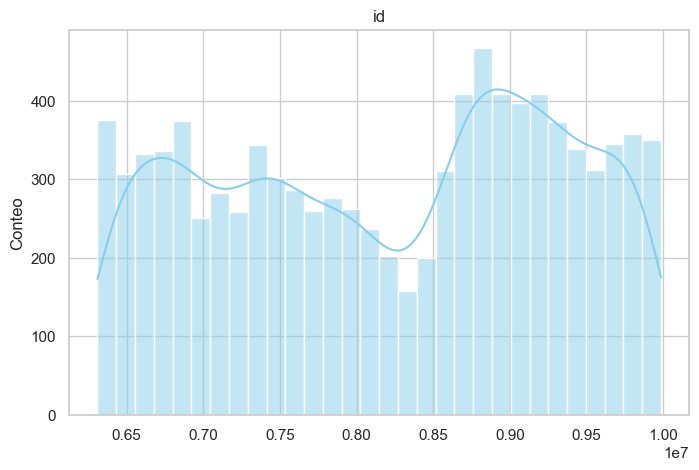

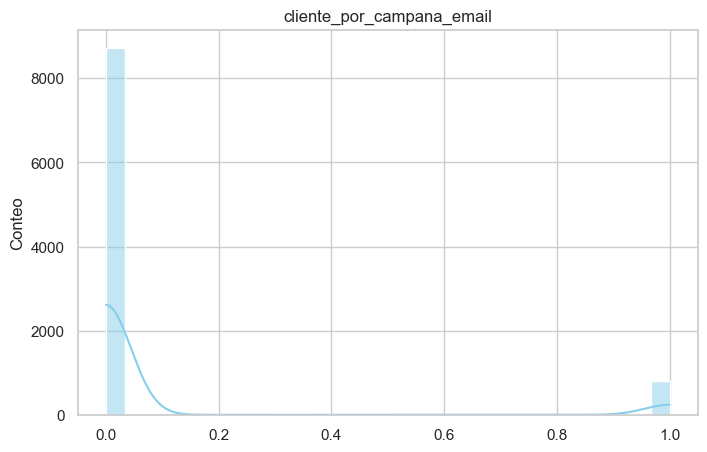

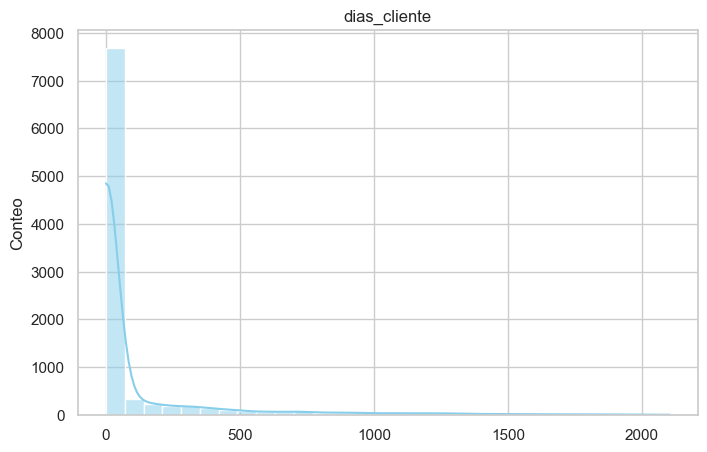

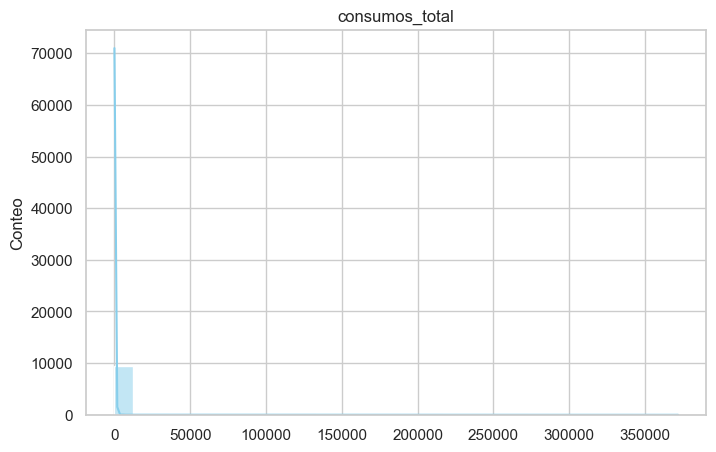

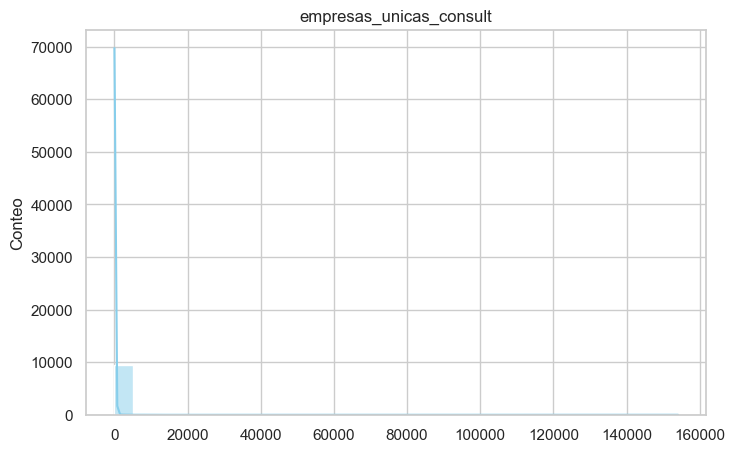

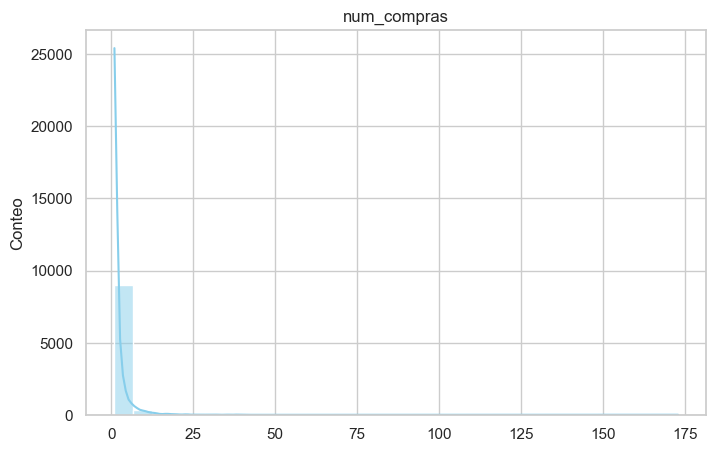

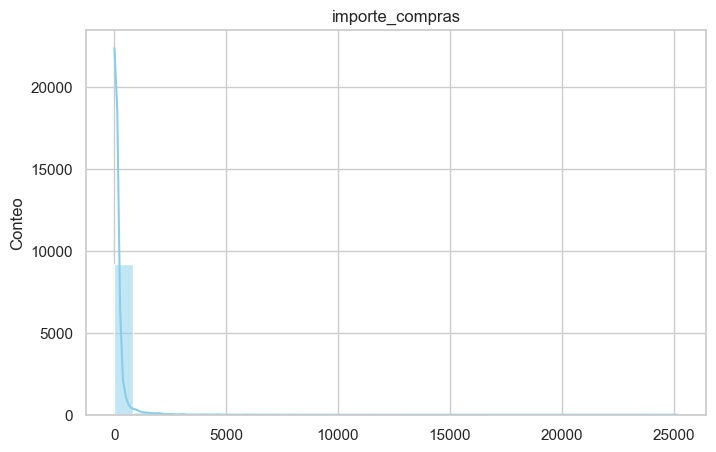

In [33]:
# Visualización de variables numéricas: histograma
num_cols = clientes.select_dtypes(include=[np.number]).columns

for col in num_cols:
    plt.figure(figsize=(8,5))
    sns.histplot(data=clientes, x=col, kde=True, bins=30, color="skyblue")
    plt.title(f"{col}")
    plt.xlabel("")
    plt.ylabel("Conteo")
    plt.grid(True)
    plt.show()

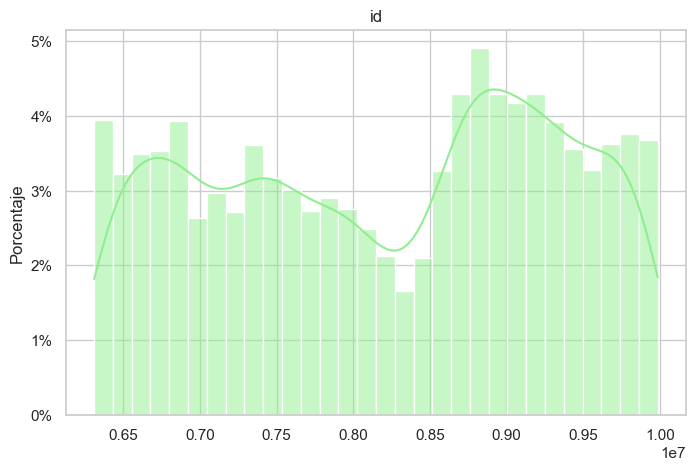

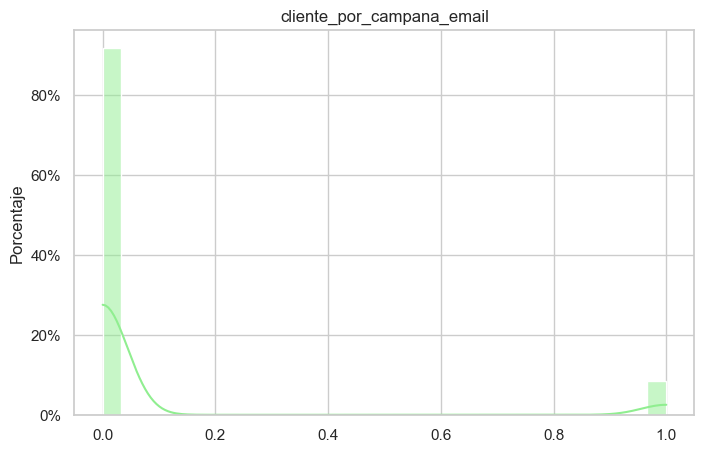

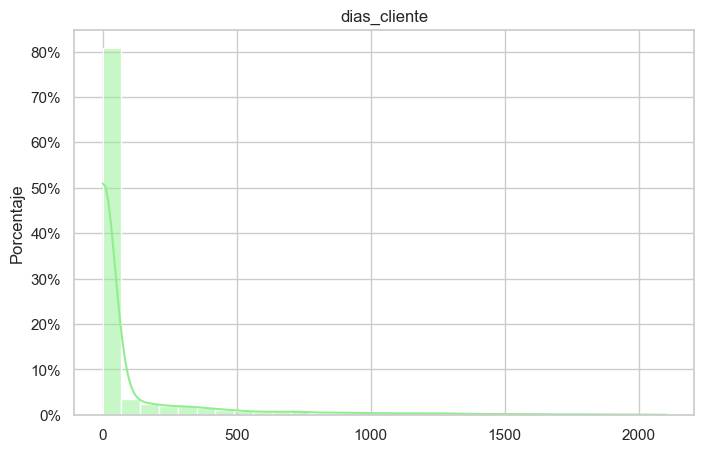

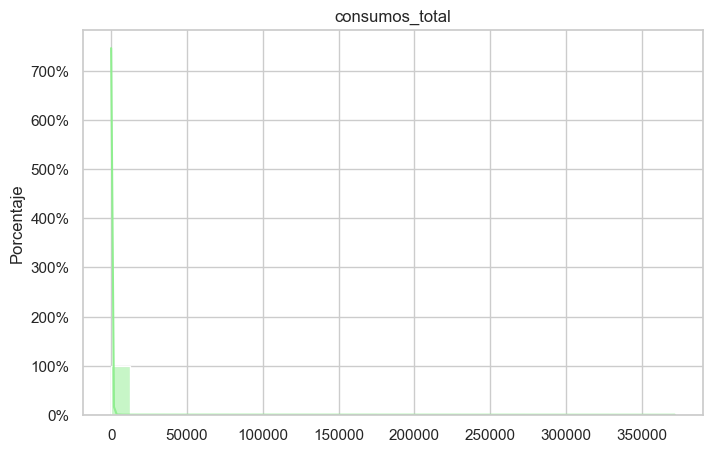

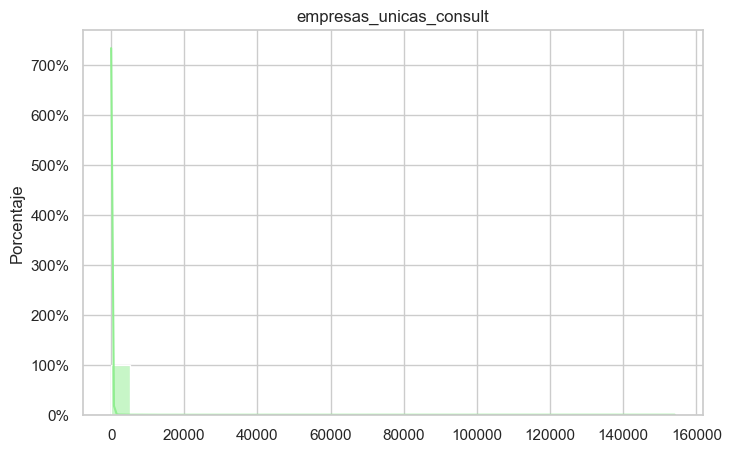

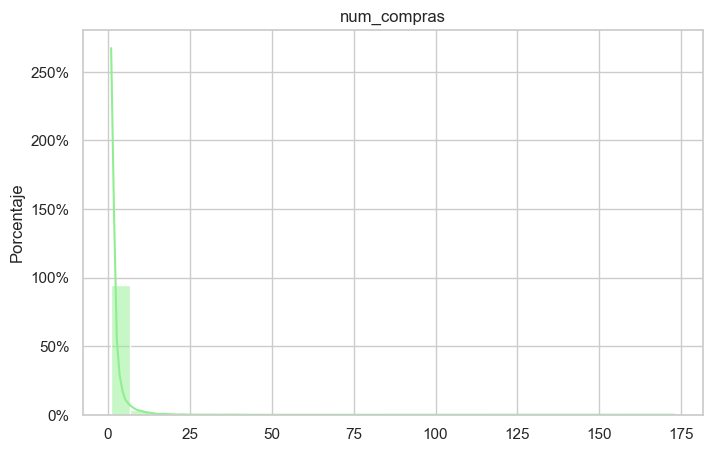

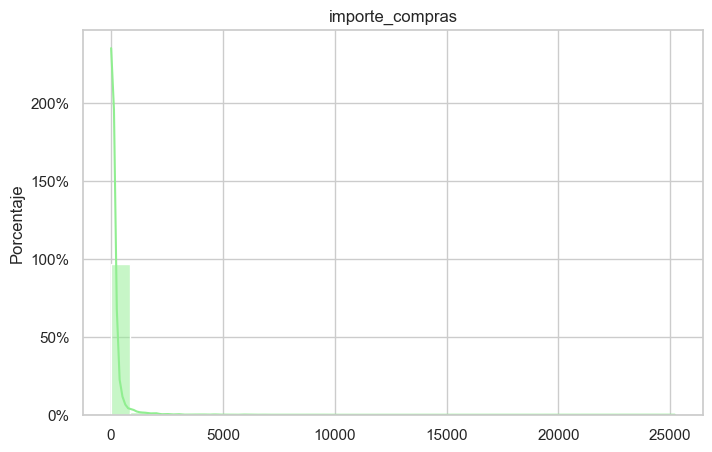

In [34]:
# Lo mismo de antes, pero en porcentaje

# Visualización de variables numéricas: histograma
num_cols = clientes.select_dtypes(include=[np.number]).columns

for col in num_cols:
    plt.figure(figsize=(8,5))
    sns.histplot(data=clientes, x=col, kde=True, bins=30, color="lightgreen", stat='percent')
    plt.title(f"{col}")
    plt.xlabel("")
    plt.ylabel("Porcentaje")
    plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
    plt.grid(True)
    plt.show()

* id: no tiene sentido analizarlo puesto que solo es el número de identificador del cliente.
* cliente_por_campana_email: es una variable dicotómica que identifica si el cliente compró por una campaña de email. Vemos que la inmensa mayoría no lo hicieron (por encima del 80%).
* dias_cliente: la inmensa mayoría de los clientes se convierten en clientes a los pocos días de registrarse, aunque algunos se demoran hasta 500 días (1 año y medio).
* consumos_total: la mayoría realizan un consumo de muy pocas unidades (prácticamente el 100%).
* empresas_unic_consult, num_compras, importe_compras: también se acumulan en números bajos.

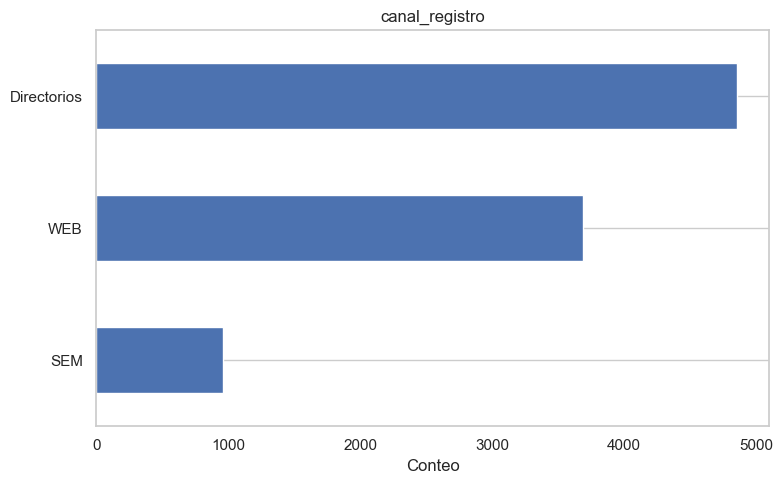

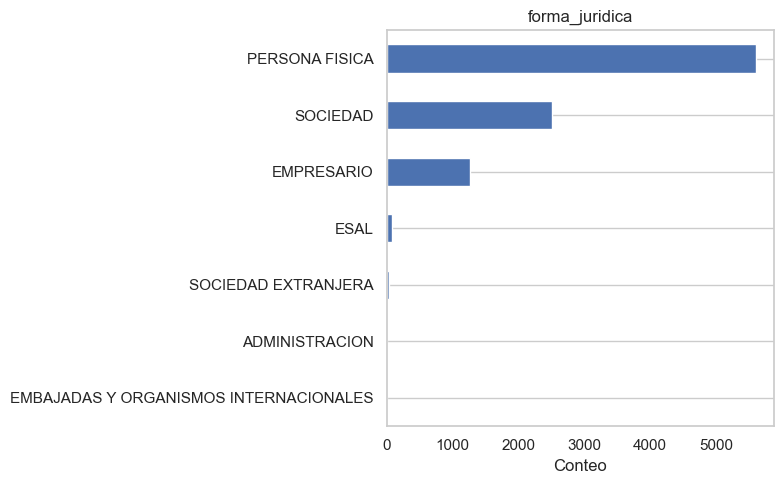

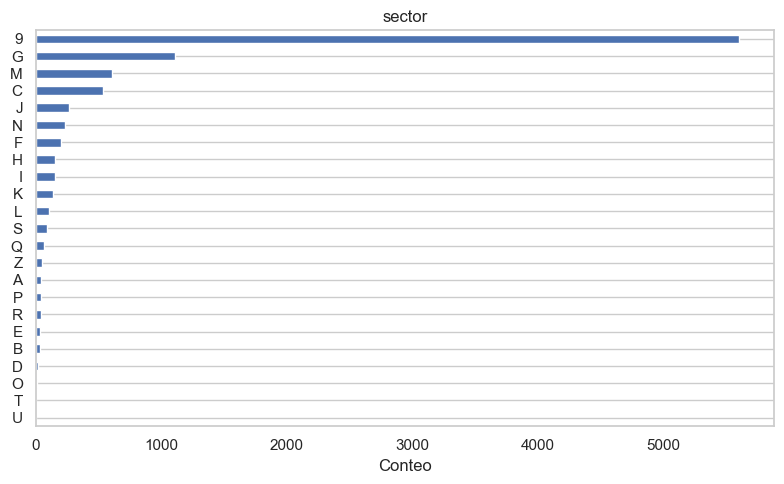

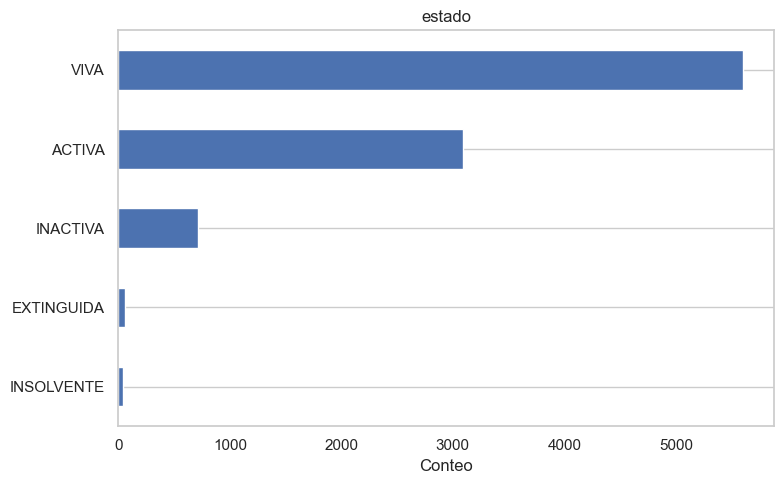

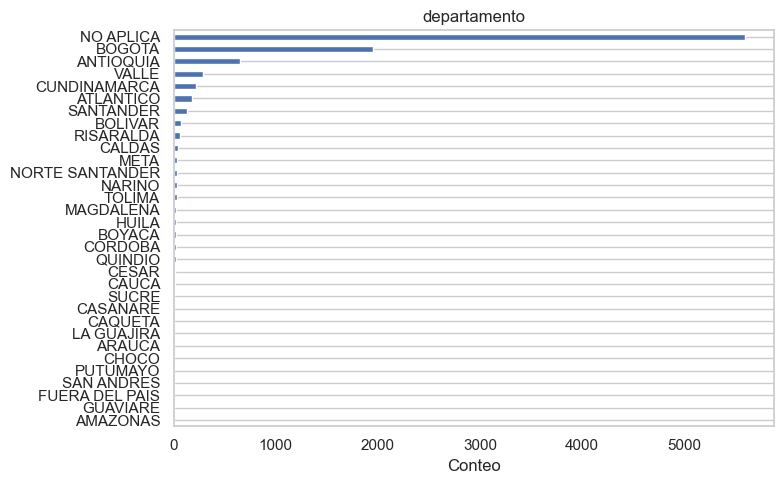

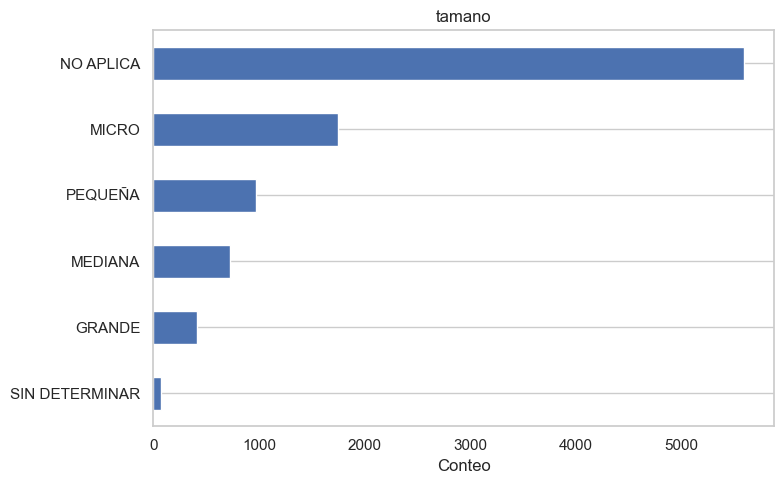

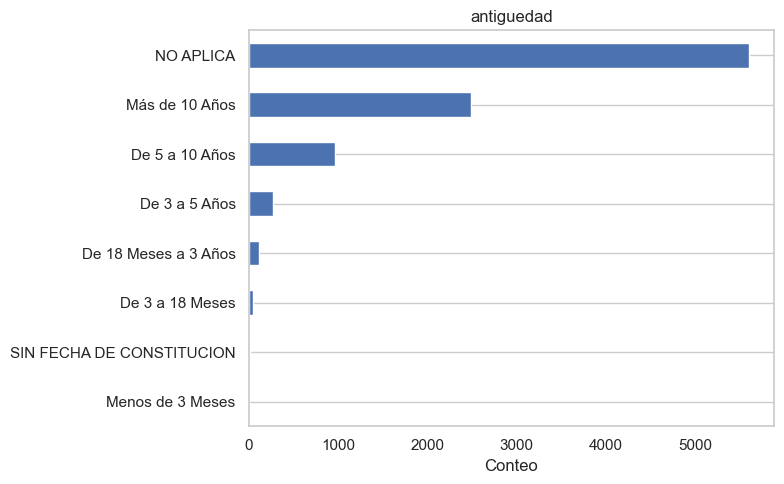

In [35]:
# Visualización de variables categóricas: gráfico de barras
for col in cat_cols:
    plt.figure(figsize=(8,5))
    clientes[col].value_counts(dropna=False).sort_values(ascending=True).plot(kind='barh')  # De mayor a menor.
    plt.title(f'{col}')
    plt.ylabel("")
    plt.xlabel('Conteo')
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

* canal_registro: el medio principal es el "Directorio".
* forma_juridica: la principal es la persona física.
* sector: el más relevante es el 9 (No sector).
* estado: la mayoría de empresas están activas o vivas (personas físicas). Aunque hay un número importante de empresas inanctivas.
* departamento: son empresas principalmente de Bogotá. Recordemos que hubo imputación de nulos: "NO APLICA".
* tamano: empresas micro y pequeñas. Recordemos que hubo imputación de nulos: "NO APLICA".
* antiguedad: mayoritariamente empresas que tienen más de 10 años o de 5 a 10 años. Recordemos que hubo imputación de nulos: "NO APLICA".

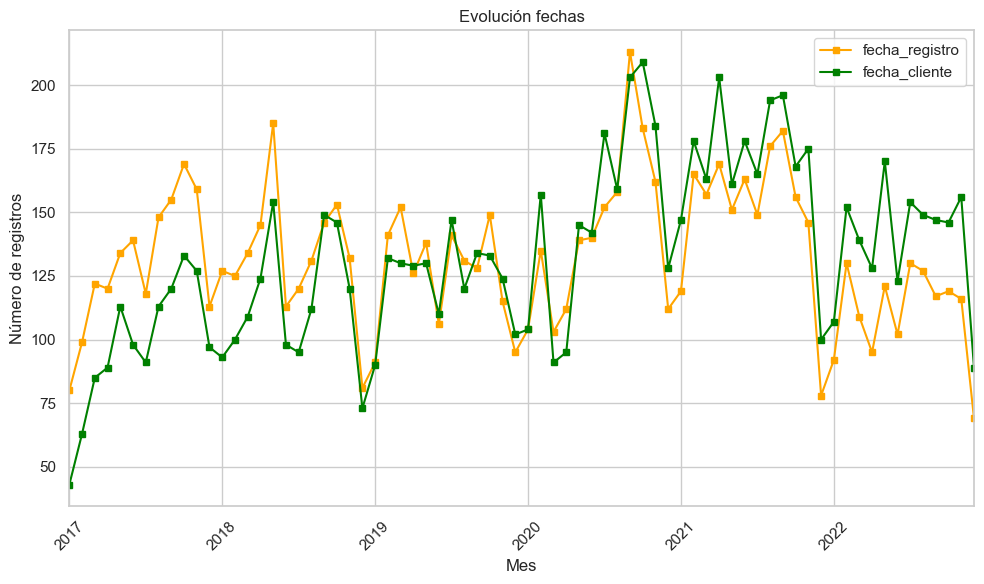

In [36]:
# Visualización de variables tipo fecha

# Variables tipo fecha
date_cols = clientes.select_dtypes(include='datetime')

plt.figure(figsize=(10, 6))

date_cols["fecha_registro"].dropna().dt.to_period("M").value_counts().sort_index().plot(kind='line',
                                                                                        marker='s',
                                                                                        markersize=4,
                                                                                        color='orange',
                                                                                        label="fecha_registro")

date_cols["fecha_cliente"].dropna().dt.to_period("M").value_counts().sort_index().plot(kind='line',
                                                                                       marker='s',
                                                                                       markersize=4,
                                                                                       color='green',
                                                                                       label="fecha_cliente")

plt.title(f"Evolución fechas")
plt.xlabel("Mes")
plt.ylabel("Número de registros")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

* El conteo de fecha_registro empieza siendo mayor que el fecha_cliente, pero a mitad del periodo (2020 aprox.) se produce un superación del número de clientes sobre el de registros y se mantiene así hasta el final.

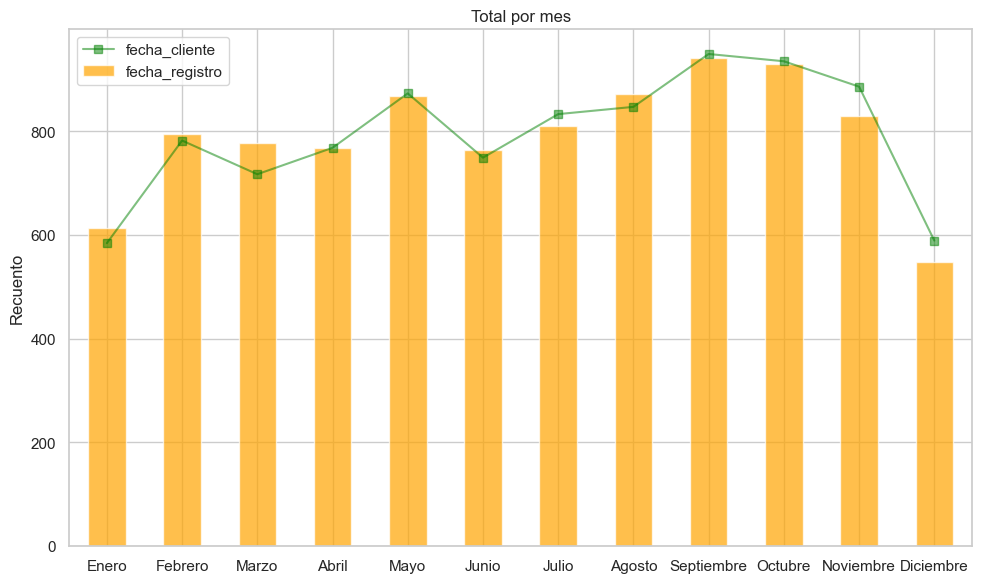

In [37]:
# Fechas: comportamiento estacional

# Agrupación por mes del año
fecha_registro_mensual = date_cols["fecha_registro"].dropna().dt.month.value_counts().sort_index()
fecha_cliente_mensual = date_cols["fecha_cliente"].dropna().dt.month.value_counts().sort_index()

# Mapeamos de número a nombre de mes
meses = {1: 'Enero', 2: 'Febrero', 3: 'Marzo', 4: 'Abril', 5: 'Mayo', 6: 'Junio',
         7: 'Julio', 8: 'Agosto', 9: 'Septiembre', 10: 'Octubre', 11: 'Noviembre', 12: 'Diciembre'}
fecha_registro_mensual.index = fecha_registro_mensual.index.map(meses)
fecha_cliente_mensual.index = fecha_cliente_mensual.index.map(meses)

# Gráfico de barras
plt.figure(figsize=(10, 6))
fecha_registro_mensual.plot(kind='bar', color='orange', alpha=0.7, label="fecha_registro")
fecha_cliente_mensual.plot(kind='line', color='green', alpha=0.5, marker='s', label="fecha_cliente")

# Ajustar etiquetas y leyendas
plt.title("Total por mes")
plt.xlabel("")
plt.ylabel("Recuento")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

* No se aprecia excesiva estacionalidad, a excepción de 2 picos (tras el verano, septiembre-octubre; y en primavera, mayo).
* El mes con un rendimiento menor es diciembre con gran diferencia, tal vez por las fiestas, y se recupera algo en enero.
* La mayor diferencia entre registros y clientes se produce el mes de noviembre, aunque los mayores números se alcanzan en septiembre y octubre.

### VENTAS

In [38]:
# Variables numéricas
ventas.describe(include=[np.number]).T

,count,mean,std,min,25%,50%,75%,max
id,20537.0,8.062244e+06,1.084786e+06,6308943.0,7100681.0,7997236.0,9012504.0,9987369.0
importe,20537.0,7.790052e+01,2.006320e+02,6.0,15.0,35.0,65.0,4875.0


In [39]:
# Variables categóricas
cat_cols = ventas.select_dtypes(include='category').columns

for col in cat_cols:
    print(f"\n🟢 {col.upper()} ({ventas[col].nunique()} categorías):")
    display(ventas[col].value_counts(dropna=False))


🟢 PRODUCTO_COMPRADO (3 categorías):


producto_comprado
VP Informe    18020
Bono           1807
Plan            710
Name: count, dtype: int64


🟢 CANAL_VENTA (2 categorías):


canal_venta
WEB           18478
CALLCENTER     2059
Name: count, dtype: int64

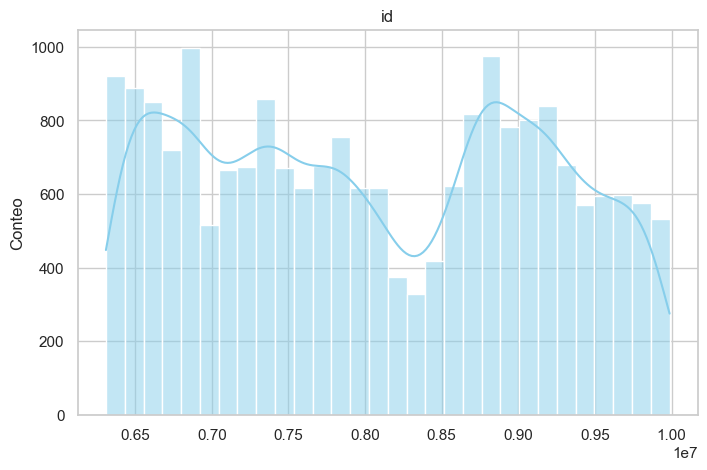

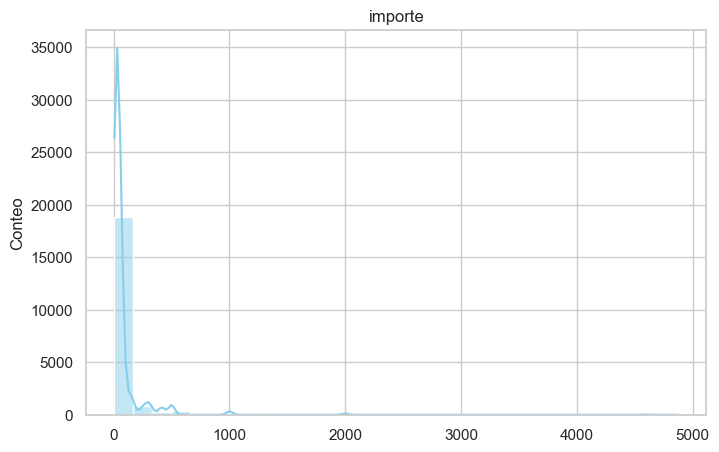

In [40]:
# Visualización de variables numéricas: histograma
num_cols = ventas.select_dtypes(include=[np.number]).columns

for col in num_cols:
    plt.figure(figsize=(8,5))
    sns.histplot(data=ventas, x=col, kde=True, bins=30, color="skyblue")
    plt.title(f"{col}")
    plt.xlabel("")
    plt.ylabel("Conteo")
    plt.grid(True)
    plt.show()

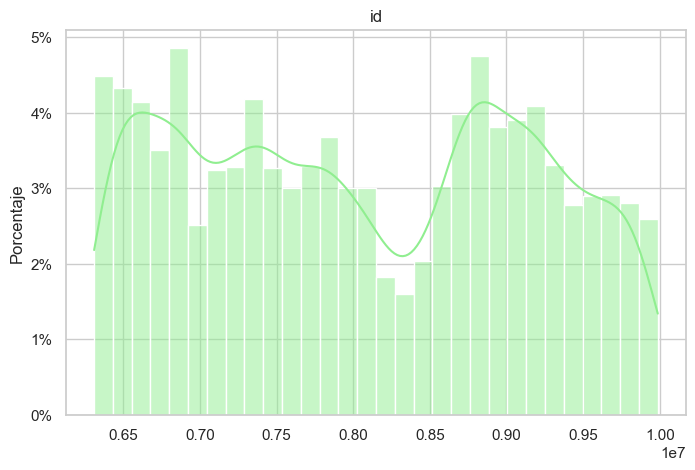

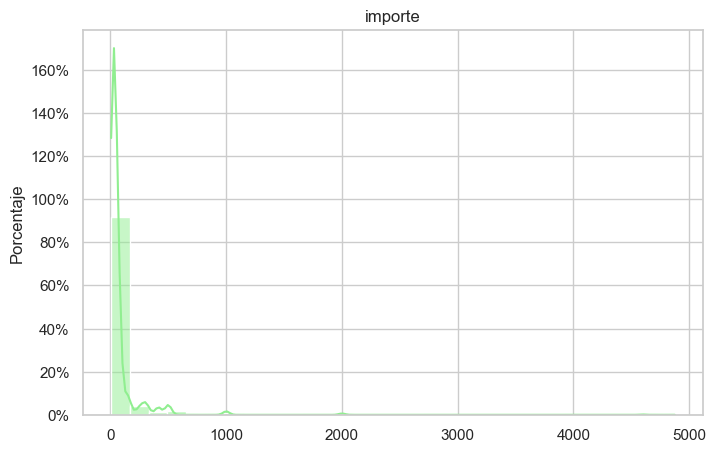

In [41]:
# Lo mismo de antes, pero en porcentaje

# Visualización de variables numéricas: histograma
num_cols = ventas.select_dtypes(include=[np.number]).columns

for col in num_cols:
    plt.figure(figsize=(8,5))
    sns.histplot(data=ventas, x=col, kde=True, bins=30, color="lightgreen", stat='percent')
    plt.title(f"{col}")
    plt.xlabel("")
    plt.ylabel("Porcentaje")
    plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
    plt.grid(True)
    plt.show()

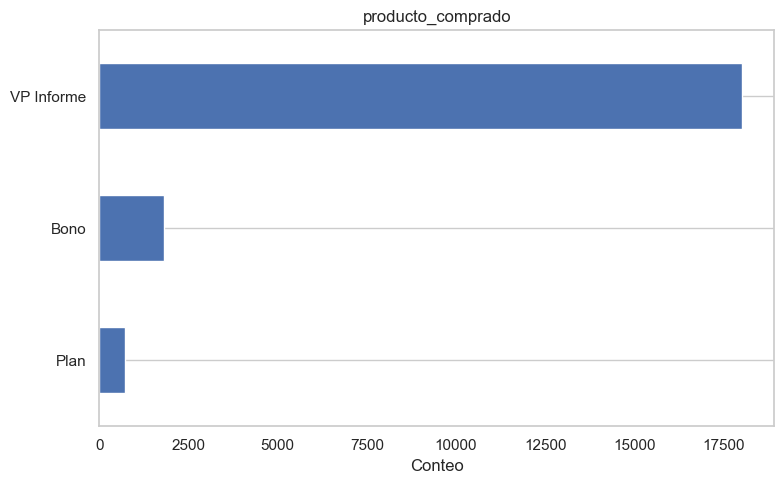

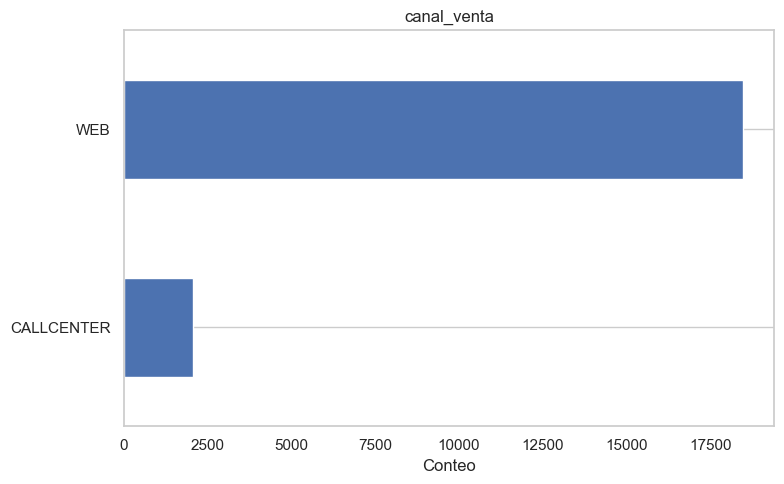

In [42]:
# Visualización de variables categóricas: gráfico de barras
for col in cat_cols:
    plt.figure(figsize=(8,5))
    ventas[col].value_counts(dropna=False).sort_values(ascending=True).plot(kind='barh')  # De mayor a menor.
    plt.title(f'{col}')
    plt.ylabel("")
    plt.xlabel('Conteo')
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

* Importes bajos.
* El producto más vendido es el "VP Informe".
* El canal de venta abrumaduramente mayoritarioa es el "Web".

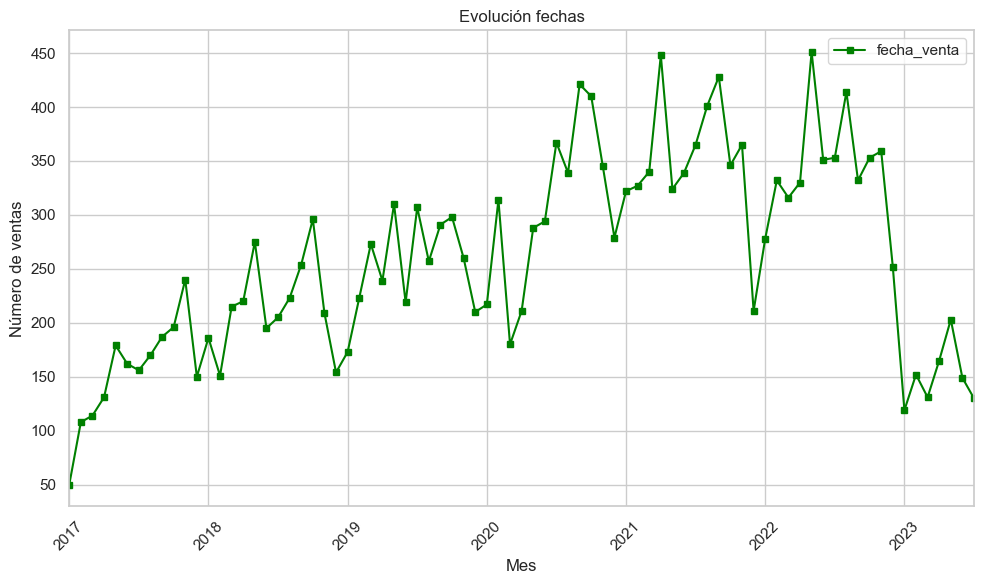

In [43]:
# Visualización de variables tipo fecha

# Variables tipo fecha
date_cols = ventas.select_dtypes(include='datetime')

plt.figure(figsize=(10, 6))

date_cols["fecha_venta"].dropna().dt.to_period("M").value_counts().sort_index().plot(kind='line',
                                                                                        marker='s',
                                                                                        markersize=4,
                                                                                        color='green',
                                                                                        label="fecha_venta")

plt.title(f"Evolución fechas")
plt.xlabel("Mes")
plt.ylabel("Número de ventas")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

* Vemos que las fechas de ventas se extienden algunos meses más en el tiempo respecto a las fechas de registro y fechas de clientes (visto en la anterior tabla).
* En los primeros meses de 2023 se ha producido una caida abrupta en el número de ventas.
* El resto del periodo (2017 - mediados de 202) muestra una tendencia creciente.

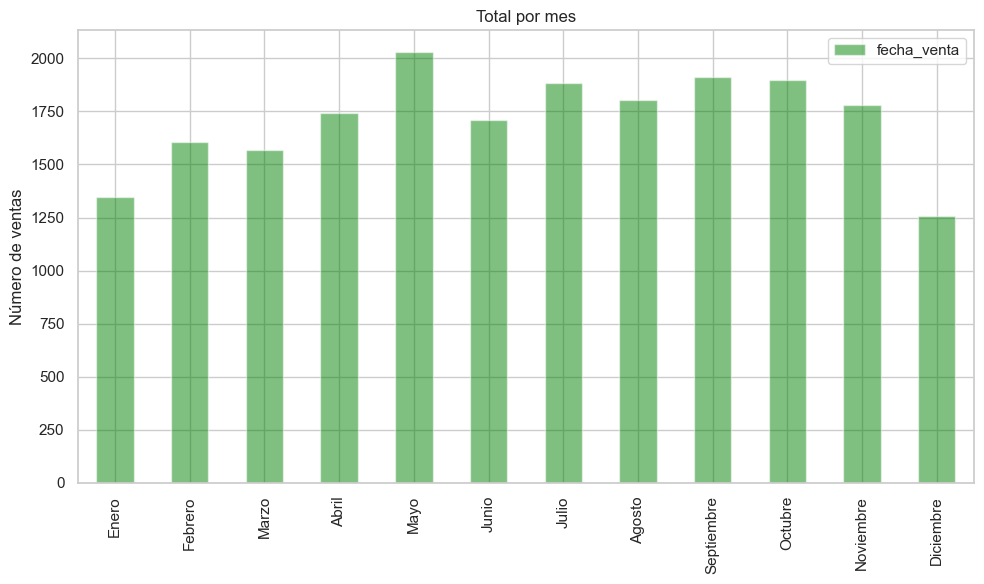

In [44]:
# Fechas: comportamiento estacional

# Agrupación por mes del año
fecha_venta_mensual = date_cols["fecha_venta"].dropna().dt.month.value_counts().sort_index()

# Mapeamos de número a nombre de mes
fecha_venta_mensual.index = fecha_venta_mensual.index.map(meses)

# Gráfico de barras
plt.figure(figsize=(10, 6))
fecha_venta_mensual.plot(kind='bar', color='green', alpha=0.5, label="fecha_venta")

# Ajustar etiquetas y leyendas
plt.title("Total por mes")
plt.xlabel("")
plt.ylabel("Número de ventas")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

* El mayor número de ventas se producen en mayo.
* El mes más flojo en este sentido es diciembre, y luego enero.

### CONSULTAS

In [45]:
# Variables numéricas
consultas.describe(include=[np.number]).T

,count,mean,std,min,25%,50%,75%,max
id_consumo,958296.0,6.481346e+07,1.183856e+07,34367922.0,55919896.75,65702276.5,74605364.5,83658335.0
id,958296.0,7.259283e+06,9.906150e+05,6308758.0,6500105.00,6785767.0,7421377.0,9986838.0


In [46]:
# Variables categóricas
cat_cols = consultas.select_dtypes(include='category').columns

for col in cat_cols:
    print(f"\n🟢 {col.upper()} ({consultas[col].nunique()} categorías):")
    display(consultas[col].value_counts(dropna=False))


🟢 PRODUCTO (7 categorías):


producto
Ficha                 908837
Perfil                 17543
Reporte Financiero     10193
Riesgo                  8537
Balance y CR            6683
Reporte Comercial       5820
Perfil Promocional       683
Name: count, dtype: int64


🟢 EMP_CONSUL_SECTOR (22 categorías):


emp_consul_sector
G    320920
C    148929
N     70343
I     63267
F     59591
M     51840
H     45052
J     31902
S     31032
Q     26656
K     18036
A     17508
Z     12047
R     11588
P     11136
O     10585
L     10196
B      8820
E      6053
D      2599
U       100
T        96
Name: count, dtype: int64


🟢 EMP_CONSUL_TAMANO (5 categorías):


emp_consul_tamano
MICRO             501879
GRANDE            158549
PEQUEÑA           147326
MEDIANA           121961
SIN DETERMINAR     28581
Name: count, dtype: int64


🟢 EMP_CONSUL_DEPARTAMENTO (34 categorías):


emp_consul_departamento
BOGOTA             390270
ANTIOQUIA          135991
VALLE               78964
CUNDINAMARCA        58715
ATLANTICO           46628
SANTANDER           39916
BOLIVAR             19520
META                17051
BOYACA              16171
TOLIMA              16048
NORTE SANTANDER     15929
RISARALDA           14125
CALDAS              12725
MAGDALENA           12428
CORDOBA             10985
CESAR               10872
NARINO               9448
HUILA                9323
QUINDIO              8027
LA GUAJIRA           6473
CAUCA                6196
SUCRE                4863
CASANARE             4761
CHOCO                3489
PUTUMAYO             2752
ARAUCA               2496
CAQUETA              1878
SAN ANDRES            859
GUAVIARE              834
AMAZONAS              315
VICHADA               173
VAUPES                 41
FUERA DEL PAIS         21
GUAINIA                 9
Name: count, dtype: int64


🟢 EMP_CONSUL_ESTADO (4 categorías):


emp_consul_estado
ACTIVA        684666
INACTIVA      222566
EXTINGUIDA     33019
INSOLVENTE     13791
NaN             4254
Name: count, dtype: int64

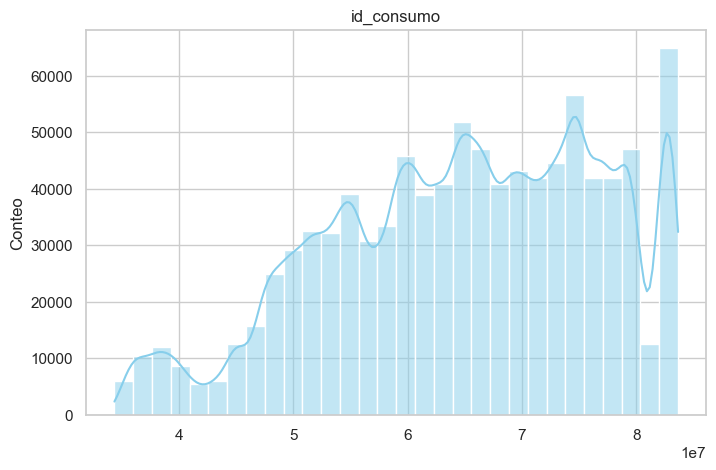

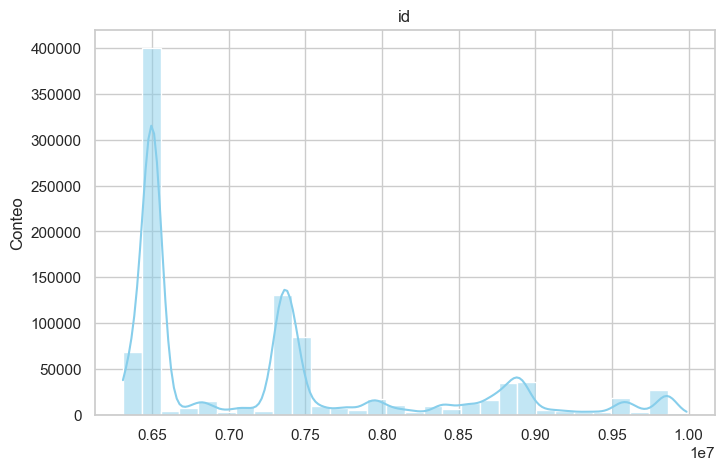

In [47]:
# Visualización de variables numéricas: histograma
num_cols = consultas.select_dtypes(include=[np.number]).columns

for col in num_cols:
    plt.figure(figsize=(8,5))
    sns.histplot(data=consultas, x=col, kde=True, bins=30, color="skyblue")
    plt.title(f"{col}")
    plt.xlabel("")
    plt.ylabel("Conteo")
    plt.grid(True)
    plt.show()

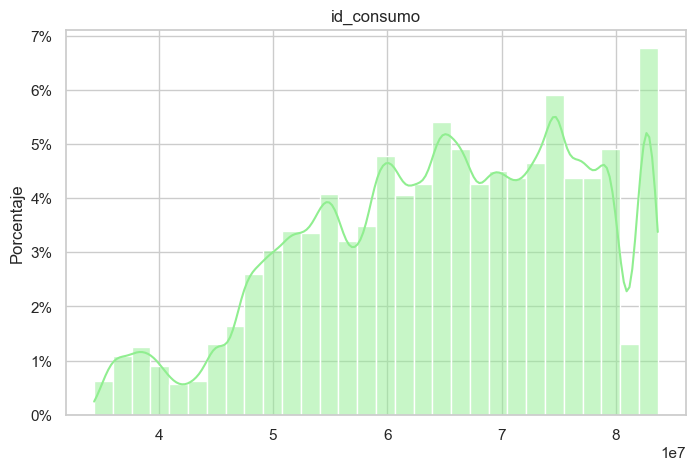

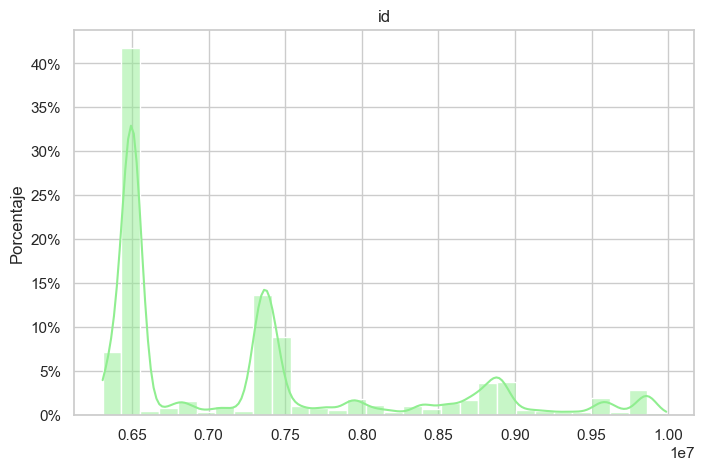

In [48]:
# Lo mismo de antes, pero en porcentaje

# Visualización de variables numéricas: histograma
num_cols = consultas.select_dtypes(include=[np.number]).columns

for col in num_cols:
    plt.figure(figsize=(8,5))
    sns.histplot(data=consultas, x=col, kde=True, bins=30, color="lightgreen", stat='percent')
    plt.title(f"{col}")
    plt.xlabel("")
    plt.ylabel("Porcentaje")
    plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(decimals=0))
    plt.grid(True)
    plt.show()

* Los identificadores de los clientes que más consultas hacen se acumulan en ciertos números (!).

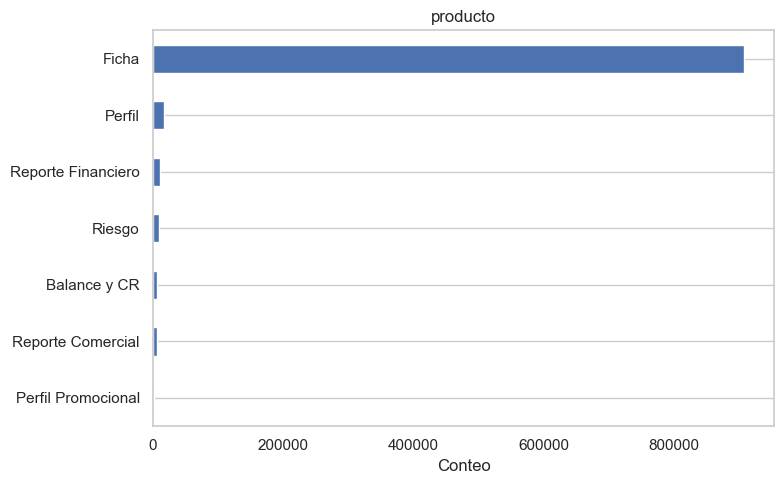

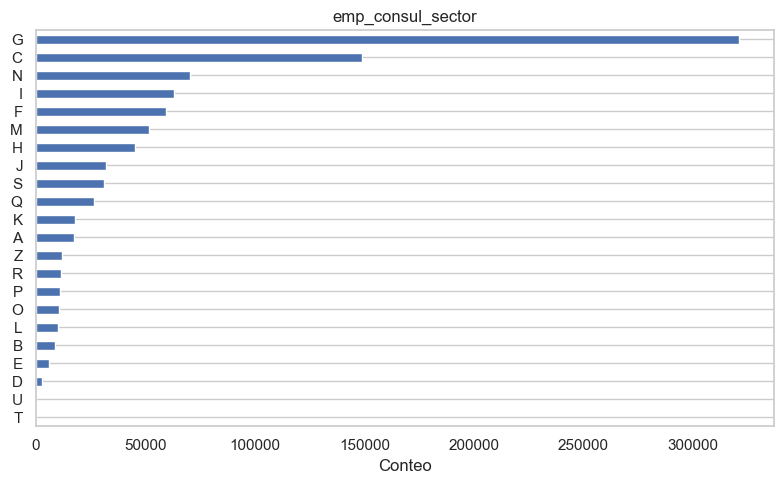

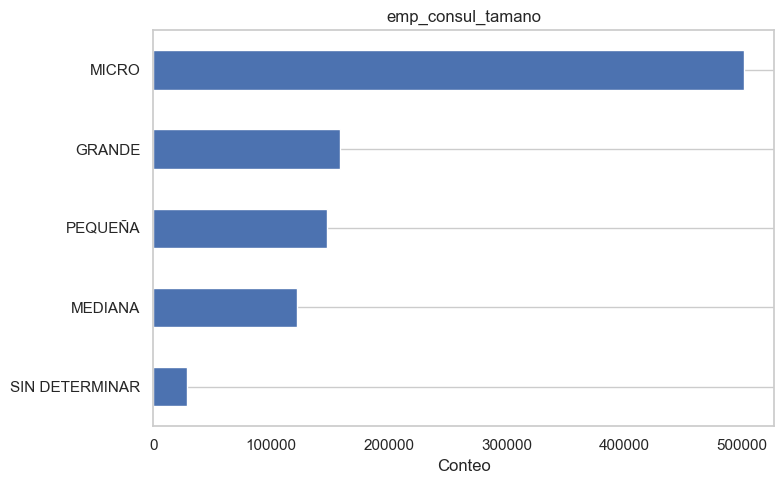

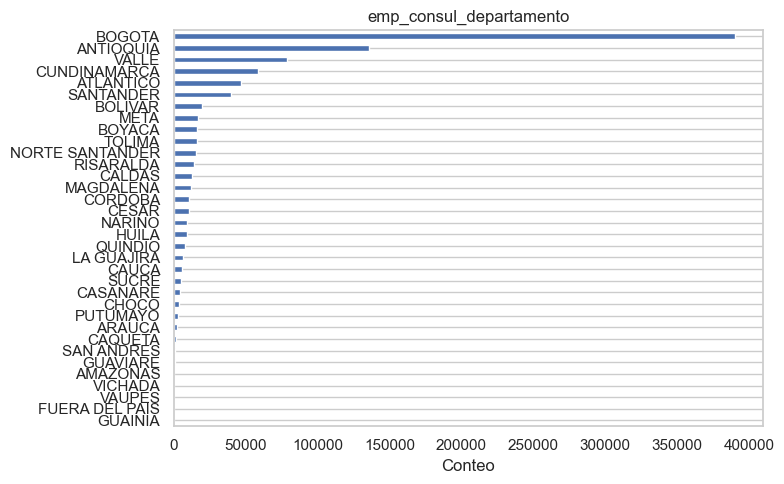

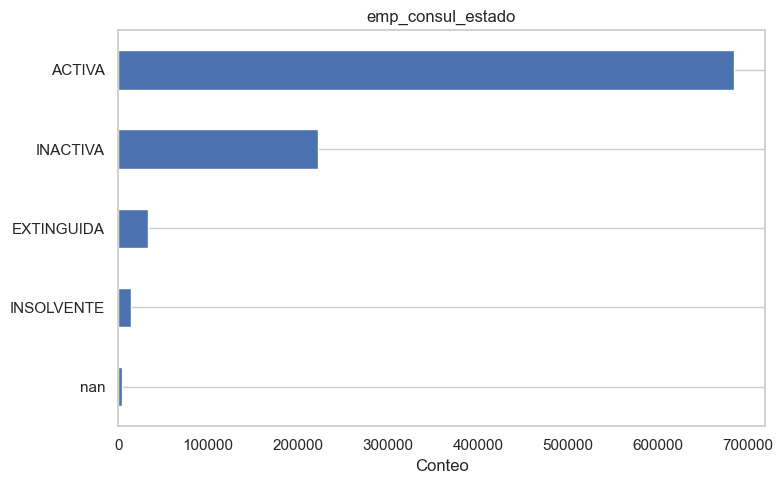

In [49]:
# Visualización de variables categóricas: gráfico de barras
for col in cat_cols:
    plt.figure(figsize=(8,5))
    consultas[col].value_counts(dropna=False).sort_values(ascending=True).plot(kind='barh')  # De mayor a menor.
    plt.title(f'{col}')
    plt.ylabel("")
    plt.xlabel('Conteo')
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

* El producto más consultado, con enorme diferencias, es la "ficha".
* El sector principal de las empresas consultadas es G ("Comercio al por mayor y al por menor; reparación de vehículos automotores y motocicletas") y C (Industrias manufactureras).
* Las empresas más conultadas con las micro, pero las segundas son las grandes.
* Las empresas más consultadas están en Bogotá y, luego, en Antioquia.
* Las empresas más consultadas son las activas y, luego, las inactivas. También hay cierto número de consultas sobre empresas extinguidas.

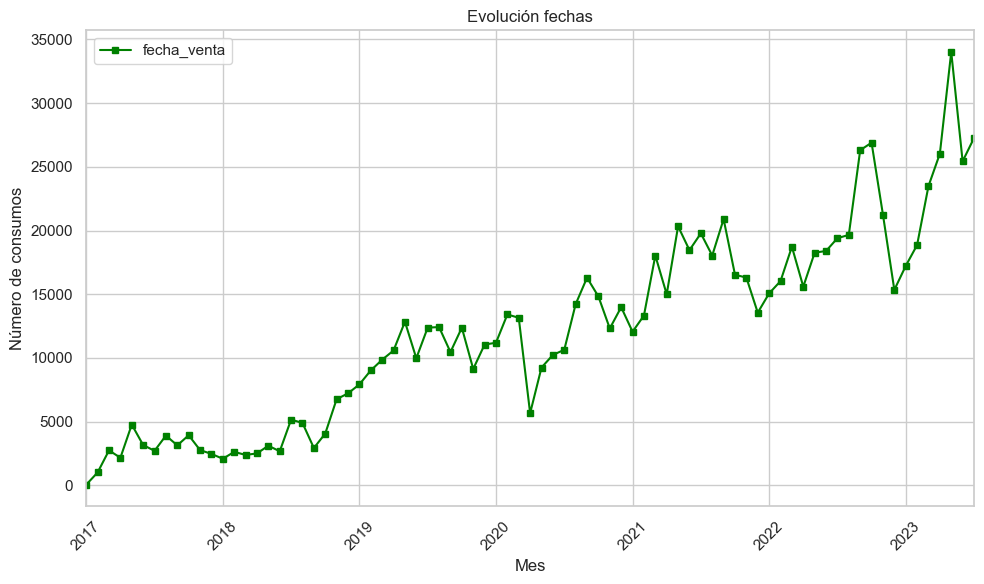

In [50]:
# Visualización de variables tipo fecha

# Variables tipo fecha
date_cols = consultas.select_dtypes(include='datetime')

plt.figure(figsize=(10, 6))

date_cols["fecha_consumo"].dropna().dt.to_period("M").value_counts().sort_index().plot(kind='line',
                                                                                        marker='s',
                                                                                        markersize=4,
                                                                                        color='green',
                                                                                        label="fecha_venta")

plt.title(f"Evolución fechas")
plt.xlabel("Mes")
plt.ylabel("Número de consumos")
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

* El número de consumos es creciente a lo largo del tiempo. Esto es diferente al número de ventas, en el que vimos que la tendencia creciente se rompía a medidados de 2022.

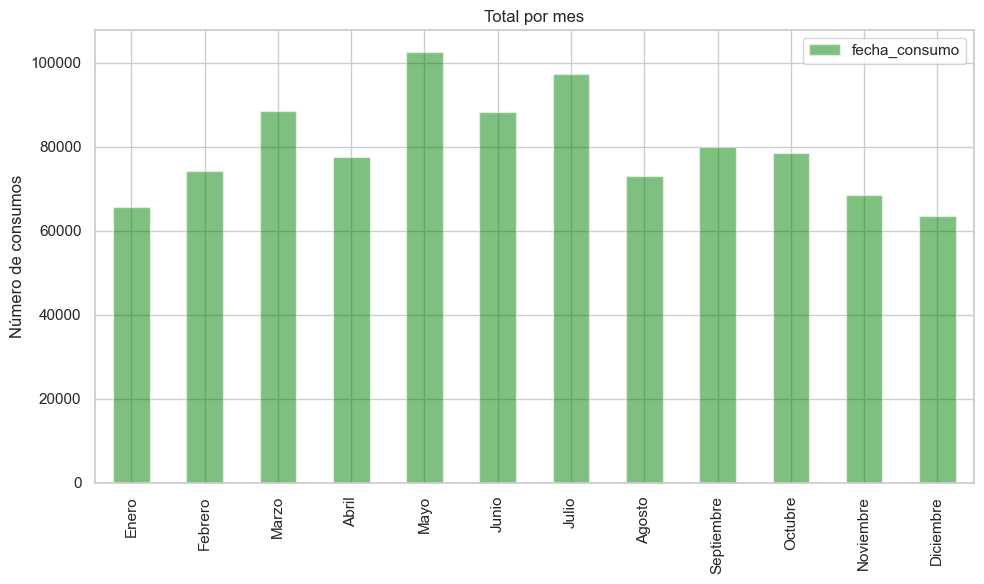

In [51]:
# Fechas: comportamiento estacional

# Agrupación por mes del año
fecha_consumo_mensual = date_cols["fecha_consumo"].dropna().dt.month.value_counts().sort_index()

# Mapeamos de número a nombre de mes
fecha_consumo_mensual.index = fecha_consumo_mensual.index.map(meses)

# Gráfico de barras
plt.figure(figsize=(10, 6))
fecha_consumo_mensual.plot(kind='bar', color='green', alpha=0.5, label="fecha_consumo")

# Ajustar etiquetas y leyendas
plt.title("Total por mes")
plt.xlabel("")
plt.ylabel("Número de consumos")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

* Vemos el pico de consumos en el mes de mayo.
* Diciembre y enero son los peores meses para el número de consumos.

## Creación tabla conjunta: clientes_agg

### ventas_grouped

In [52]:
# Agrupo por id de cliente en la tabla ventas
ventas_grouped = ventas.groupby('id').agg(
    n_ventas=('id', 'count'),  # Conteo ventas. (= num_compras = frequency)
    total_gastado=('importe', 'sum'),  # Gasto total. (= importe_compras = monetary)
    media_gasto=('importe', 'mean'),  # Gasto medio.
    fecha_primera_compra=('fecha_venta', 'min'),  # Fecha inicial.
    fecha_ultima_compra=('fecha_venta', 'max'),
    dias_compra=('fecha_venta', 'nunique')  # Nº de días diferentes de compra.
    ).reset_index()  # Fecha final. (necesaria para calcular Recency)

In [53]:
ventas_grouped

,id,n_ventas,total_gastado,media_gasto,fecha_primera_compra,fecha_ultima_compra,dias_compra
0,6308943,1,21,21.000000,2017-01-02,2017-01-02,1
1,6309102,1,22,22.000000,2017-01-11,2017-01-11,1
2,6309127,11,255,23.181818,2017-01-02,2022-12-17,8
3,6309222,6,150,25.000000,2019-07-19,2019-11-22,5
4,6309425,1,15,15.000000,2017-01-03,2017-01-03,1
...,...,...,...,...,...,...,...
9507,9986112,1,25,25.000000,2022-12-28,2022-12-28,1
9508,9986838,1,15,15.000000,2022-12-29,2022-12-29,1
9509,9986853,1,22,22.000000,2022-12-29,2022-12-29,1
9510,9987063,1,15,15.000000,2022-12-29,2022-12-29,1


In [54]:
# Días promedio entre compras (si hay más de una compra)
ventas_grouped['dias_entre_compras'] = (
    (ventas_grouped['fecha_ultima_compra'] - ventas_grouped['fecha_primera_compra']).dt.days
) / (ventas_grouped['n_ventas'] - 1).replace(0, np.nan)

### consultas_grouped

In [55]:
# Agregación por id de cliente en la tabla consultas
consultas_grouped = consultas.groupby('id').agg(
    n_consultas=('id', 'count'),  # Conteo de consultas.
    dias_distintos_consulta=('fecha_consumo', lambda x: x.dt.date.nunique()),  # Nº días en los que hay consultas.
    n_productos_distintos=('producto', 'nunique'),  # Número de productos distintos sobre los que consulta.
    n_tamanos_distintos=('emp_consul_tamano', 'nunique'),  # Nº de tamaños distintos consultados.
    n_sectores_distintos=('emp_consul_sector', 'nunique'),  # Nº de sectores distintos consultados.
    fecha_primera_consulta=('fecha_consumo', 'min'),  # Fecha inicial de consulta.
    fecha_ultima_consulta=('fecha_consumo', 'max')).reset_index()  # Fecha final de consulta.

In [56]:
# Días entre la primera y última consulta
consultas_grouped['dias_consulta'] = (
    (consultas_grouped['fecha_ultima_consulta'] - consultas_grouped['fecha_primera_consulta']).dt.days)

In [57]:
# Consultas promedio por día activo (evitando división por 0)
consultas_grouped['consultas_por_dia'] = (
    consultas_grouped['n_consultas'] / consultas_grouped['dias_distintos_consulta'].replace(0, np.nan))

In [58]:
# Rellenar nulos con ceros
# consultas_grouped['dias_consulta'] = consultas_grouped['dias_consulta'].fillna(0)
# consultas_grouped['consultas_por_dia'] = consultas_grouped['consultas_por_dia'].fillna(0)

### Unión con clientes en clientes_agg

In [59]:
# Unión con datos de ventas
clientes_agg = clientes.merge(ventas_grouped, on='id', how='left')

In [60]:
# Unión con datos de consultas
clientes_agg = clientes_agg.merge(consultas_grouped, on='id', how='left')

* Puede haber clientes, tras la unión de tablas, que NO tengan consultas realizadas, pero sean clientes. Por tanto, existen en una tabla y no en la otra.
* Esto genera valores NaN y sin fecha (NaT -not a time-).

In [61]:
# Relleno de nulos en variables numéricas (ventas y consultas)
cols_numericas = ['media_gasto', 'dias_entre_compras',
                  'n_consultas', 'dias_distintos_consulta',
                  'n_productos_distintos', 'n_tamanos_distintos',
                  'n_sectores_distintos', 'dias_consulta', 'consultas_por_dia']

for col in cols_numericas:
    if col in clientes_agg.columns:
        clientes_agg[col] = clientes_agg[col].fillna(0)

In [62]:
# Rellenar nulos en fechas con NaT (manteniendo tipo datetime)
cols_fechas = ['fecha_primera_compra', 'fecha_ultima_compra',
               'fecha_primera_consulta', 'fecha_ultima_consulta']

for col in cols_fechas:
    if col in clientes_agg.columns:
        clientes_agg[col] = clientes_agg[col].fillna(pd.NaT)

Esto permite que la tabla "clientes_agg" incluya:
* Perfil del cilente.
* Comportamiento de compra del cliente (importe, frecuencia).
* Comportamiento de "navegación o acciones" del cliente:
    - Número de productos consultados.
    - Número de tamaños y sectores consultados.
    - Intensidad y duración de la actividad.

In [63]:
# Recordemos que las variables 'n_ventas' y 'total_gastado' son iguales
# a 'num_compras' y 'importe_compras', respectivamente.
# Es decir: n_ventas = num_compras = FREQUENCY
#           total_gastado = importe_compras = MONETARY

# Por tanto, eliminamos 'n_ventas' y 'total_gastado'
clientes_agg = clientes_agg.drop(columns=['n_ventas', 'total_gastado'])

# Estructura final de la tabla "clientes_agg"
clientes_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9512 entries, 0 to 9511
Data columns (total 31 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   id                         9512 non-null   int64         
 1   fecha_registro             9512 non-null   datetime64[ns]
 2   canal_registro             9512 non-null   category      
 3   fecha_cliente              9512 non-null   datetime64[ns]
 4   cliente_por_campana_email  9512 non-null   int64         
 5   forma_juridica             9512 non-null   category      
 6   sector                     9512 non-null   category      
 7   desc_sector                9512 non-null   object        
 8   estado                     9512 non-null   category      
 9   departamento               9512 non-null   category      
 10  tamano                     9512 non-null   category      
 11  antiguedad                 9512 non-null   category      
 12  dias_c

## Relaciones entre variables. Categórica vs Numérica

### tamano vs importe_compras

In [64]:
# Nulos en las variables a estudiar
clientes_agg[['tamano', 'importe_compras']].isna().sum()

tamano             0
importe_compras    0
dtype: int64

In [65]:
# Evitamos los nulos en ambas variables (por si da errores)
df_plot = clientes_agg[['tamano', 'importe_compras']].dropna()

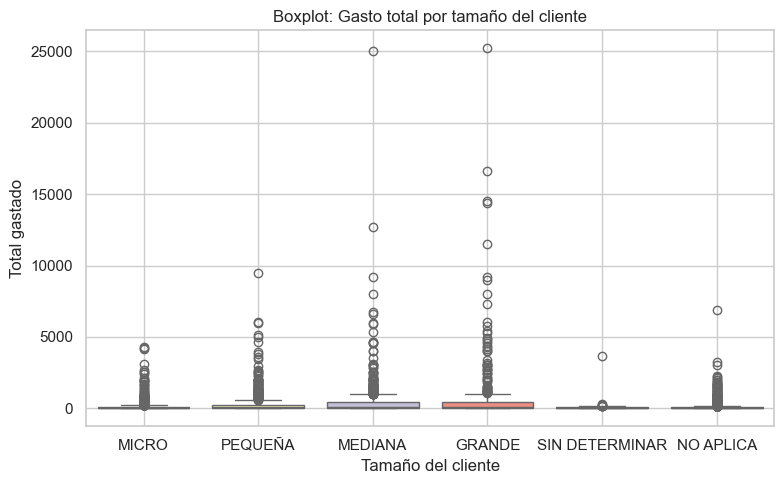

In [66]:
# Boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_plot, x='tamano', y='importe_compras', hue='tamano', palette='Set3', legend=False)
plt.title('Boxplot: Gasto total por tamaño del cliente')
plt.xlabel('Tamaño del cliente')
plt.ylabel('Total gastado')
plt.grid(True)
plt.tight_layout()
plt.show()

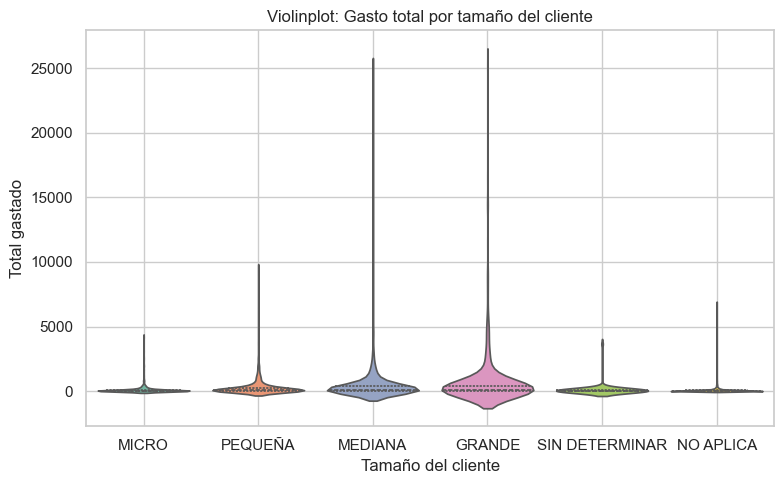

In [67]:
# Violinplot
plt.figure(figsize=(8, 5))
sns.violinplot(data=df_plot, x='tamano', y='importe_compras', palette='Set2',
               hue='tamano', inner='quartile', legend=False)
plt.title('Violinplot: Gasto total por tamaño del cliente')
plt.xlabel('Tamaño del cliente')
plt.ylabel('Total gastado')
plt.grid(True)
plt.tight_layout()
plt.show()

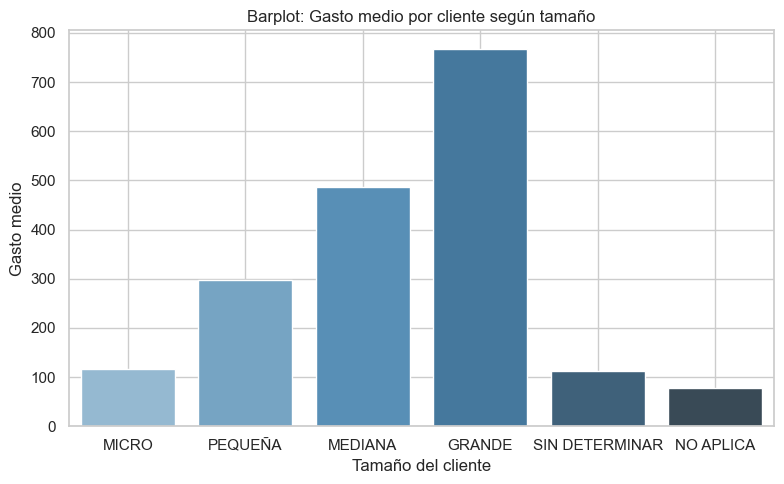

In [68]:
# Barplot de medias
media_gasto_por_tamano = df_plot.groupby('tamano', observed=True)['importe_compras'].mean().reset_index()

plt.figure(figsize=(8, 5))
sns.barplot(data=media_gasto_por_tamano, x='tamano', y='importe_compras',
            hue='tamano', palette='Blues_d', legend=False)
plt.title('Barplot: Gasto medio por cliente según tamaño')
plt.xlabel('Tamaño del cliente')
plt.ylabel('Gasto medio')
plt.grid(True)
plt.tight_layout()
plt.show()

* Hay outliers en todos los tamaños, destacando GRANDE y MEDIANA.
* **A mayor tamaño del cliente, mayor gasto promedio.** SIN DETERMINAR es un caso similar a MICRO.

### canal_registro vs consumos_total

In [69]:
# Recordamos nulos
clientes_agg[['canal_registro', 'n_consultas']].isna().sum()

canal_registro    0
n_consultas       0
dtype: int64

In [70]:
# Selección de datos (no haría falta el dropna)
df_plot = clientes_agg[['canal_registro', 'n_consultas']].dropna()

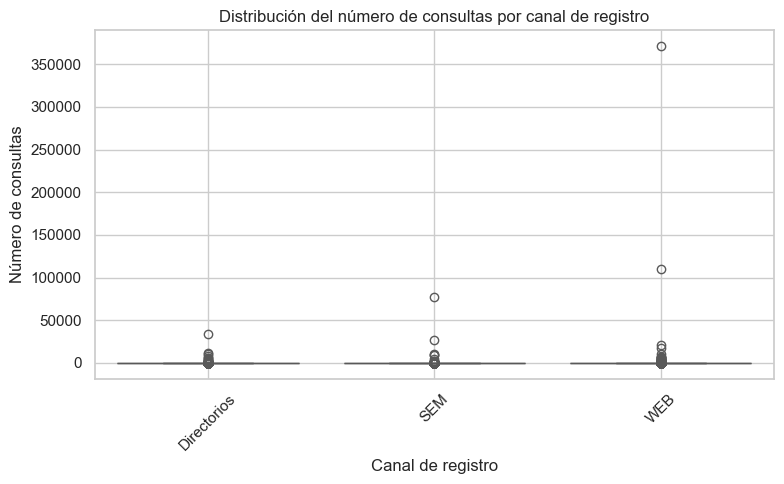

In [71]:
# Boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_plot, x='canal_registro', y='n_consultas',
            hue='canal_registro', palette='Set2', legend=False)
plt.title('Distribución del número de consultas por canal de registro')
plt.xlabel('Canal de registro')
plt.ylabel('Número de consultas')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

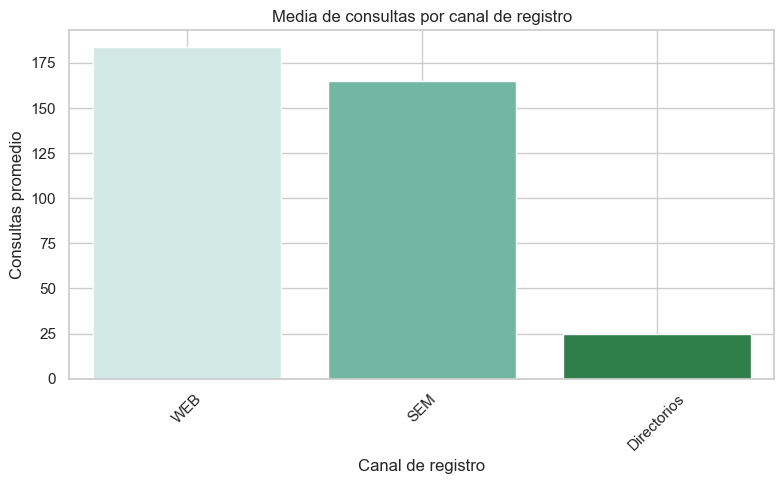

In [72]:
# Barplot de medias
media_consultas_canal = df_plot.groupby('canal_registro', observed=True)['n_consultas'].mean().reset_index()

# Orden descendente
media_consultas_canal = media_consultas_canal.sort_values(by='n_consultas', ascending=False)
orden_canal = media_consultas_canal['canal_registro'].tolist()

plt.figure(figsize=(8, 5))
sns.barplot(data=media_consultas_canal, x='canal_registro', y='n_consultas',
            hue='canal_registro', palette='BuGn_r', legend=False, order=orden_canal)
plt.title('Media de consultas por canal de registro')
plt.xlabel('Canal de registro')
plt.ylabel('Consultas promedio')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

* Hay dispersión en el número de consultas por canal de registro. La actividad de los usuarios parece ligeramente superior en WEB que en SEM. Directorios tiene el menor rango de actividad.
* Los canales **WEB y SEM** (Search Engine Marketing -Marketing en Motores de Búsqueda-) **generan un número de consultas promedio (+150) muy superior a Directorios (25)**. Es decir, x6-x7 veces más.

### sector vs media_gasto

In [73]:
# Recordamos número de nulos
clientes_agg[['sector', 'media_gasto']].isna().sum()

sector         0
media_gasto    0
dtype: int64

In [74]:
# Selección de datos
df_plot = clientes_agg[['sector', 'media_gasto']].dropna()

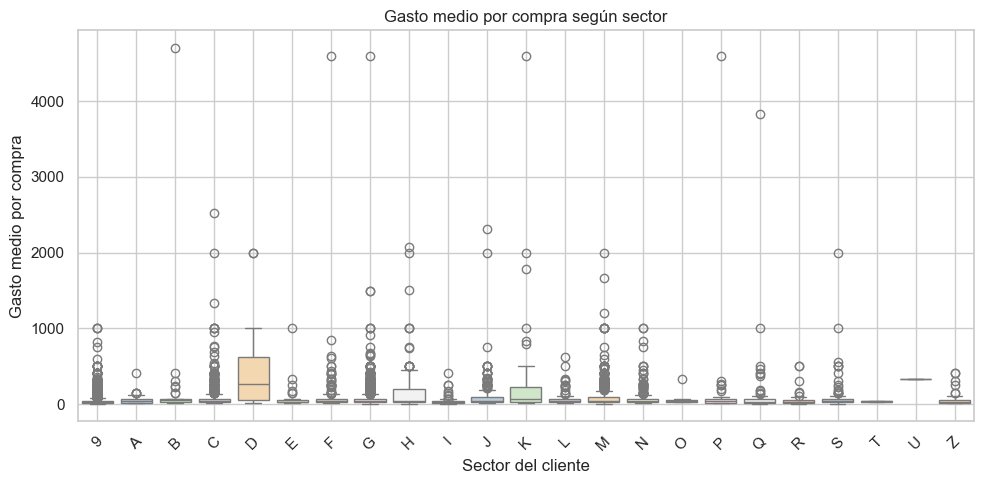

In [75]:
# Boxplot
plt.figure(figsize=(10, 5))
sns.boxplot(data=df_plot, x='sector', y='media_gasto', hue='sector', palette='Pastel1', legend=False)
plt.title('Gasto medio por compra según sector')
plt.xlabel('Sector del cliente')
plt.ylabel('Gasto medio por compra')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

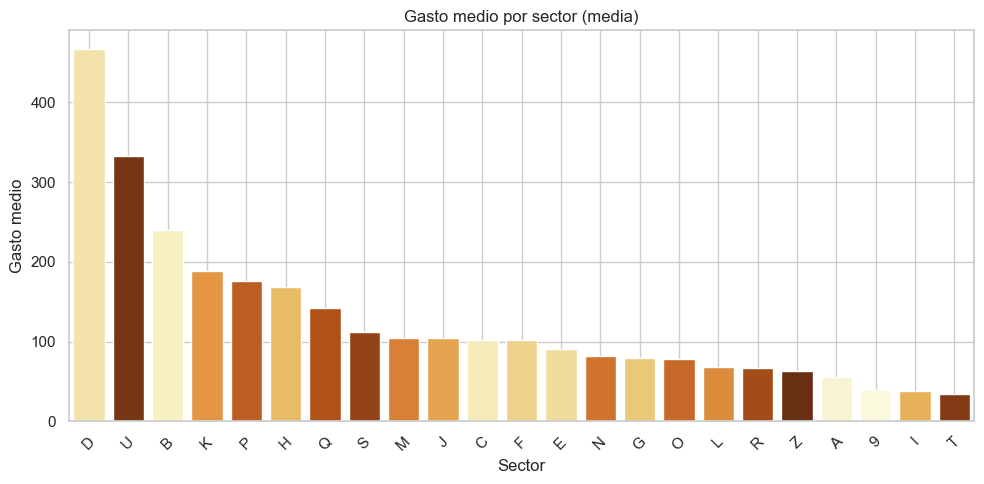

In [76]:
# Barplot con medias
media_gasto_sector = df_plot.groupby('sector', observed=True)['media_gasto'].mean().reset_index()

# Orden descendente
media_gasto_sector = media_gasto_sector.sort_values(by='media_gasto', ascending=False)
orden_sectores = media_gasto_sector['sector'].tolist()

plt.figure(figsize=(10, 5))
sns.barplot(data=media_gasto_sector, x='sector', y='media_gasto', palette='YlOrBr', hue='sector', legend=False, order=orden_sectores)
plt.title('Gasto medio por sector (media)')
plt.xlabel('Sector')
plt.ylabel('Gasto medio')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [77]:
# Correspondencia código y nombre del sector
for i, s in zip(clientes_agg.sector.unique(), clientes_agg.desc_sector.unique()):
    print(f"{i} - {s}")

9 - NOSECTOR
K - ACTIVIDADES FINANCIERAS Y DE SEGUROS
N - ACTIVIDADES DE SERVICIOS ADMINISTRATIVOS Y DE APOYO
H - TRANSPORTE Y ALMACENAMIENTO
G - COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS AUTOMOTORES Y MOTOCICLETAS
M - ACTIVIDADES PROFESIONALES, CIENTÍFICAS Y TÉCNICAS
Q - ACTIVIDADES DE ATENCIÓN DE LA SALUD HUMANA Y DE ASISTENCIA SOCIAL
C - INDUSTRIAS MANUFACTURERAS
S - OTRAS ACTIVIDADES DE SERVICIOS
I - ALOJAMIENTO Y SERVICIOS DE COMIDA
J - INFORMACIÓN Y COMUNICACIONES
L - ACTIVIDADES INMOBILIARIAS
F - CONSTRUCCIÓN
B - EXPLOTACIÓN DE MINAS Y CANTERAS
D - SUMINISTRO DE ELECTRICIDAD, GAS, VAPOR Y AIRE ACONDICIONADO
P - EDUCACIÓN
Z - COMERCIAL / INDUSTRIAL NO DEFINIDA
A - AGRICULTURA, GANADERÍA, CAZA, SILVICULTURA Y PESCA
E - DISTRIBUCIÓN DE AGUA; EVACUACIÓN Y TRATAMIENTO DE AGUAS RESIDUALES, GESTIÓN DE DESECHOS Y ACTIVIDADES DE SANEAMIENTO AMBIENTAL
R - ACTIVIDADES ARTÍSTICAS, DE ENTRETENIMIENTO Y RECREACIÓN
T - ACTIVIDADES DE LOS HOGARES INDIVIDUALES EN CALIDAD DE E

* Los sectores D y J son los que muestran menor dispersión (SUMINISTRO DE ELECTRICIDAD, GAS, VAPOR Y AIRE ACONDICIONADO y INFORMACIÓN Y COMUNICACIONES).
* Hay 2 sectores que destacan en **mayor gasto medio**:
    * D - **SUMINISTRO DE ELECTRICIDAD, GAS, VAPOR Y AIRE ACONDICIONADO**
    * U - **ACTIVIDADES DE ORGANIZACIONES Y ENTIDADES EXTRATERRITORIALES**

### antiguedad vs consultas_por_dia

In [78]:
# Recordatorio: antiguedad tiene nulos
clientes_agg[['antiguedad', 'consultas_por_dia']].isna().sum()

antiguedad           0
consultas_por_dia    0
dtype: int64

In [79]:
# Selección y limpieza
df_plot = clientes_agg[['antiguedad', 'consultas_por_dia']].dropna()

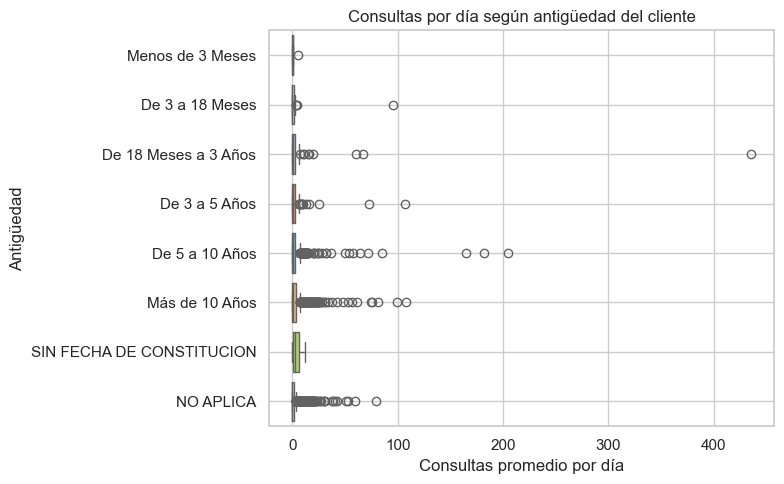

In [80]:
# Boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(data=df_plot, y='antiguedad', x='consultas_por_dia', palette='Set3', hue='antiguedad', legend=False)
plt.title('Consultas por día según antigüedad del cliente')
plt.xlabel('Consultas promedio por día')
plt.ylabel('Antigüedad')
plt.grid(True)
plt.tight_layout()
plt.show()

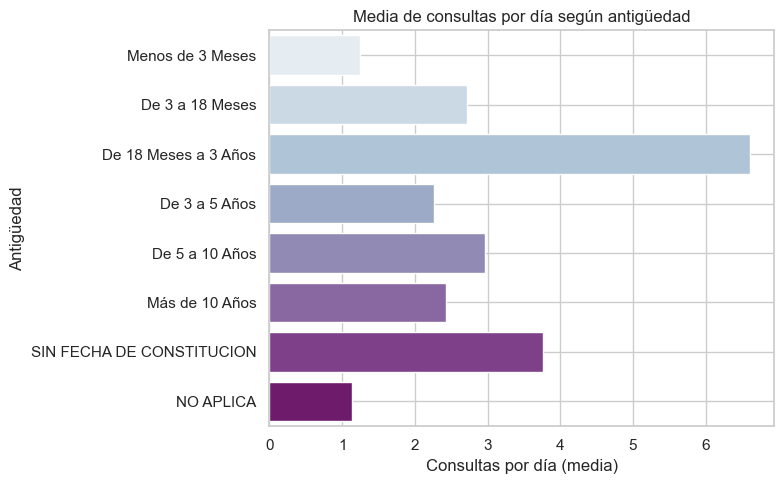

In [81]:
# Barplot de medias
media_consultas_antiguedad = df_plot.groupby('antiguedad', observed=True)['consultas_por_dia'].mean().reset_index()

plt.figure(figsize=(8, 5))
sns.barplot(data=media_consultas_antiguedad, y='antiguedad', x='consultas_por_dia',
            hue='antiguedad', legend=False, palette='BuPu')
plt.title('Media de consultas por día según antigüedad')
plt.xlabel('Consultas por día (media)')
plt.ylabel('Antigüedad')
plt.grid(True)
plt.tight_layout()
plt.show()

* La menor dispersión se produce en los clientes de menos 3 de meses y SIN FECHA DE CONSTITUCION.
* **Los clientes más antiguos no consultan en término medio más que los nuevos (igual "Intensidad de consulta").** Comportamiento plano con un solo pico (18m-3a).
* Los que más consultan son los clientes entre 18 meses y 3 años.
* Los que menos consultan los que tienen menos de 3 meses.

### Resto de pares "categórica" vs "numérica"

In [82]:
# Categóricas ordenadas y no ordenadas
cat_ordenadas = ['estado', 'tamano', 'antiguedad']
cat_no_ordenadas = ['forma_juridica', 'departamento', 'sector', 'canal_registro']

# Pares Categórica vs Numérica a analizar
pares_analisis = [('forma_juridica', 'num_compras'),
                  ('estado', 'media_gasto'),
                  ('departamento', 'num_compras'),
                  ('sector', 'consultas_por_dia'),
                  ('canal_registro', 'media_gasto'),
                  ('tamano', 'n_productos_distintos'),
                  ('antiguedad', 'dias_consulta')]  # tiempo entre consultas: mide duración total de actividad.


🧐 Analizando: FORMA_JURIDICA vs NUM_COMPRAS


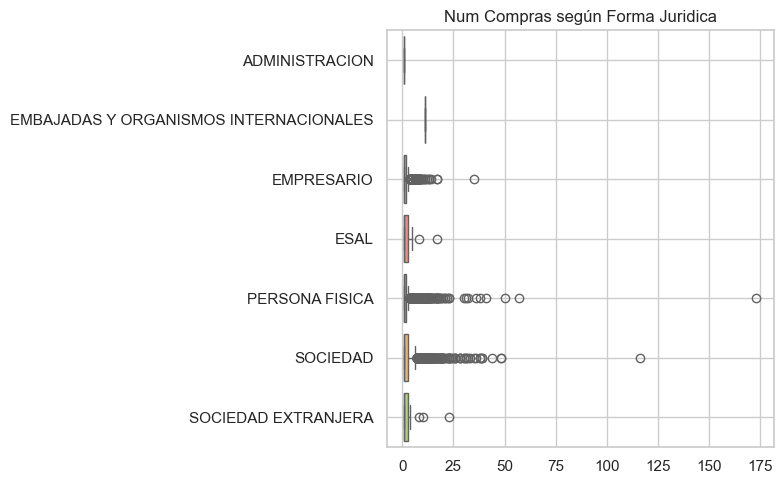

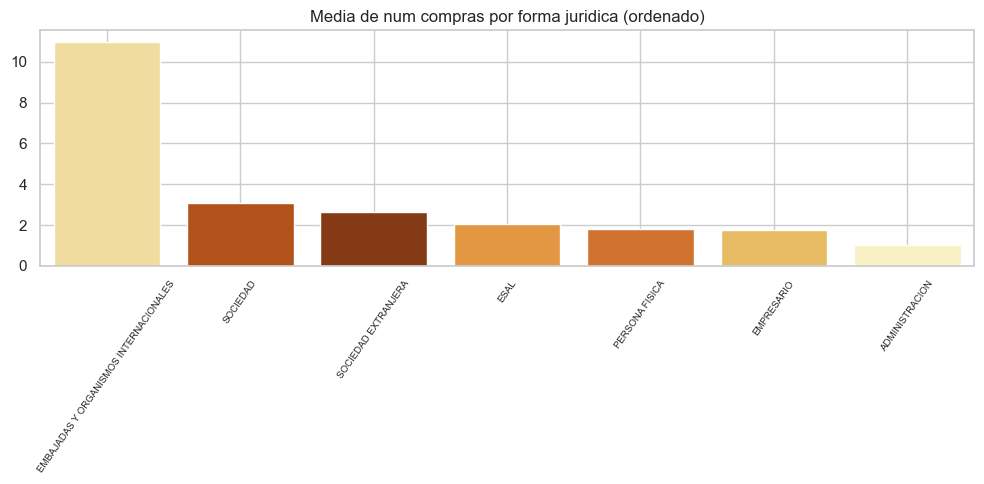


🧐 Analizando: ESTADO vs MEDIA_GASTO


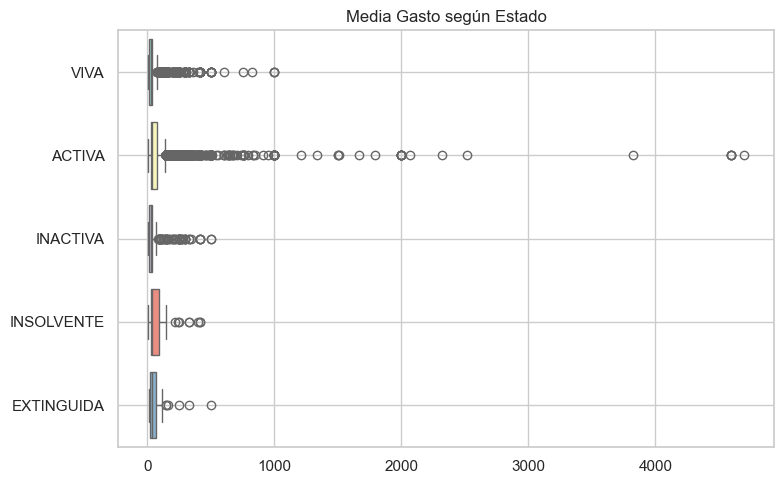

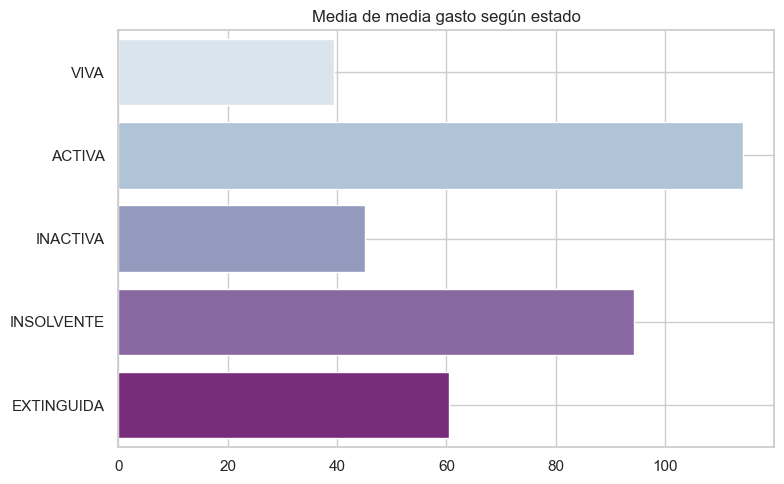


🧐 Analizando: DEPARTAMENTO vs NUM_COMPRAS


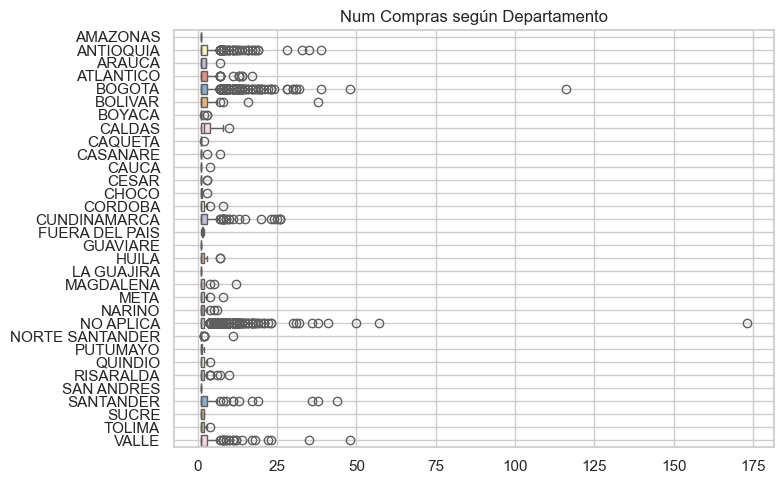

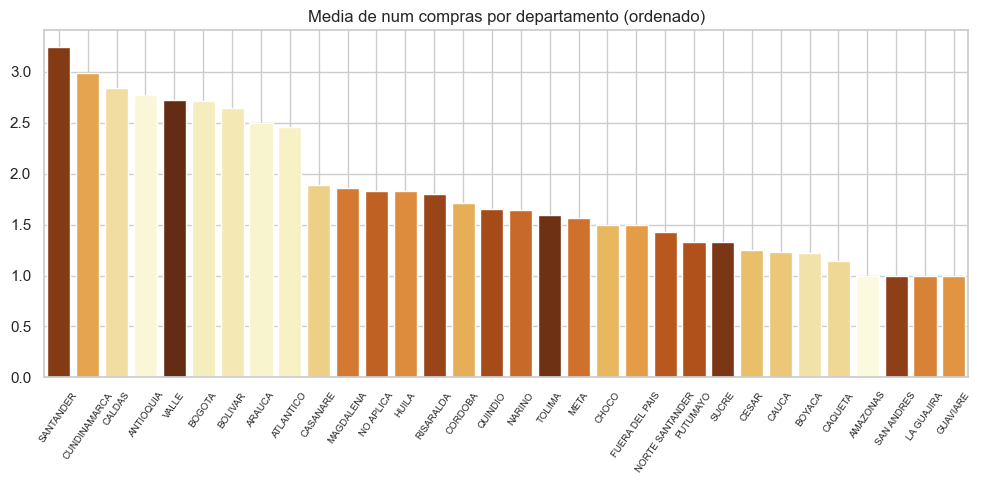


🧐 Analizando: SECTOR vs CONSULTAS_POR_DIA


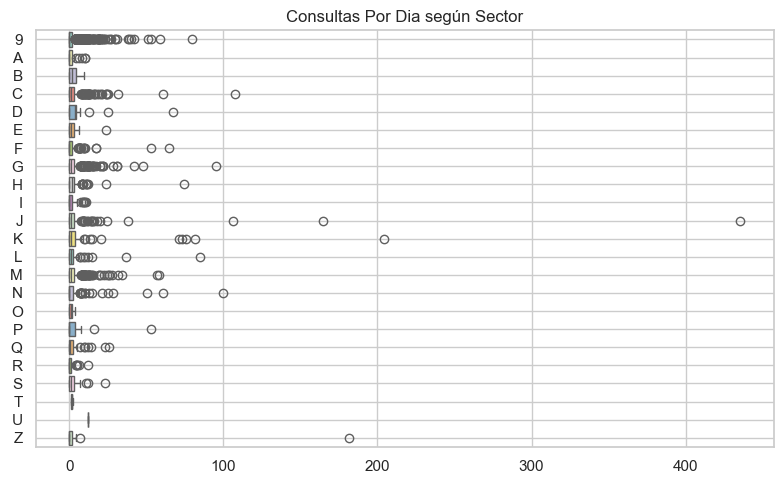

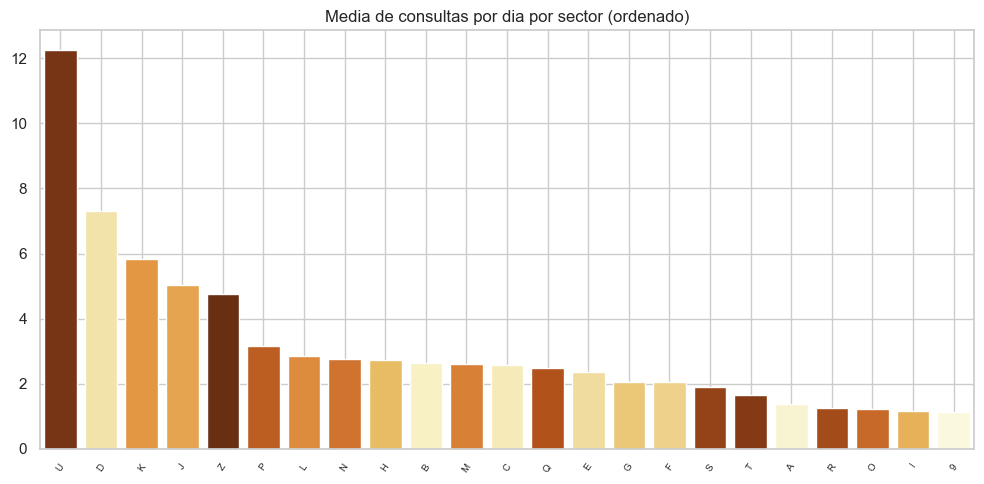


🧐 Analizando: CANAL_REGISTRO vs MEDIA_GASTO


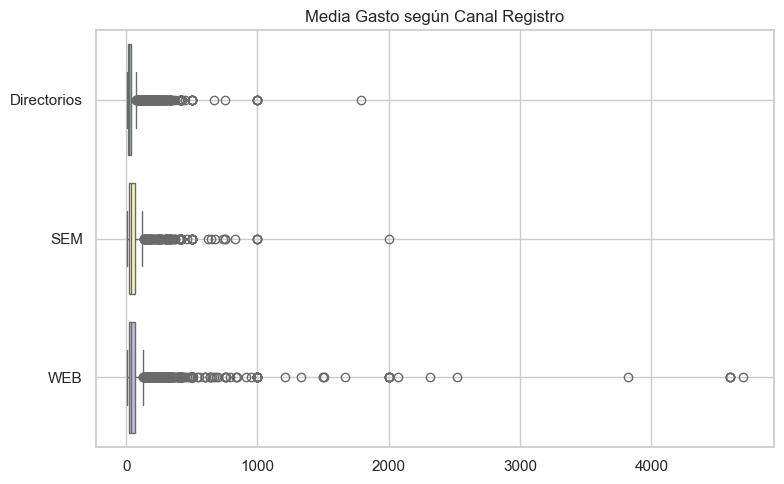

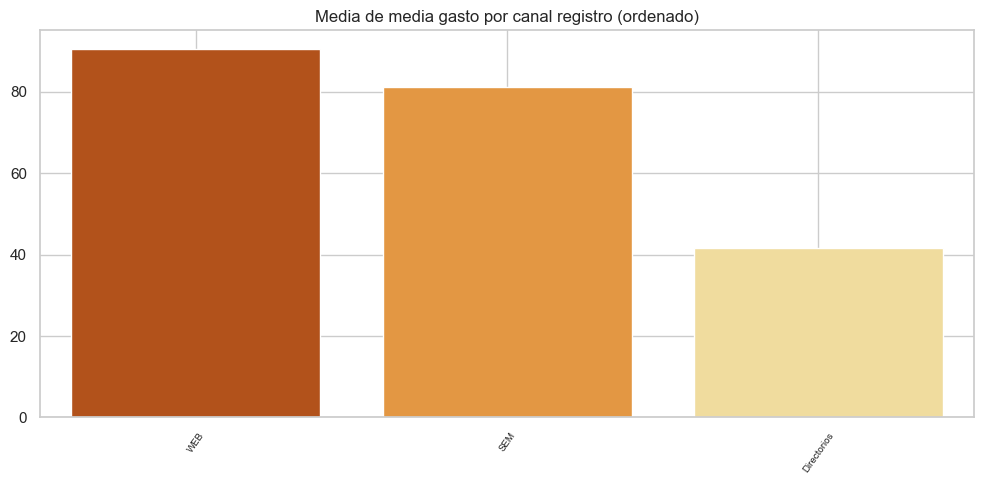


🧐 Analizando: TAMANO vs N_PRODUCTOS_DISTINTOS


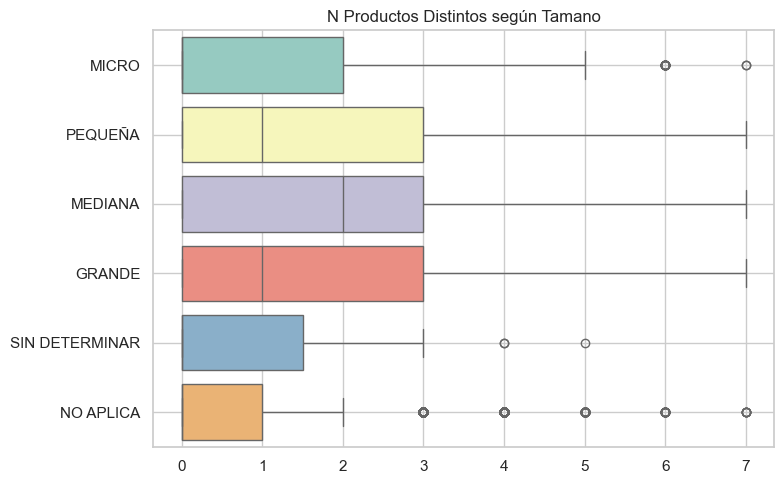

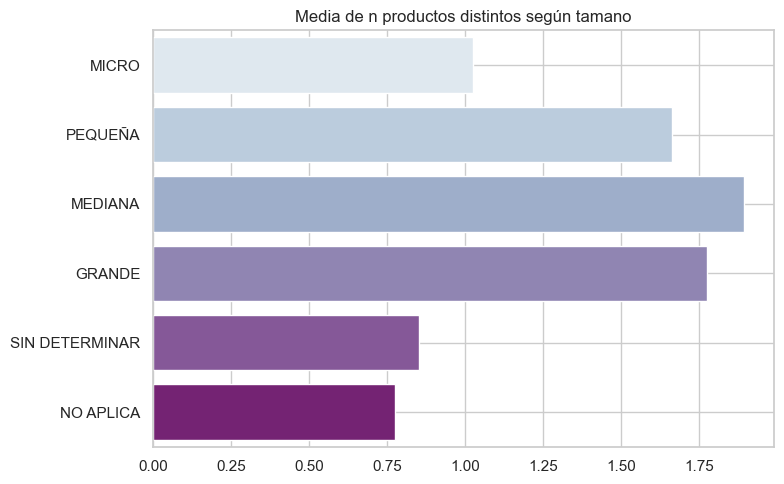


🧐 Analizando: ANTIGUEDAD vs DIAS_CONSULTA


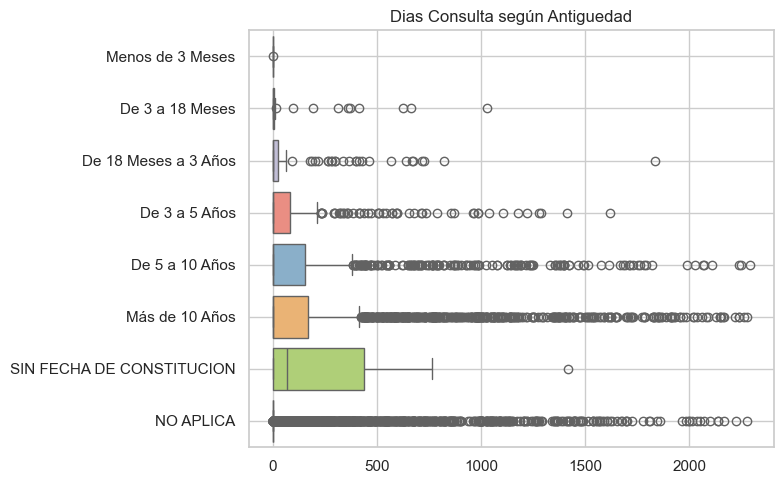

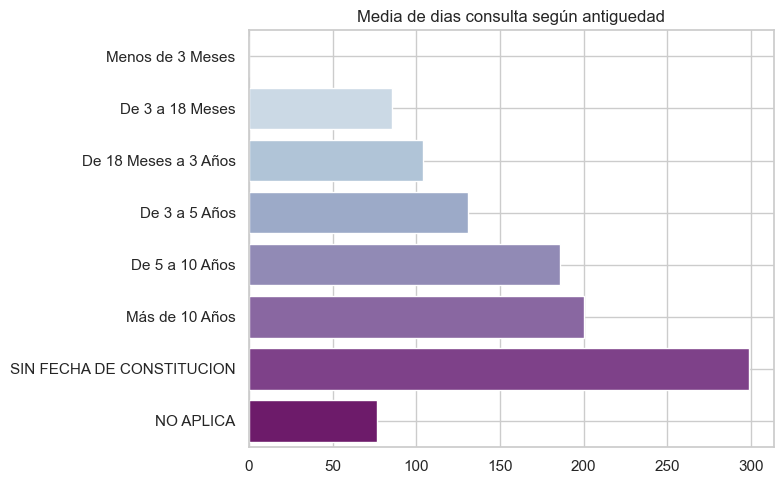

In [83]:
for cat_var, num_var in pares_analisis:
    print(f"\n🧐 Analizando: {cat_var.upper()} vs {num_var.upper()}")
    
    # Filtramos datos sin nan
    df_plot = clientes_agg[[cat_var, num_var]].dropna()

    # Boxplot
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=df_plot, y=cat_var, x=num_var, palette='Set3', hue=cat_var, legend=False)
    plt.title(f'{num_var.replace("_", " ").title()} según {cat_var.replace("_", " ").title()}')
    plt.xlabel("")
    plt.ylabel("")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Barplot
    agrupado = df_plot.groupby(cat_var, observed=True)[num_var].mean().reset_index()

    # Si es categórica ordenada
    if cat_var in cat_ordenadas:
        plt.figure(figsize=(8, 5))
        sns.barplot(data=agrupado, y=cat_var, x=num_var, hue=cat_var, legend=False, palette='BuPu')
        plt.title(f'Media de {num_var.replace("_", " ")} según {cat_var.replace("_", " ")}')
        plt.xlabel("")
        plt.ylabel("")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    # Si no es ordenada, ordenar por valor medio descendente
    elif cat_var in cat_no_ordenadas:
        agrupado = agrupado.sort_values(by=num_var, ascending=False)
        orden_cat = agrupado[cat_var].tolist()
        plt.figure(figsize=(10, 5))
        sns.barplot(data=agrupado, x=cat_var, y=num_var, palette='YlOrBr', hue=cat_var, legend=False, order=orden_cat)
        plt.title(f'Media de {num_var.replace("_", " ")} por {cat_var.replace("_", " ")} (ordenado)')
        plt.xlabel("")
        plt.ylabel("")
        plt.xticks(rotation=55, fontsize=7)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

### Comentarios sobre los pares de variables analizados

1. Influencia del tamaño en el gasto total.
   - **tamano vs importe_compras.**
   - Los clientes grandes gastan más que los pequeños. Hay un relación entre tamaño y gasto -> grupo con mayor potencial económico: medidas de fidelización o pricing.
2. Cómo afecta el canal de captación a la actividad del cliente (n_conultas).
   - **canal_registro vs n_consultas.**
   - Los clientes captados por campañas SEM no realizan más consultas que los de WEB -> marketing poco útil.
3. Determinar si hay sectores con mayor ticket medio (media_gasto).
   - **sector vs media_gasto.**
   - Los sectores se pueden agrupar en 3 grupos según su ticket medio -> ticket medio mayor en D, U y B.
4. Intensidad de uso en función de la antigüedad.
   - **antiguedad vs consultas_por_dia.**
   - Comportamiento plano a excepción del grupo 18m-3a -> pérdida de interés y medidas de retención.
5. Diferencia entre personas físicas y jurídicas.
   - **forma_juridica vs num_compras.**
   - Las empresas, en general, compran más que la persona física -> segmentación según la estructura jurídica del cliente.
6. Diferencias de gasto según estado administrativo.
   - **estado vs media_gasto.**
   - Activa tiene el mayor gasto. -> Difícil reactivar gasto de INSOLVENTE O EXTINGUIDA. Centrase en reactivar VIVA (persona física) e INACTIVA.
7. Diferencias geográficas en el volumen de compras.
   - **departamento vs num_compras.**
   - Hay 3 grupos de regiones por número de ventas. -> decisiones de campañas regionales.
8. Sectores que consultan más intensamente la plataforma.
   - **sector vs consultas_por_dia.**
   - La mayor intensidad de consultas al día proviene del sector U (en gasto medio, el 2º: U - ACTIVIDADES DE ORGANIZACIONES Y ENTIDADES EXTRATERRITORIALES), y luego D, K, J y Z. (D - SUMINISTRO DE ELECTRICIDAD, GAS, VAPOR Y AIRE ACONDICIONADO, K - ACTIVIDADES FINANCIERAS Y DE SEGUROS, J - INFORMACIÓN Y COMUNICACIONES, Z - COMERCIAL / INDUSTRIAL NO DEFINIDA). -> Sectores con mayor interés para aplicar estrategias de conversión.
9. Hay canales que captan clientes de más valor.
    - **canal_registro vs media_gasto.**
    - Los clientes WEB son los que más gastan -> Optimizar inversión en canales y campañas de captación.
10. Diversidad de interés según el tamaño del cliente.
    - **tanano vs n_productos_distintos.**
    - La empresas MEDIANA es la que más productos distintos consulta. MICRO y SIN DETERMINAR las que menos. -> MEDIANA, GRANDE Y PEQUEÑAS tienen demandas más variadas y son perfiles susceptibles para recomendaciones cross-selling.
11. Duración de la actividad en el tiempo.
    - **antiguedad vs dias_consulta.**
    - A mayor antigüedad, mayor dispersión (outliers). A mayor antigüedad de la empresa, más días transcurren entre consultas. -> Los clientes antiguos están activos más tiempo. Detección de perfiles longevos o puntuales.

## Relaciones entre variables. Categórica vs Categórica

### canal_registro vs estado

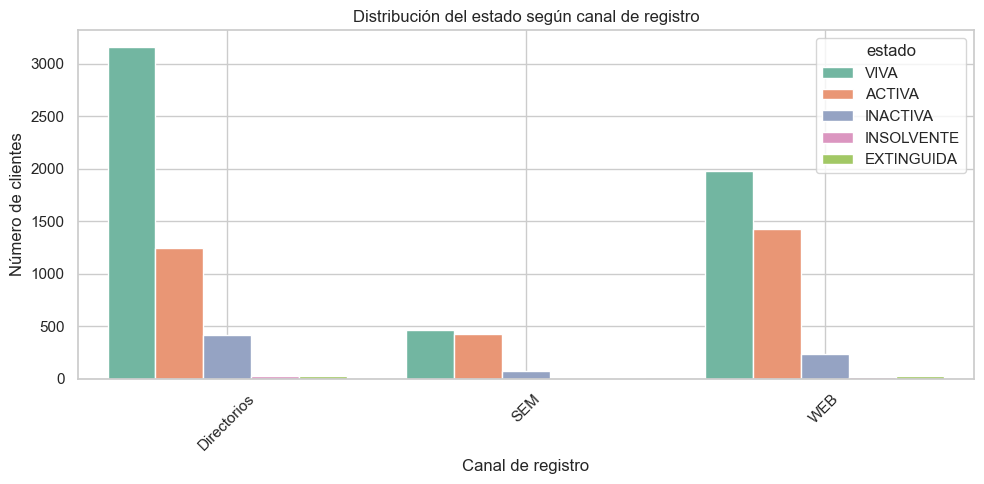

In [84]:
# Count plot (volúmenes absolutos)
plt.figure(figsize=(10, 5))
sns.countplot(data=clientes_agg, x='canal_registro', hue='estado', palette='Set2')
plt.title('Distribución del estado según canal de registro')
plt.xlabel('Canal de registro')
plt.ylabel('Número de clientes')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

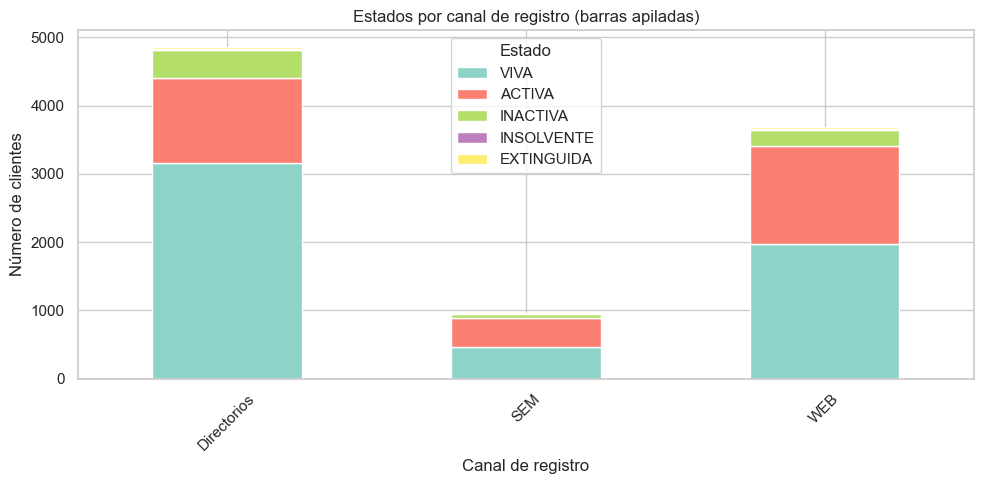

In [85]:
# Tabla cruzada (frecuencias absolutas)
ct = pd.crosstab(clientes_agg['canal_registro'], clientes_agg['estado'])

# Barras apiladas (comparamos composición entre canales)
ct.plot(kind='bar', stacked=True, figsize=(10, 5), colormap='Set3')
plt.title('Estados por canal de registro (barras apiladas)')
plt.xlabel('Canal de registro')
plt.ylabel('Número de clientes')
plt.xticks(rotation=45)
plt.legend(title='Estado')
plt.tight_layout()
plt.show()

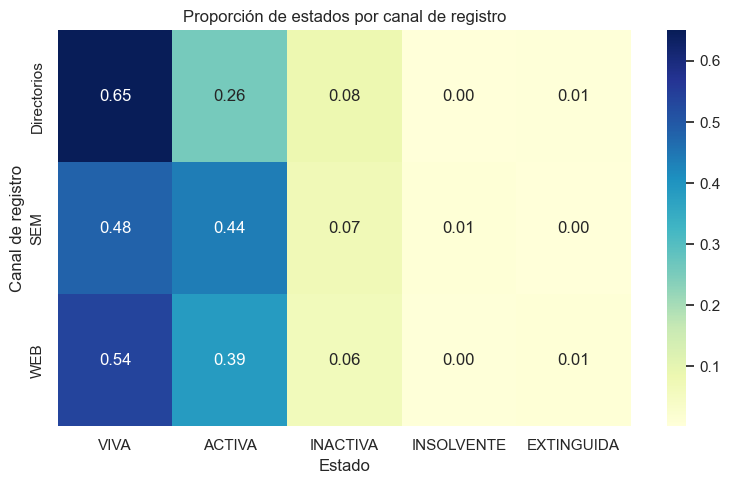

In [86]:
# Normalizamos por filas --> proporciones internas
ct_rel = ct.div(ct.sum(axis=1), axis=0)

plt.figure(figsize=(8, 5))
sns.heatmap(ct_rel, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Proporción de estados por canal de registro')
plt.xlabel('Estado')
plt.ylabel('Canal de registro')
plt.tight_layout()
plt.show()

### Resto de pares "categórica vs categórica"

In [87]:
# Lista de pares categóricos
pares_categoricos = [('tamano', 'sector'),
                     ('forma_juridica', 'sector'),
                     ('departamento', 'estado'),
                     ('antiguedad', 'tamano')]


🧐 Análisis: TAMANO vs SECTOR


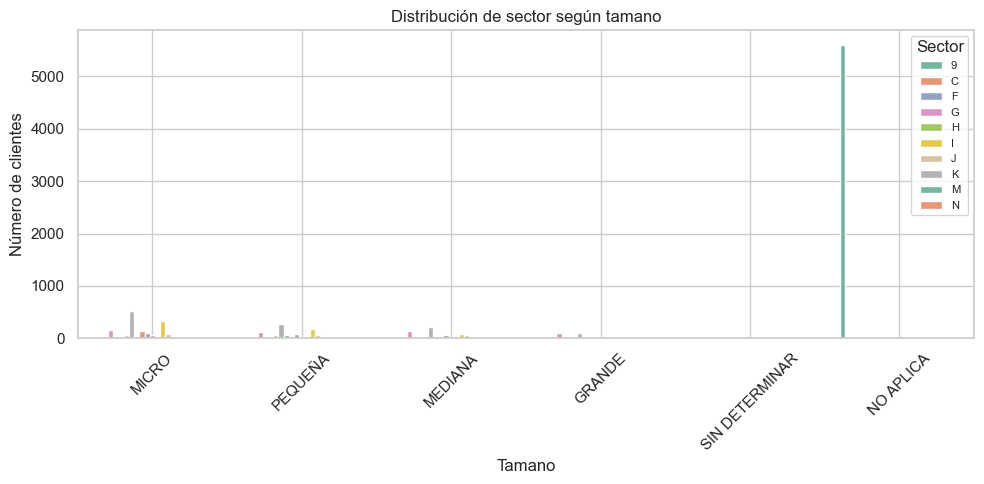

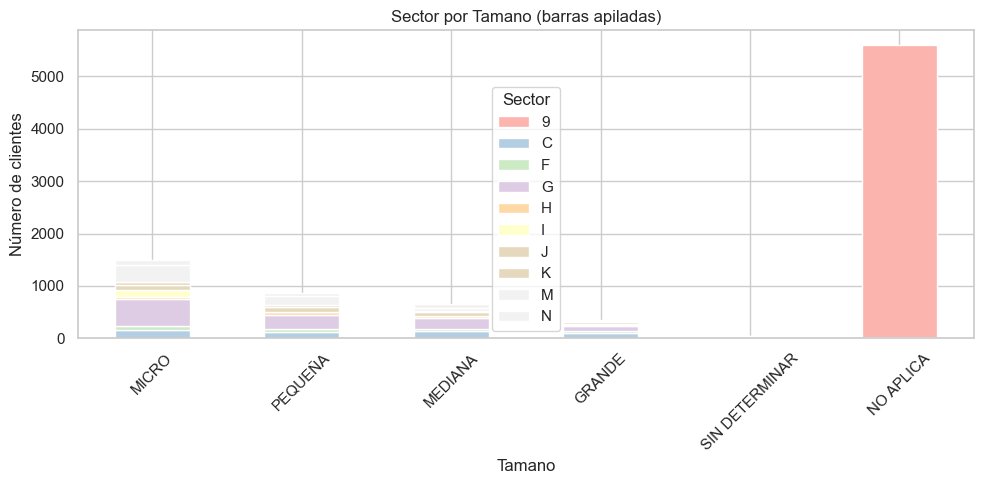

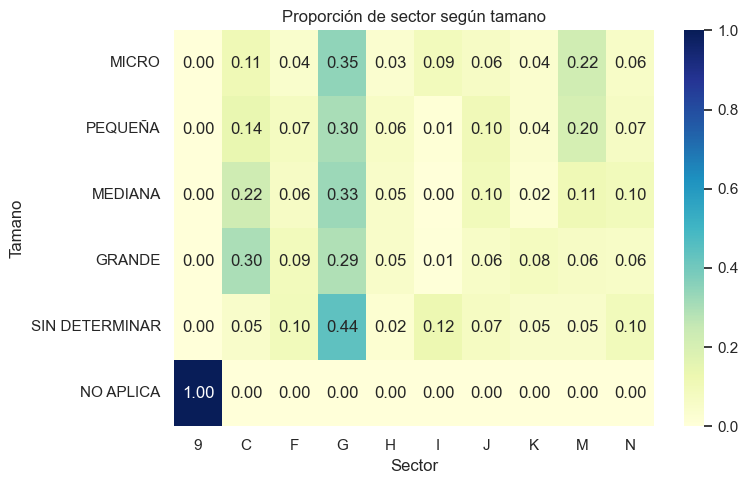


🧐 Análisis: FORMA_JURIDICA vs SECTOR


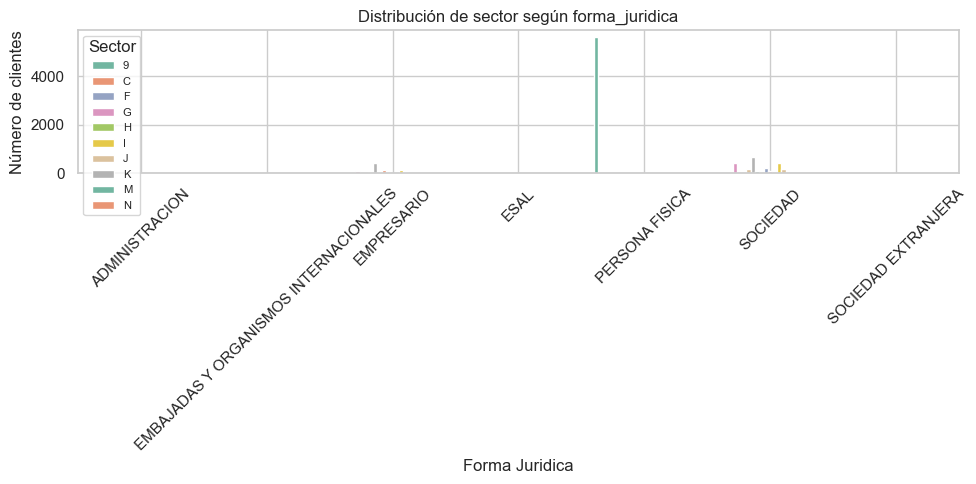

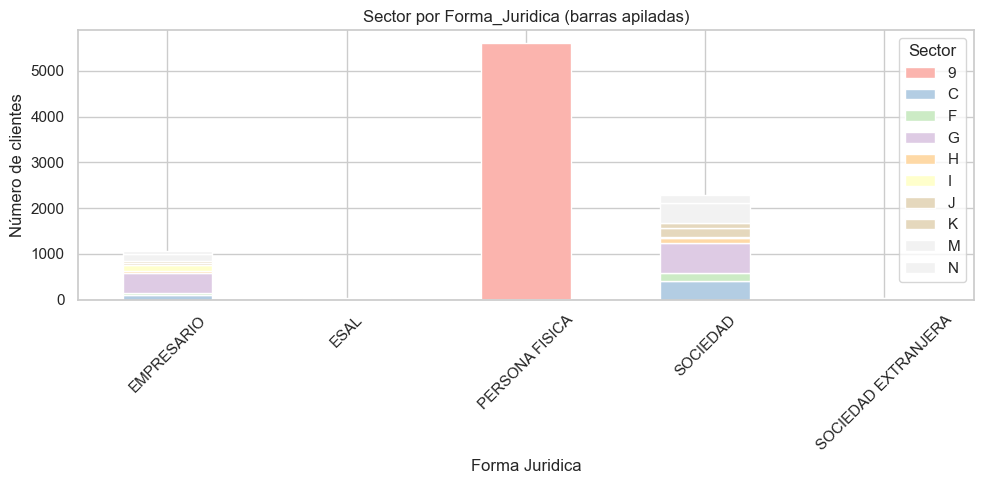

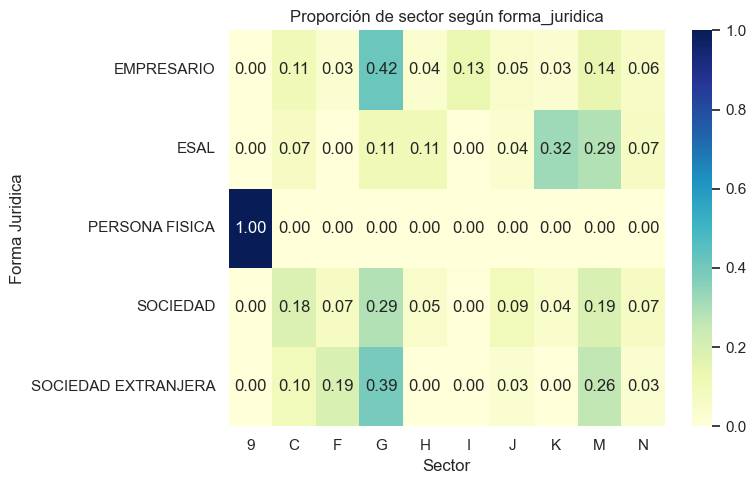


🧐 Análisis: DEPARTAMENTO vs ESTADO


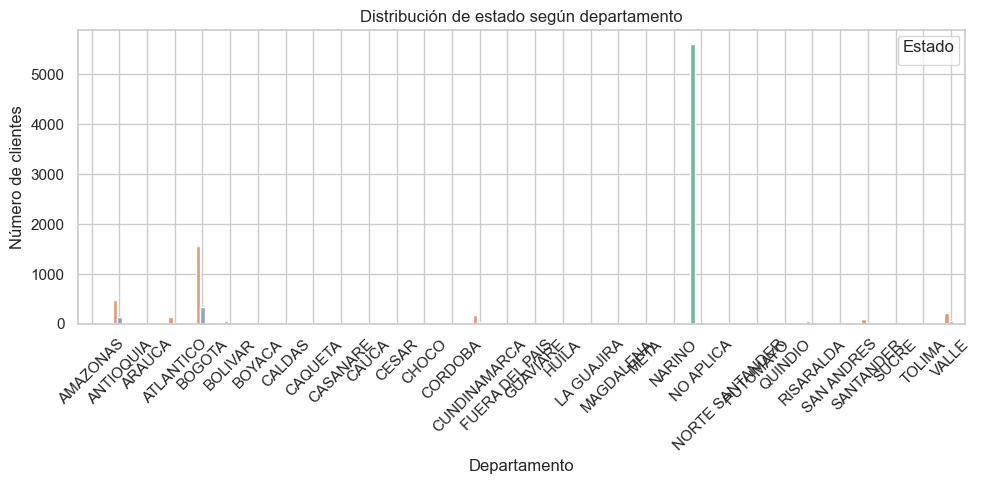

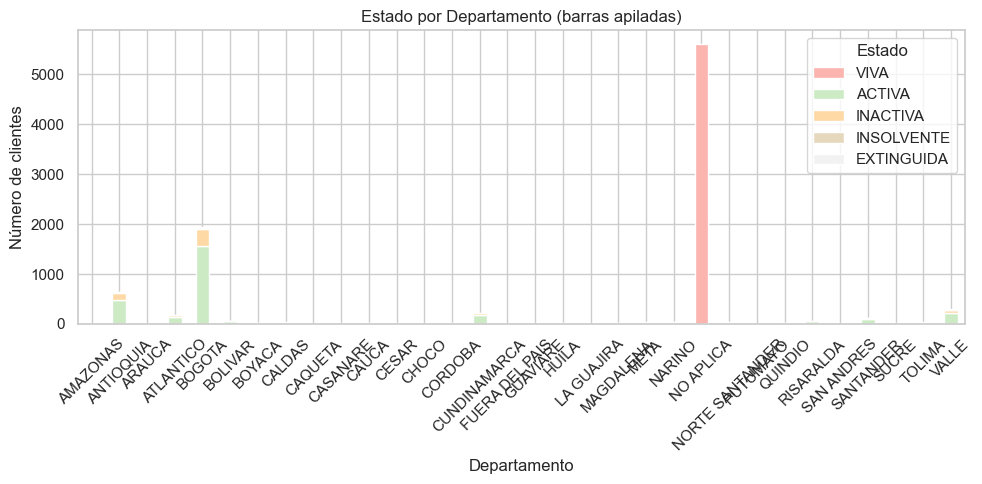

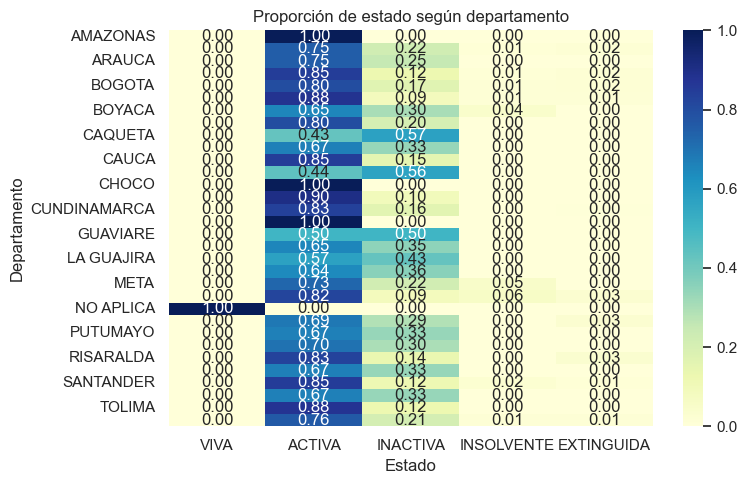


🧐 Análisis: ANTIGUEDAD vs TAMANO


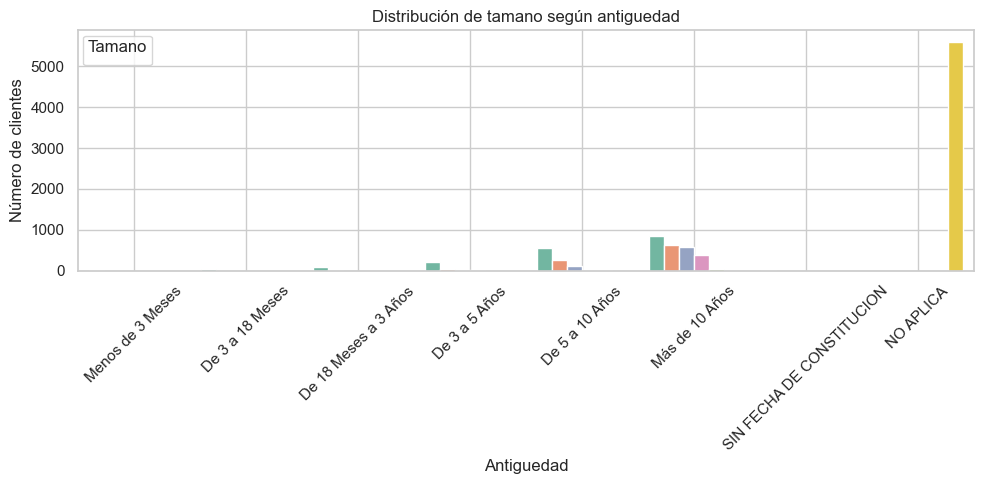

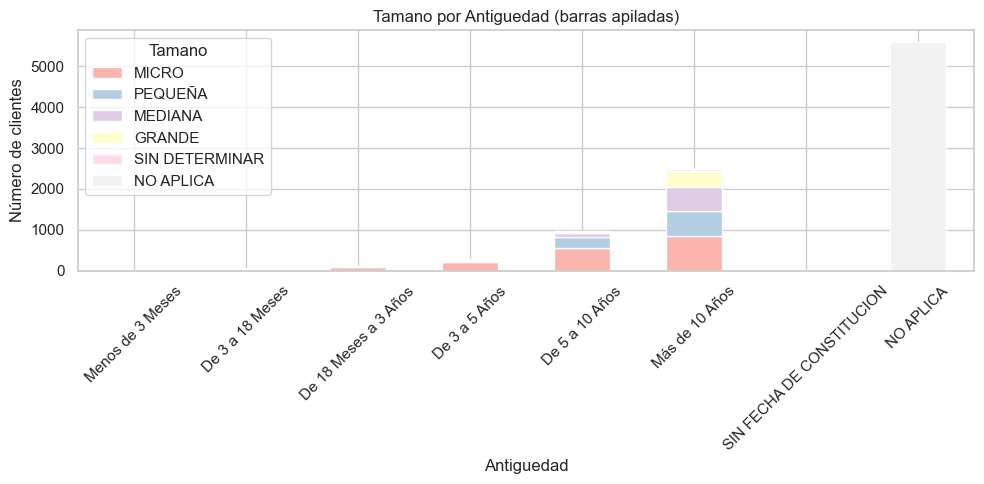

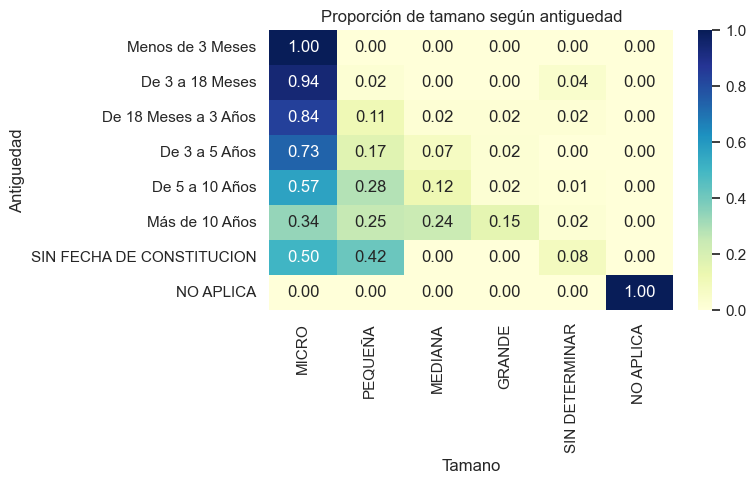

In [88]:
# Bucle para gráficos

for var1, var2 in pares_categoricos:
    print(f"\n🧐 Análisis: {var1.upper()} vs {var2.upper()}")

    # Filtramos datos no NaN
    df_plot = clientes_agg[[var1, var2]].dropna()

    # Seleccionamos solo 10 sectores (hay demasiados sectores y el gráfico no queda claro)
    if var1 == 'sector' or var2 == 'sector':
        top_10 = df_plot['sector'].value_counts().nlargest(10).index
        df_plot = df_plot[df_plot.sector.isin(top_10)]

    # Count plot
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df_plot, x=var1, hue=var2, palette='Set2')
    plt.title(f'Distribución de {var2} según {var1}')
    plt.xlabel(var1.replace('_', ' ').title())
    plt.ylabel('Número de clientes')
    plt.xticks(rotation=45)
    # Controlamos la leyenda
    handles, labels = plt.gca().get_legend_handles_labels()  # Devuelve etiquetas y objetos que representan elementos de la leyenda.
    filtered_labels = [label for label in labels if label in top_10]  # Solo etiquetas en top_10.
    # Solo los primeros objetos; de las etiquetas filtradas; y el título sin guión.
    plt.legend(handles[:len(filtered_labels)], filtered_labels, title=var2.replace('_', ' ').title(), fontsize=8)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Crosstab + Barras apiladas
    crosstab = pd.crosstab(df_plot[var1], df_plot[var2])
    crosstab.plot(kind='bar', stacked=True, figsize=(10, 5), colormap='Pastel1')
    plt.title(f'{var2.title()} por {var1.title()} (barras apiladas)')
    plt.xlabel(var1.replace('_', ' ').title())
    plt.ylabel('Número de clientes')
    plt.xticks(rotation=45)
    plt.legend(title=var2.replace('_', ' ').title())
    plt.tight_layout()
    plt.show()

    # Heatmap (proporciones internas)
    crosstab_prop = crosstab.div(crosstab.sum(axis=1), axis=0)
    plt.figure(figsize=(8, 5))
    sns.heatmap(crosstab_prop, annot=True, fmt=".2f", cmap="YlGnBu")
    plt.title(f'Proporción de {var2} según {var1}')
    plt.xlabel(var2.replace('_', ' ').title())
    plt.ylabel(var1.replace('_', ' ').title())
    plt.tight_layout()
    plt.show()

1. Vemos si el canal de registro está asociado con el estado administrativo. **canal_registro vs estado**

* El canal que genera más clientes activos es Directorios y el que menos SEM.
* SEM tiene un rendimiento muy pobre sea cual sea el estado administrativo.
* La persona física supone el mayor número de clientes, especialmente en Directorios.
* La empresa ACTIVA es mayor en términos absolutos en WEB.

2. Analizamos si ciertos tamaños de clientes son más habituales en algunos sectores. **tamano vs sector**
* El grupo más numeroso son las microempresas. El sector **G** (COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS AUTOMOTORES Y MOTOCICLETAS) domina en todos los tamaños. La masa de clientes está en MICRO, seguido de PEQUEÑA y MEDIANA. Sectores **J** (INFORMACIÓN Y COMUNICACIONES) y **H** (TRANSPORTE Y ALMACENAMIENTO) son relevantes en empresas más pequeñas.
* Importante presencia transversal del sector **G** (COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS AUTOMOTORES Y MOTOCICLETAS). GRANDE, clientes con importancia de sector **C** (INDUSTRIAS MANUFACTURERAS). MEDIANA, comportamiento parecido a GRANDE. En MICRO, el sector **L** (ACTIVIDADES INMOBILIARIAS) es relevante. Clientes MEDIANO y GRANDE están más diversificados entre varios sectores.

3. Relación entre la forma jurídica y el sector empresarial. **forma_juridica vs sector**
* Por número domina PERSONA FÍSICA, seguida a distancia por SOCIEDAD.
* Las PERSONAS FÍSICA corresponde al 100% al sector 9 (NOSECTOR). El EMPRESARIO pertenece en un 42% y SOCIEDAD un 29% al sector G (COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACIÓN DE VEHÍCULOS AUTOMOTORES Y MOTOCICLETAS).

4. Cómo se distribuye el estado administrativo en las regiones. **departamento vs estado**
* El departamento de BOGOTÁ domina en número de clientes. Otros departamentos importantes son: ANTIOQUIA, ATLÁNTICO Y VALLE. En casi todos los departamentos el estado mayoritario del ciente es ACTIVO. Habría que tratar a BOGOTÁ de forma diferenciada al resto.
* Caquetá, Guaviare y en menor medida Meta tienen una tasa de inactividad mayor que el resto de departamentos. Tal vez se puedan llevar a cabo acciones para reactivar a clientes en estos departamentos.

5. Se busca si los clientes antiguos tienden a tener mayor tamaño. **antiguedad vs tamano**
* Los clientes más antiguos (Más de 10 años y De 5 a 10 años) son principalmente MICRO. También hay un aumento progresivo de empresas PEQUEÑA y MEDIANA con el paso de los años.
* Conforme los clientes envejecen, tienden a crecer en tamaño. Esto refleja una maduración y expansión natural de las empresas. Por ejemplo:
  - Clientes más recientes (< 3 meses, 3-18 meses), casi todos los clientes son microempresas (100% y 94%, respectivamente).
  - Clientes de más de 10 años, la distribución es más equilibrada: 34%, 25%, 24% y 15%, microempresas, pequeñas, medianas y grandes.
* Se requiere estrategia para segmentar clientes por tamaño actual y ciclo de vida.

## Relaciones entre variables. Numéricas vs Numéricas

### num_compras vs importe_compras

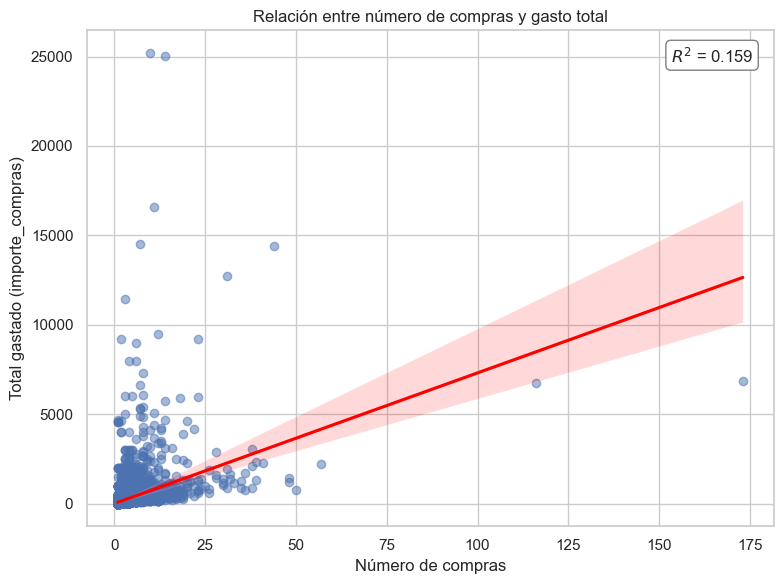

In [89]:
# Selección de variables
df_plot = clientes_agg[['importe_compras', 'num_compras']].dropna()

# Asignamos variables X e Y
X = df_plot['num_compras'].values.reshape(-1, 1)  # Reshape para que lo coja sklearn.
y = df_plot['importe_compras'].values

# Ajustamos regresión lineal
modelo = LinearRegression()
modelo.fit(X, y)
y_pred = modelo.predict(X)

# Cálculo de R2
r2 = r2_score(y, y_pred)

# Gráficamos regplot
plt.figure(figsize=(8, 6))
sns.regplot(x='num_compras', y='importe_compras',
            data=df_plot, scatter_kws={'alpha':0.5}, line_kws={"color":"red"})
plt.title('Relación entre número de compras y gasto total')
plt.xlabel('Número de compras')
plt.ylabel('Total gastado (importe_compras)')
plt.grid(True)

# Poner R2 en el gráfico
plt.text(0.85, 0.97, f'$R^2$ = {r2:.3f}', transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top', bbox=dict(boxstyle="round", fc="white", ec="gray"))

plt.tight_layout()
plt.show()

### Resto de pares "numérica vs numérica"


🧐 Análisis: DIAS_CLIENTE vs DIAS_CONSULTA


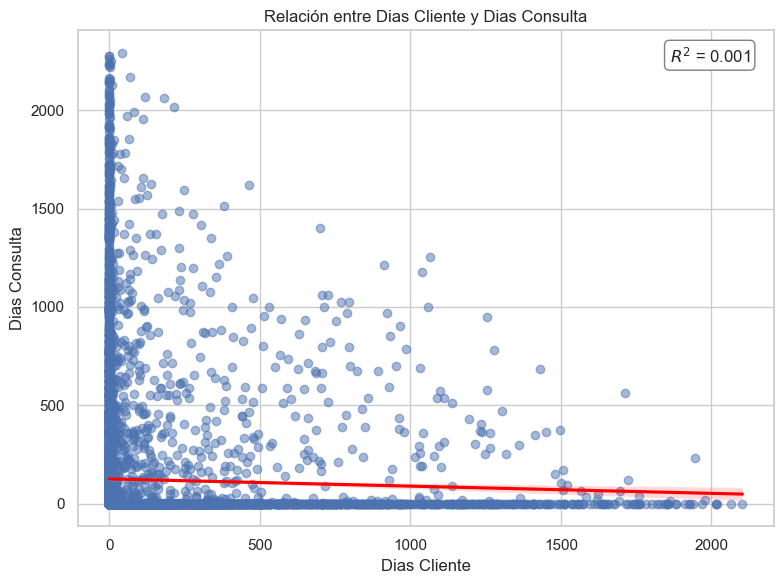


🧐 Análisis: CONSULTAS_POR_DIA vs IMPORTE_COMPRAS


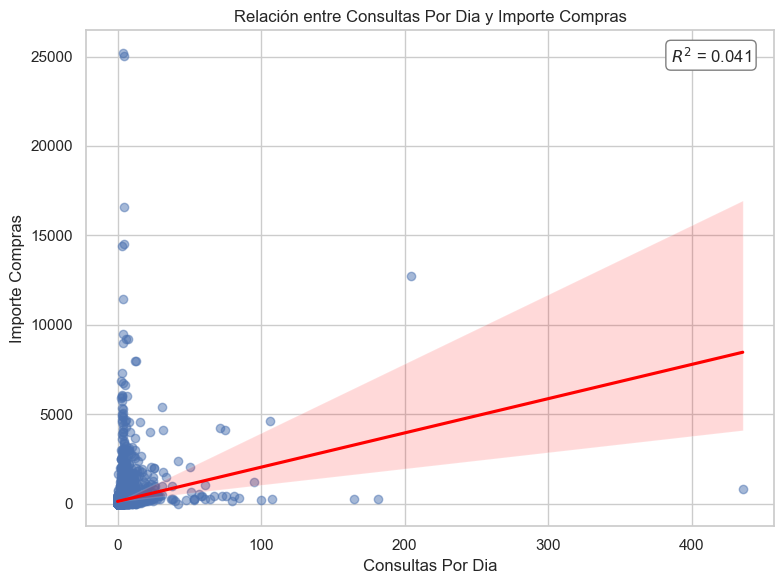


🧐 Análisis: DIAS_ENTRE_COMPRAS vs MEDIA_GASTO


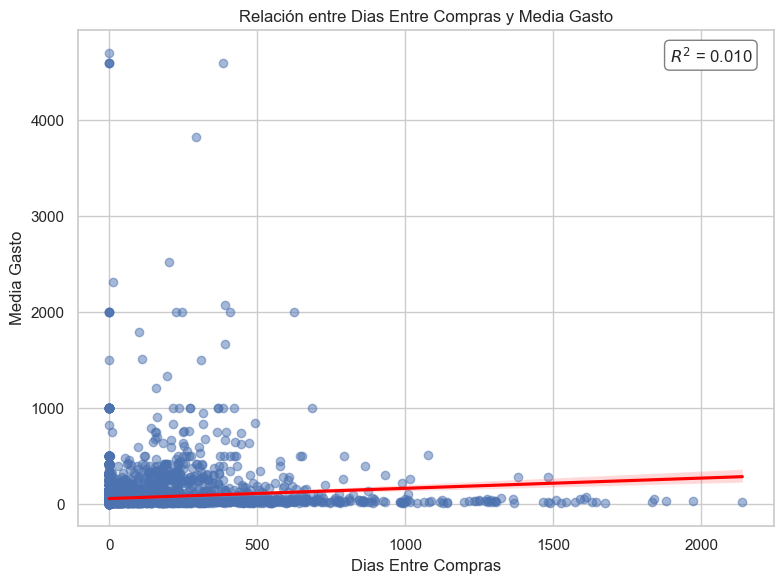


🧐 Análisis: DIAS_DISTINTOS_CONSULTA vs N_PRODUCTOS_DISTINTOS


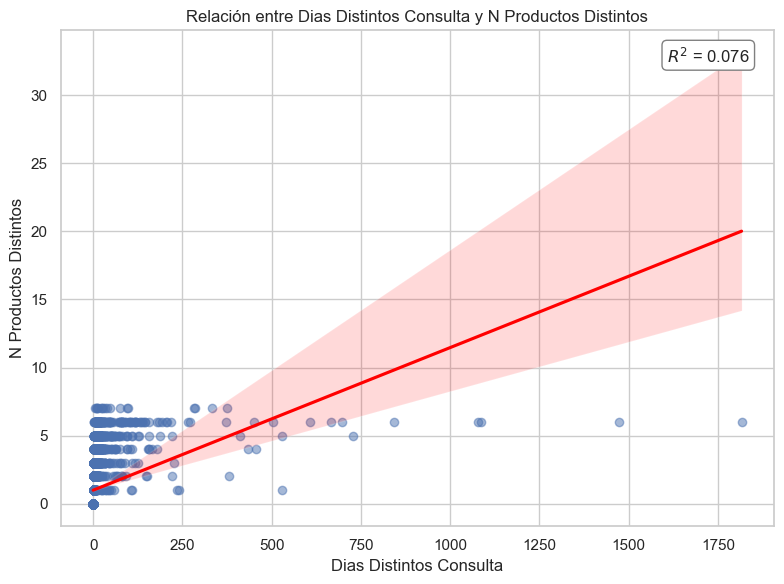

In [90]:
# Mismo código que antes para el resto de pares de variables numérica a analizar

# Pares de variables a analizar
pares_numericos = [('dias_cliente', 'dias_consulta'),
                   ('consultas_por_dia', 'importe_compras'),
                   ('dias_entre_compras', 'media_gasto'),
                   ('dias_distintos_consulta', 'n_productos_distintos')]

# Bucle para cada par
for x_var, y_var in pares_numericos:
    print(f"\n🧐 Análisis: {x_var.upper()} vs {y_var.upper()}")

    # Preparamos los datos
    df_plot = clientes_agg[[x_var, y_var]].dropna()
    X = df_plot[x_var].values.reshape(-1, 1)
    y = df_plot[y_var].values

    # Regresión lineal
    modelo = LinearRegression()
    modelo.fit(X, y)
    y_pred = modelo.predict(X)

    # Cálculamos R2
    r2 = r2_score(y, y_pred)

    # Gráfico regplot
    plt.figure(figsize=(8, 6))
    sns.regplot(x=x_var, y=y_var, data=df_plot, scatter_kws={'alpha':0.5}, line_kws={"color":"red"})
    plt.title(f'Relación entre {x_var.replace("_", " ").title()} y {y_var.replace("_", " ").title()}')
    plt.xlabel(x_var.replace("_", " ").title())
    plt.ylabel(y_var.replace("_", " ").title())
    plt.grid(True)

    # Ponemos R2 en el gráfico
    plt.text(0.85, 0.97, f'$R^2$ = {r2:.3f}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top', bbox=dict(boxstyle="round", fc="white", ec="gray"))

    plt.tight_layout()
    plt.show()

### Heatmap

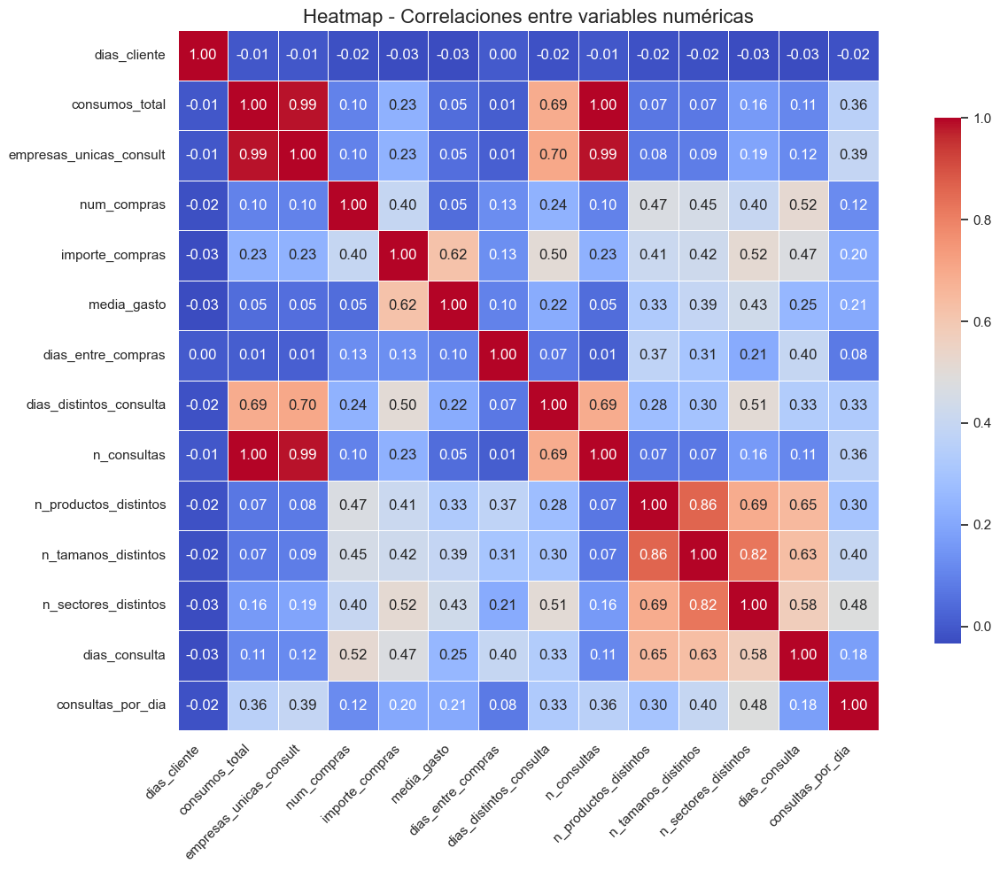

In [91]:
# Heatmap para todas las variables

# Variables numéricas relevantes
variables_numericas = ['dias_cliente', 'consumos_total', 'empresas_unicas_consult',
                       'num_compras', 'importe_compras', 'media_gasto',
                       'dias_entre_compras', 'dias_distintos_consulta',
                       'n_consultas', 'n_productos_distintos', 'n_tamanos_distintos',
                       'n_sectores_distintos', 'dias_consulta', 'consultas_por_dia']

# Filtramos dataframe
df_num = clientes_agg[variables_numericas].dropna()

# Matriz de correlaciones
corr = df_num.corr()

# Gráfico heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5, cbar_kws={"shrink": 0.75})
plt.title('Heatmap - Correlaciones entre variables numéricas', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

1. Comprobar si a mayor número de ventas implica más gasto total. **total_gastado vs num_compras**
* A mayor número de compras, mayor gasto, pero baja R2 y alta dispersión.
* Hay outliers: **con pocas ventas acumulan un total gastado elevado**. Estos serían clientes premium que se pueden analizar aparte.

2. Cómo se relaciona la antigüedad con la duración de la actividad. **dias_cliente vs dias_consulta**
* No hay relación entre las variables.
* Muchos clientes con pocos días de de antiguedad (<200) tienen alta actividad de consulta.
* Hay clientes muy antiguos (>1000 días) que apenas tienen días de consultas.
* La **actividad de consulta es independiente del tiempo que se lleve como cliente**. Fidelización no depende de ser cliente antiguo sino de motivar el uso recurrente.

3. Comprobar si la intensidad de consulta (consultas por día) predice el gasto. **consultas_por_dia vs importe_compras**
* Relación muy débil (R2).
* La mayoría de clientes realizan pocas consultas (<20) y tienen importes de compra moderados.
* Habría que utilizar esta variable en combinación con otras para entender mejor el comportamiento de compra.

4. Relación entre frecuencia de compra con el ticket medio. **dias_entre_compras vs media_gasto**
* R2 muy bajo: no hay relación entre las variables.
* La mayoría de los clientes se agrupan en intervalos de compra bajos (<500 días) y gasto medio moderado (>500).
* Hay algunos outliers con mucho tiempo entre compras y tickets medios altos.
* No se puede asumir que clientes que compran esporádicamente gastan más en cada compra.

5. Relación entre días activos de consulta y diversidad de intereses. **dias_distintos_consulta vs n_productos_distintos**
* Tendencia positiva ligera: cuántos más días consulta un cliente, más productos distintos explora.
* La mayoría de clientes **consulta entre 0-250 días y explora entre 1-5 productos distintos.**
* Clientes con más de 500 días de consultas suelen haber explorado un mayor número de productos.

**Heatmap**
* Hay variables altamente correlacionadas que son sus susceptibles de aplicarles reducción de la dimensionalidad:
  - n_consultas y consumos_total -> 1.00 (no son los mismos valores pero al eliminar null la correlación es 1)
  - consumos_total y empresas_unicas_consult -> 0.99
  - n_productos_distintos y n_tamanos_distintos -> 0.86
  - n_sectores_distintos y n_tamanos_distintos -> 0.82
* Hay correlaciones muy bajas:
  - dias_cliente: baja correlación con todas las demás variables.
  - dias_entre_compras: con casi totas, excepto dias_consulta y n_tamanos_distintos.

## Variables creadas

| Variable                  | Tipo de Cálculo                              | Objetivo de Negocio                                           |
|:---------------------------|:------------------------------------------------|:---------------------------------------------------------------|
| n_ventas (num_compras). **ELIMINADA**                  | Conteo (`count`) de ventas por cliente          | Medir cuántas veces ha comprado un cliente.                   |
| total_gastado (importe_compras). **ELIMINADA**              | Suma (`sum`) del importe gastado                | Conocer el volumen total de gasto por cliente.                |
| media_gasto                | Promedio (`total_gastado` / `n_ventas`)         | Estimar el gasto medio por compra de cada cliente.            |
| fecha_primera_compra       | Fecha mínima (`min`) de compra                  | Identificar cuándo fue la primera compra.                     |
| fecha_ultima_compra        | Fecha máxima (`max`) de compra                  | Identificar cuándo fue la última compra.                      |
| dias_entre_compras         | (fecha_última_compra - fecha_primera_compra) / (`n_ventas` - 1) | Medir la frecuencia de compra (cada cuántos días compra). |
| n_consultas               | Conteo (`count`) de consultas                   | Cuantificar cuántas consultas ha realizado el cliente.        |
| dias_distintos_consulta    | Número de días distintos (`nunique`) de consultas| Medir en cuántos días distintos ha tenido actividad de consultas. |
| n_productos_distintos      | Número de productos únicos (`nunique`) consultados| Evaluar la diversidad de intereses en productos.             |
| n_tamanos_distintos        | Número de tamaños únicos (`nunique`) consultados | Verificar si consulta empresas de distintos tamaños.         |
| n_sectores_distintos       | Número de sectores únicos (`nunique`) consultados| Evaluar la variedad de sectores de interés.                  |
| fecha_primera_consulta     | Fecha mínima (`min`) de consulta                 | Detectar la primera vez que hizo una consulta.                |
| fecha_ultima_consulta      | Fecha máxima (`max`) de consulta                 | Detectar la última vez que hizo una consulta.                 |
| dias_consulta              | (fecha_ultima_consulta - fecha_primera_consulta) en días | Medir el rango temporal de su actividad de consultas. |
| consultas_por_dia          | `n_consultas` / (`dias_consulta` + 1)            | Estimar la intensidad de consultas diarias.                  |


# SELECCIÓN DE VARIABLES (FEATURE ENGINEERING)

## Variables RFM

In [92]:
# Copia del dataset original
clientes_rfm = clientes_agg.copy()

# Establecemos la fecha de referencia (suponemos "hoy" como: última fecha disponible en el dataset + 1 día)
fecha_referencia = clientes_rfm['fecha_ultima_compra'].max() + pd.Timedelta(days=1)

# Cálculo de RFM
# Recency: días desde la última compra
clientes_rfm['recency'] = (fecha_referencia - clientes_rfm['fecha_ultima_compra']).dt.days

# Frequency: número de ventas
# clientes_rfm['frequency'] = clientes_rfm['n_ventas']

# Monetary: gasto total
# clientes_rfm['monetary'] = clientes_rfm['total_gastado']

# Renombro las variables en vez repetirlas
clientes_rfm = clientes_rfm.rename(
    columns={'num_compras': 'frequency', 'importe_compras': 'monetary'})

# Comprobamos
clientes_rfm[['id', 'recency', 'frequency', 'monetary']].head()

,id,recency,frequency,monetary
0,6384286,2326,1,35
1,6384667,1968,1,15
2,6389279,2061,38,904
3,6387954,87,13,684
4,6383269,2326,1,22


## Nuevas variables

Supuestos:

* **Un cliente que se activa rápido** (pocos días entre registro y compra) es **más fácil de fidelizar.**
* **Tipo de cliente** permitirá hacer análisis diferenciados **(clusters: fieles vs esporádicos).**
  - **Tipo de cliente**: clasificar a los clientes como habituales (n_ventas > 2) o puntuales según número de compras.

In [93]:
clientes_rfm.head(5)

,id,fecha_registro,canal_registro,fecha_cliente,cliente_por_campana_email,forma_juridica,sector,desc_sector,estado,departamento,tamano,antiguedad,dias_cliente,consumos_total,empresas_unicas_consult,frequency,monetary,media_gasto,fecha_primera_compra,fecha_ultima_compra,dias_compra,dias_entre_compras,n_consultas,dias_distintos_consulta,n_productos_distintos,n_tamanos_distintos,n_sectores_distintos,fecha_primera_consulta,fecha_ultima_consulta,dias_consulta,consultas_por_dia,recency
0,6384286,2017-03-15 15:24:29,WEB,2017-03-15 15:36:22,0,PERSONA FISICA,9,NOSECTOR,VIVA,NO APLICA,NO APLICA,NO APLICA,0,11,3,1,35,35.000000,2017-03-15,2017-03-15,1,0.00,11.0,1.0,2.0,2.0,1.0,2017-03-16,2017-03-16,0.0,11.000000,2326
1,6384667,2017-03-15 19:18:31,WEB,2018-03-08 11:01:32,0,SOCIEDAD,K,ACTIVIDADES FINANCIERAS Y DE SEGUROS,ACTIVA,BOGOTA,MICRO,De 5 a 10 Años,358,1,1,1,15,15.000000,2018-03-08,2018-03-08,1,0.00,0.0,0.0,0.0,0.0,0.0,NaT,NaT,0.0,0.000000,1968
2,6389279,2017-03-21 11:39:08,WEB,2017-03-21 11:39:11,0,SOCIEDAD,N,ACTIVIDADES DE SERVICIOS ADMINISTRATIVOS Y DE ...,ACTIVA,BOLIVAR,PEQUEÑA,Más de 10 Años,0,75,36,38,904,23.789474,2017-03-21,2017-12-05,32,7.00,75.0,34.0,5.0,4.0,6.0,2017-03-29,2017-12-05,251.0,2.205882,2061
3,6387954,2017-03-18 19:47:34,Directorios,2017-05-24 22:05:19,0,PERSONA FISICA,9,NOSECTOR,VIVA,NO APLICA,NO APLICA,NO APLICA,67,61,10,13,684,52.615385,2017-05-24,2023-05-02,8,180.75,61.0,9.0,6.0,3.0,4.0,2017-05-25,2023-05-02,2168.0,6.777778,87
4,6383269,2017-03-15 06:58:58,Directorios,2017-03-15 07:07:12,0,PERSONA FISICA,9,NOSECTOR,VIVA,NO APLICA,NO APLICA,NO APLICA,0,1,1,1,22,22.000000,2017-03-15,2017-03-15,1,0.00,0.0,0.0,0.0,0.0,0.0,NaT,NaT,0.0,0.000000,2326


In [94]:
# Tipo de cliente
# Definimos tipo habitual si el cliente ha hecho > 2 o más compras
# clientes_rfm['tipo_cliente'] = clientes_rfm['n_ventas'].apply(lambda x: 'habitual' if x > 2 else 'puntual')

# Según indicación del TFM la restricción sería:
# Si el cliente compra menos de 2 veces (productos) o compró más, pero en un único día
# clientes_rfm['dias_compra'] = clientes_rfm['dias_entre_compras'] + 1  # Nº de intervalos + 1: número de días distintos
# Etiquetamos clientes según las 2 condiciones
clientes_rfm['tipo_cliente'] = clientes_rfm.apply(
    lambda row: 'esporadico' if row['frequency'] <= 2 or row['dias_compra'] == 1 else 'fiel',
    axis=1).astype('category')

# Comprobamos
clientes_rfm[['id', 'dias_compra', 'frequency', 'tipo_cliente']].head(10)

,id,dias_compra,frequency,tipo_cliente
0,6384286,1,1,esporadico
1,6384667,1,1,esporadico
2,6389279,32,38,fiel
3,6387954,8,13,fiel
4,6383269,1,1,esporadico
5,6386670,1,1,esporadico
6,6388254,1,1,esporadico
7,6386995,4,4,fiel
8,6385881,1,1,esporadico
9,6366812,5,8,fiel


## Codificación variables categóricas

In [95]:
# Codificación ordenada de tamano
orden_tamano = {'MICRO': 0, 'PEQUEÑA': 1, 'MEDIANA': 2, 'GRANDE': 3, 'SIN DETERMINAR': 4, 'NO APLICA': 5}
clientes_rfm['tamano_encoded'] = clientes_rfm['tamano'].map(orden_tamano)

In [96]:
# Codificación ordenada de antiguedad
orden_antiguedad = {'Menos de 3 Meses': 0,
                    'De 3 a 18 Meses': 1,
                    'De 18 Meses a 3 Años': 2,
                    'De 3 a 5 Años': 3,
                    'De 5 a 10 Años': 4,
                    'Más de 10 Años': 5,
                    'SIN FECHA DE CONSTITUCION': 6,
                    'NO APLICA': 7}
clientes_rfm['antiguedad_encoded'] = clientes_rfm['antiguedad'].map(orden_antiguedad)

In [97]:
# Codificación ordenada de tipo_cliente
orden_tipo_cliente = {'esporadido': 0, 'fiel': 2}
clientes_rfm['tipo_cliente_encoded'] = clientes_rfm['tipo_cliente'].map(orden_tipo_cliente)

In [98]:
# Variables para OneHotEncoding
vars_onehot = ['sector', 'estado', 'departamento', 'canal_registro', 'forma_juridica', 'tipo_cliente']

# Aplicamos get_dummies (eliminando una categoría para evitar multicolinealidad)
clientes_rfm = pd.get_dummies(clientes_rfm, columns=vars_onehot, drop_first=True)

## Escalado de variables numéricas

In [99]:
# Lista de variables numéricas a escalar
vars_escalar = ['recency',
                'frequency',
                'monetary',
                'dias_cliente',
                'consultas_por_dia',
                'dias_entre_compras',
                'media_gasto',
                'n_productos_distintos',
                'dias_consulta',
                'dias_distintos_consulta',
                'n_tamanos_distintos',
                'n_sectores_distintos',
                'consumos_total',
                'empresas_unicas_consult',
                'dias_compra',
                'n_consultas',
                'tamano_encoded',
                'antiguedad_encoded',
                'tipo_cliente_encoded']

# Instanciamos StandardScaler
scaler = StandardScaler()

# Aplicamos el escalado
clientes_rfm_e = clientes_rfm.copy()
clientes_rfm_e[vars_escalar] = scaler.fit_transform(clientes_rfm_e[vars_escalar])

# Comprobamos
clientes_rfm_e[vars_escalar].head()

,recency,frequency,monetary,dias_cliente,consultas_por_dia,dias_entre_compras,media_gasto,n_productos_distintos,dias_consulta,dias_distintos_consulta,n_tamanos_distintos,n_sectores_distintos,consumos_total,empresas_unicas_consult,dias_compra,n_consultas,tamano_encoded,antiguedad_encoded,tipo_cliente_encoded
0,1.994464,-0.311631,-0.195155,-0.367821,1.276451,-0.329343,-0.175863,0.652601,-0.370601,-0.092956,0.817412,-0.106828,-0.022092,-0.027504,-0.263498,-0.021910,0.787032,0.762932,NaN
1,1.423764,-0.311631,-0.224459,0.957054,-0.244007,-0.329343,-0.294725,-0.707210,-0.370601,-0.118735,-0.683306,-0.459047,-0.024530,-0.028661,-0.263498,-0.024595,-1.604741,-1.436162,NaN
2,1.572019,9.636364,1.078117,-0.367821,0.060898,-0.284548,-0.242489,2.692317,0.389428,0.757752,2.318130,1.654263,-0.006489,-0.008407,10.409337,-0.006283,-1.126387,-0.703131,0.0
3,-1.574800,2.914746,0.755770,-0.119869,0.692841,0.827322,-0.071173,3.372222,6.194112,0.113277,1.567771,0.949827,-0.009902,-0.023453,2.146497,-0.009701,0.787032,0.762932,0.0
4,1.994464,-0.311631,-0.214203,-0.367821,-0.244007,-0.329343,-0.253124,-0.707210,-0.370601,-0.118735,-0.683306,-0.459047,-0.024530,-0.028661,-0.263498,-0.024595,0.787032,0.762932,NaN


# Segmentación

## Modelo RFM Básico

### Selección de variables

In [100]:
# Lista de variables: solo RFM
vars_clustering = ['recency',
                   'frequency',
                   'monetary']

# Dataset
X_clustering_basico = clientes_rfm_e[vars_clustering].copy()

### Búsqueda de k

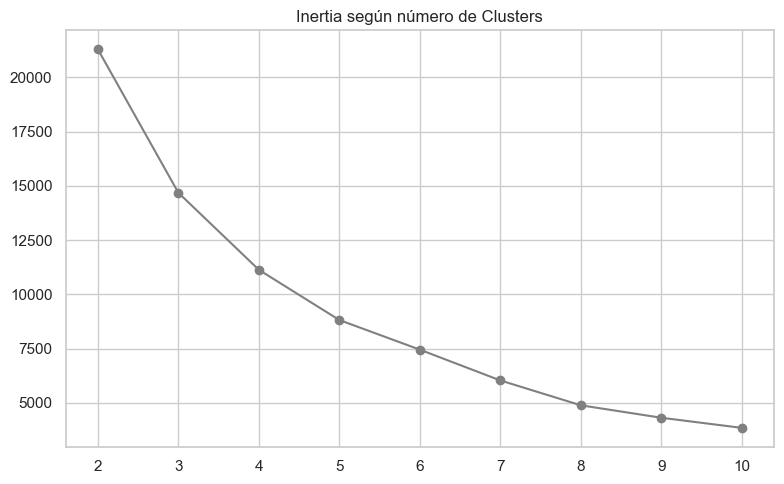

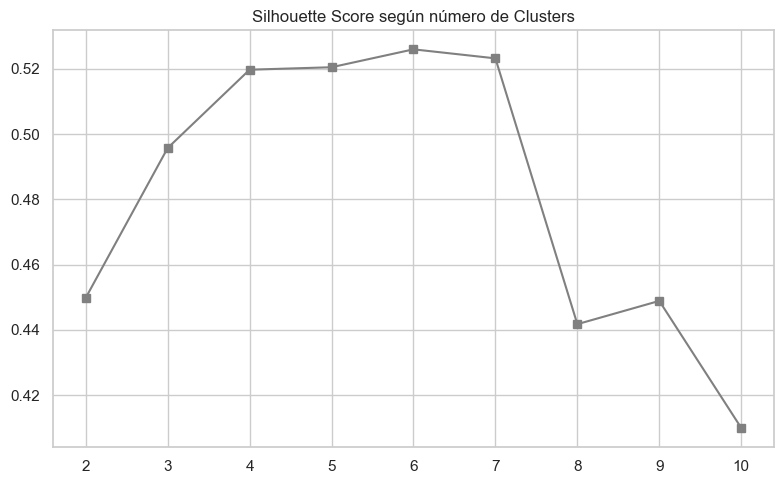

In [101]:
# Definimos rangos de clusters para probar
k_range = range(2, 11)

# Listas para resultados
inertia = []
silhouette = []

# Aplicamos KMeans para cada valor de k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=1234, n_init=10)
    labels = kmeans.fit_predict(X_clustering_basico)
    
    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(X_clustering_basico, labels))

# Gráfico: método del codo
plt.figure(figsize=(8,5))
plt.plot(k_range, inertia, marker='o', color='grey')
plt.title('Inertia según número de Clusters')
plt.xlabel('')
plt.ylabel('')
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

# Gráfico: Silhouette score
plt.figure(figsize=(8,5))
plt.plot(k_range, silhouette, marker='s', color='grey')
plt.title('Silhouette Score según número de Clusters')
plt.xlabel('')
plt.ylabel('')
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

* Un número adecuado de clusters sería k=6.

### Entrenamiento del modelo básico

Probamos diferentes k: 4, 5, 6 y 7

En función de lo observado en las 2 métricas de arriba.

In [102]:
# Función para calcular el resumen de clusters para un k dado
def calcular_resumen_clusters(k, X_clustering_basico, clientes_rfm_e, scaler, vars_escalar):
    # Entrenamos el modelo
    kmeans = KMeans(n_clusters=k, random_state=1234, n_init=10)
    cluster_label = f'cluster_KM_{k}'
    clientes_rfm_e[cluster_label] = kmeans.fit_predict(X_clustering_basico)

    # Cálculo del Silhouette Score
    sil_score = silhouette_score(X_clustering_basico, clientes_rfm_e[cluster_label])
    
    # Estadísticas (escaladas) por cluster
    cluster_summary = clientes_rfm_e.groupby(cluster_label).agg(
        num_clientes=('id', 'count'),
        recency_scaled_mean=('recency', 'mean'),
        frequency_scaled_mean=('frequency', 'mean'),
        monetary_scaled_mean=('monetary', 'mean')
    ).reset_index()
    
    # Medias y desviaciones estándar originales
    mean_recency = scaler.mean_[vars_escalar.index('recency')]
    std_recency = scaler.scale_[vars_escalar.index('recency')]
    
    mean_frequency = scaler.mean_[vars_escalar.index('frequency')]
    std_frequency = scaler.scale_[vars_escalar.index('frequency')]
    
    mean_monetary = scaler.mean_[vars_escalar.index('monetary')]
    std_monetary = scaler.scale_[vars_escalar.index('monetary')]

    # Desescalar
    cluster_summary['recency_medio'] = cluster_summary['recency_scaled_mean'] * std_recency + mean_recency
    cluster_summary['frequency_media'] = cluster_summary['frequency_scaled_mean'] * std_frequency + mean_frequency
    cluster_summary['monetary_medio'] = cluster_summary['monetary_scaled_mean'] * std_monetary + mean_monetary

    # Seleccionar columnas de interés
    summary = cluster_summary[[cluster_label, 'num_clientes', 'recency_medio', 'frequency_media', 'monetary_medio']]
    
    return summary, sil_score

In [103]:
# Aplicamos la función para k=4,5,6,7
resumenes_clusters_km = {}
silhouette_scores_km = {}
for k in [4, 5, 6, 7]:
    resumen, sil_score = calcular_resumen_clusters(k, X_clustering_basico,
                                                   clientes_rfm_e.copy(), scaler, vars_escalar)
    resumenes_clusters_km[k] = resumen
    silhouette_scores_km[k] = sil_score

In [104]:
# Mostramos los summary
for k, resumen in resumenes_clusters_km.items():
    print(f"\nResumen para k={k} (Silhouette Score = {silhouette_scores_km[k]:.4f}):\n")
    display(resumen)


Resumen para k=4 (Silhouette Score = 0.5197):



,cluster_KM_4,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,391,444.066496,12.534527,1456.358056
1,1,5436,667.502575,1.781273,100.723142
2,2,15,246.400000,30.800000,12430.666667
3,3,3670,1748.859673,1.496185,80.767302



Resumen para k=5 (Silhouette Score = 0.5205):



,cluster_KM_5,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,14,270.642857,12.928571,12866.785714
1,1,5431,667.540969,1.774811,100.505800
2,2,3670,1748.859673,1.496185,80.767302
3,3,395,447.222785,12.498734,1427.392405
4,4,2,6.500000,144.500000,6812.500000



Resumen para k=6 (Silhouette Score = 0.5260):



,cluster_KM_6,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,5443,666.432666,1.790740,102.979791
1,1,121,421.487603,6.884298,3268.173554
2,2,269,476.312268,15.044610,740.587361
3,3,9,269.111111,17.222222,15403.888889
4,4,3668,1748.971919,1.490185,79.715649
5,5,2,6.500000,144.500000,6812.500000



Resumen para k=7 (Silhouette Score = 0.5232):



,cluster_KM_7,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,5055,689.064293,1.472008,71.478338
1,1,3617,1755.019353,1.455073,77.655239
2,2,64,316.562500,8.593750,4580.781250
3,3,2,6.500000,144.500000,6812.500000
4,4,7,333.571429,17.142857,17133.428571
5,5,77,382.142857,25.051948,1118.844156
6,6,690,494.242029,7.166667,644.581159


A partir de estos datos **se elige el k=6**:
* Obtiene el mejor score en Silhouette (0.5260).
* Hay una separación más lógica (por tamaño de grupos y sentido del negocio: patrones más claros de gasto).
* Se evitan demasiados grupos pequeños que pueden limitar la acción comercial.

### Gráficos para k=6

In [105]:
# Sacamos el resumen para k=6
summary_KM_6 = resumenes_clusters_km[6]

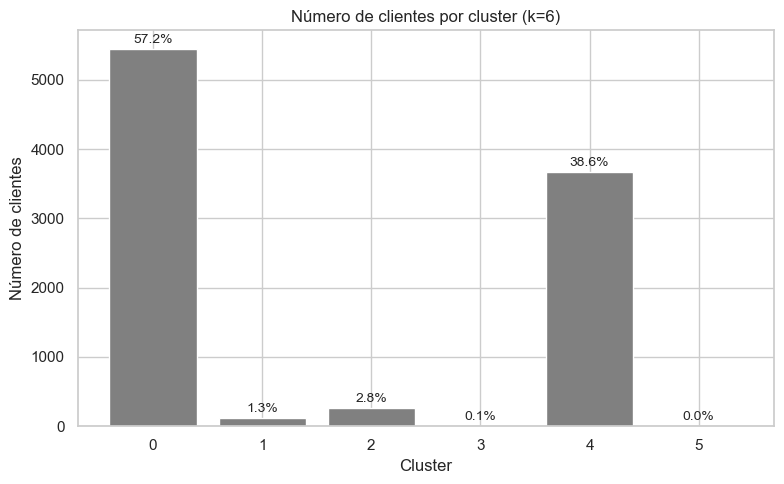

In [106]:
# Calculamos el total de clientes para poder poner los porcentajes
total_clientes = summary_KM_6['num_clientes'].sum()

# Graficamos
plt.figure(figsize=(8,5))
bars = plt.bar(summary_KM_6['cluster_KM_6'], summary_KM_6['num_clientes'], color='grey')
plt.title('Número de clientes por cluster (k=6)')
plt.xlabel('Cluster')
plt.ylabel('Número de clientes')
plt.grid(True)

# Añadimos etiquetas de porcentaje sobre cada barra
for bar in bars:
    height = bar.get_height()
    porcentaje = (height / total_clientes) * 100
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # Centrado.
        height + total_clientes * 0.0045,  # Un poco por encima.
        f'{porcentaje:.1f}%',  # Formato en porcentaje con 1 decimal.
        ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

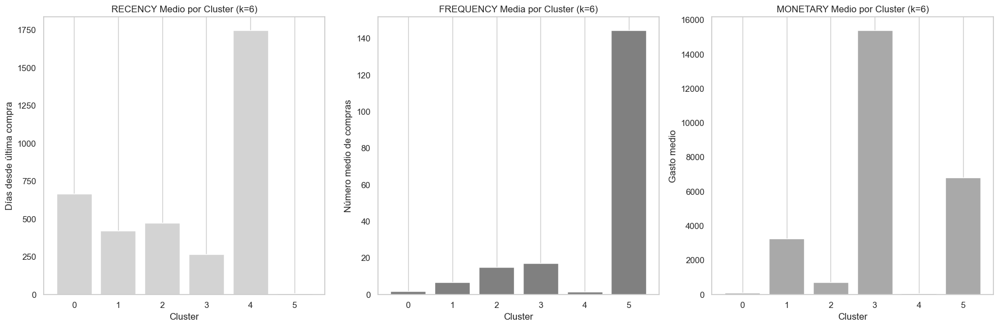

In [107]:
# Gráfico para R, F y M
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Recency
axes[0].bar(summary_KM_6['cluster_KM_6'].astype(str),
            summary_KM_6['recency_medio'], color='lightgrey')
axes[0].set_title('RECENCY Medio por Cluster (k=6)')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Días desde última compra')
axes[0].grid(axis='y')

# Frequency
axes[1].bar(summary_KM_6['cluster_KM_6'].astype(str),
            summary_KM_6['frequency_media'], color='grey')
axes[1].set_title('FREQUENCY Media por Cluster (k=6)')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Número medio de compras')
axes[1].grid(axis='y')

# Monetary
axes[2].bar(summary_KM_6['cluster_KM_6'].astype(str),
            summary_KM_6['monetary_medio'], color='darkgrey')
axes[2].set_title('MONETARY Medio por Cluster (k=6)')
axes[2].set_xlabel('Cluster')
axes[2].set_ylabel('Gasto medio')
axes[2].grid(axis='y')

# Ajuste
plt.tight_layout()
plt.show()

In [108]:
# Entrenar el modelo y guardar los clusters
kmeans_basico_final = KMeans(n_clusters=6, random_state=1234, n_init=10)
clientes_rfm_e['cluster_KM_basico'] = kmeans_basico_final.fit_predict(X_clustering_basico)

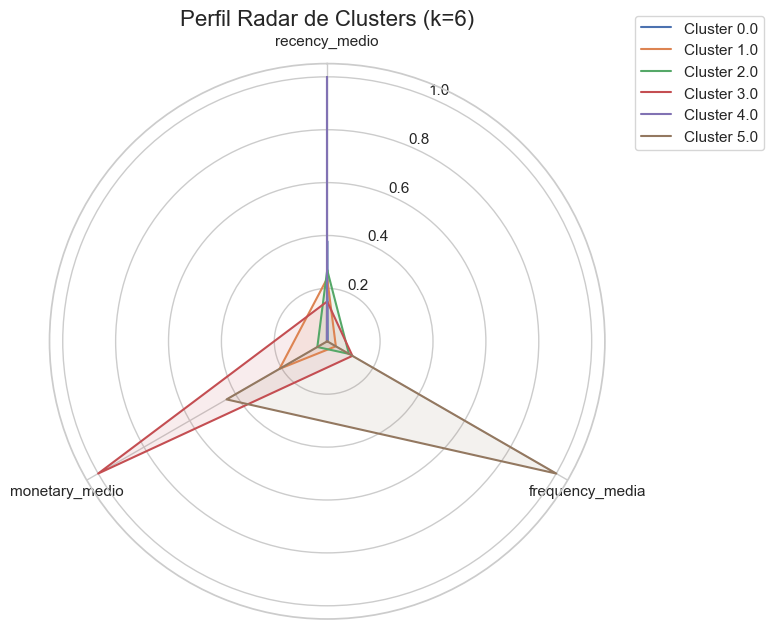

In [109]:
# Radar plot

# Variables que vamos a usar
features = ['recency_medio', 'frequency_media', 'monetary_medio']

# Extraemos valores del resumen
values = summary_KM_6[features].values

# Normalizamos los valores entre 0 y 1 para que sean comparables en el radar plot
scaler_radar = MinMaxScaler()
values_normalized = scaler_radar.fit_transform(values)

# Preparamos el gráfico
num_vars = len(features)

# Ángulos para cada variable
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Para cerrar el círculo

# Graficamos el Radar plot
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(polar=True))

# Graficar cada cluster
for idx, row in enumerate(values_normalized):
    data = row.tolist()
    data += data[:1]  # Cerramos círculo
    ax.plot(angles, data, label=f'Cluster {summary_KM_6.iloc[idx]["cluster_KM_6"]}')
    ax.fill(angles, data, alpha=0.1)

# Configuración
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)

# Etiquetas
ax.set_thetagrids(np.degrees(angles[:-1]), features)

# Título y leyenda
plt.title('Perfil Radar de Clusters (k=6)', size=16)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

# Ajuste
plt.tight_layout()
plt.show()

### Conclusiones modelo RFM Básico

- https://www.flowww.com.mx/blog/por-que-es-necesario-para-tu-negocio-identificar-a-tus-clientes-vip **(VIPs)**
- https://bonoincentivo.com/como-ofrecer-experiencias-vip-a-clientes-importantes/ **(VIPs)**
- https://www.centrosdellamadas.com/estrategias-para-la-retencion-de-clientes-vip/ **(VIPs)**
- https://www.zendesk.com.mx/blog/estrategias-fidelizar-clientes/ **(Fidelización)**
- https://www.captainwallet.com/es/blog/despierta-a-tus-clientes-inactivos-estrategias-innovadoras-para-reavivar-su-compromiso/ **(Inactivos)**
- https://esw.com/es/9-estrategias-para-recuperar-a-los-clientes-inactivos/ **(Inactivos)**
- https://www.actito.com/es-ES/blog/que-estrategia-para-reactivar-sus-inactivos/ **(Inactivos)**

**Cluster 0.** Clientes inactivos de bajo valor. (5443 clientes)
* Recency alta (666 días sin comprar).
* Frecuencia muy baja (1.79 compras en total).
* Gasto bajo (103 pesos).

Estos clientes son mayoritarios (57% del total), pero tienen muy poca actividad y valor.

Estrategias posibles:
* Automatizar newsletters genéricas.
* Ofertas masivas de bajo coste.
* Evitar dedicar recursos activos personalizados.
* Mantenerlos en comunicación mínima para optimizar costes.

**Cluster 1.** Clientes moderadamente activos de alto gasto. (121 clientes)
* Recency moderada (421 días).
* Frecuencia media-alta (6.88 compras).
* Gasto elevado (3268 pesos).

Clientes interesantes ya que aunque su frecuencia no es máxima, su gasto por cliente es muy alto.

Estrategias posibles:
* Programas de fidelización con recompensas atractivas.
* Promociones personalizadas basadas en preferencias de compra.
* Cross-selling y up-selling de productos premium.
* Email marketing segmentado de alta calidad.

**Cluster 2.** Clientes activos de frecuencia media. (269 clientes)
* Recency aceptable (476 días).
* Frecuencia alta (15 compras).
* Gasto medio (741 pesos).

Clientes bastante fieles en cuanto a frecuencia, aunque su gasto medio podría mejorarse.

Estrategias posibles:
* Ofertas por volumen de compra o paquetes (bundles).
* Incentivos para aumentar el ticket medio (por ejemplo, descuentos en segundas unidades).
* Promociones de productos de mayor valor.

**Cluster 3.** Clientes VIPs extremos. (9 clientes)
* Recency baja (269 días).
* Frecuencia altísima (17 compras).
* Gasto altísimo (15404 pesos).

Este grupo es muy pequeño pero extremadamente valioso.

Estrategias posibles:
* Trato personalizado y exclusivo.
* Envíos de agradecimiento y beneficios especiales.
* Acceso prioritario a lanzamientos de productos o eventos privados.

**Cluster 4.** Clientes muy inactivos y de muy bajo valor. (3668 clientes)
* Recency altísima (1749 días sin comprar).
* Frecuencia mínima (1.49 compras).
* Gasto muy bajo (80 pesos).

Clientes prácticamente perdidos o desconectados.

Estrategias posibles:
* Campañas de reactivación solo en momentos clave (rebajas, navidad).
* Newsletters automatizadas con promociones agresivas.
* Reducción de esfuerzo comercial activo.

**Cluster 5.** Clientes ultra VIP o clientes recientes de frecuencia máxima. (2 clientes)
* Recency mínima (6.5 días).
* Frecuencia extrema (144 compras).
* Gasto muy alto (6812 pesos).

Grupo minúsculo pero de altísimo valor estratégico.

Estrategias posibles:
* Asignación de gestor personal.
* Programas de fidelización VIP a medida.
* Ofertas y servicios totalmente personalizados.

En **resumen según prioridad**:
- **Muy alta prioridad**: Clusters 3 y 5 (VIPs, ultra VIPs) -> Relación personal, fidelización extrema.
- **Alta prioridad**: Cluster 1 -> Fidelizar y crecer con clientes rentables.
- **Media prioridad**: Cluster 2 -> Incrementar su gasto medio.
- **Baja prioridad**: Clusters 0 y 4 -> Automatización, bajo esfuerzo comercial.

Se observa que **también hay problemas**:
* Grupos demasiado pequeños pueden ser anomalías estadísticas o outliers, y carecer de sentido aplicar estrategias comerciales a grupos tan pequeños (excesiva o mala segmentación).
* Esto desemboca en que, desde el punto de vista puramente del negocio, tal vez interese un número de clusters menor: los 4 indicados según prioridad.

## Modelo RFM ampliado

### Variables seleccionadas (11)

Se descartan **variables tipo fecha** porque no dan información directa para agrupar.

Se descartan **variables dummificadas** porque K-means trabaja mejor con variables continuas, no maneja bien datos categóricos. Inicialmente debemos buscar una interpretación sencilla de los clústeres.

**Se descartan**, al menos inicialmente, variables no directas o menos limpias ya que el objetivo es maximizar la calidad y el sentido económico de la segmentación.
* **consumos_total:** número de consultas o interacciones. Está relacionada con consultas, pero no con ventas.
* **n_consultas:** Mejor usamos consultas_por_dia ya que es una métrica normalizada que mide la actividad relativa, y no solo el conteo de consultas. Redundante con consultas_por_dia.
* **dias_distintos_consulta:** relacionada con consultas_por_dia. Mejor usamos una tasa como consultas_por_dia.
* **empresas_unicas_consult:** similar a n_sectores_distintos. Ya se utiliza variedad de sectores y de productos consultados.
* **n_tamanos_distintos:** altamente correlacionada con n_productos_distintos y n_sectores_distintos que ya están incluidas.
* **tipo_cliente:** está construida a partir del número de compras del cliente.

Por tanto, la idea es evitar multicolinealidad y que el algoritmo les dé a esas dimensiones más peso por estar repetidas.

### Búsqueda: método del codo y Silhoutte

In [110]:
# Lista de variables finales (11) seleccionadas para clustering
vars_clustering = ['recency',
                   'frequency',
                   'monetary',
                   'dias_cliente',
                   'consultas_por_dia',
                   'dias_entre_compras',
                   'media_gasto',
                   'n_productos_distintos',
                   'n_sectores_distintos',
                   'tamano_encoded',
                   'antiguedad_encoded']

# Creamos el dataset de clustering
X_clustering = clientes_rfm_e[vars_clustering].copy()

# Comprobamos
X_clustering.head()

,recency,frequency,monetary,dias_cliente,consultas_por_dia,dias_entre_compras,media_gasto,n_productos_distintos,n_sectores_distintos,tamano_encoded,antiguedad_encoded
0,1.994464,-0.311631,-0.195155,-0.367821,1.276451,-0.329343,-0.175863,0.652601,-0.106828,0.787032,0.762932
1,1.423764,-0.311631,-0.224459,0.957054,-0.244007,-0.329343,-0.294725,-0.707210,-0.459047,-1.604741,-1.436162
2,1.572019,9.636364,1.078117,-0.367821,0.060898,-0.284548,-0.242489,2.692317,1.654263,-1.126387,-0.703131
3,-1.574800,2.914746,0.755770,-0.119869,0.692841,0.827322,-0.071173,3.372222,0.949827,0.787032,0.762932
4,1.994464,-0.311631,-0.214203,-0.367821,-0.244007,-0.329343,-0.253124,-0.707210,-0.459047,0.787032,0.762932


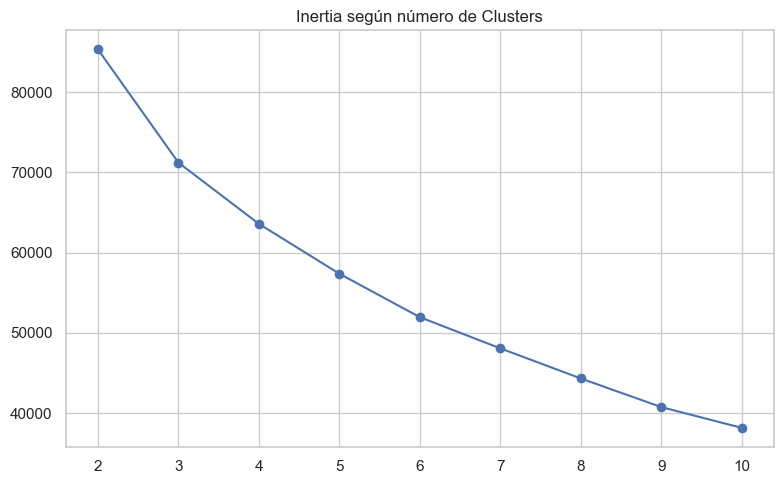

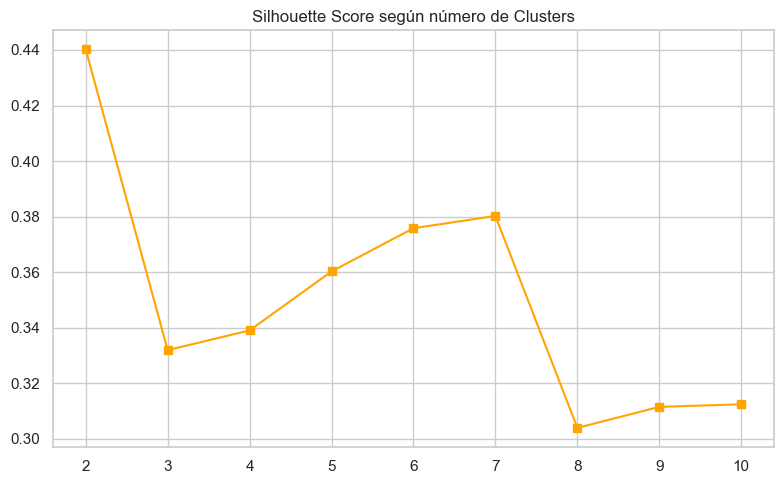

In [111]:
# Definimos rangos de clusters para probar
k_range = range(2, 11)

# Listas para resultados
inertia = []
silhouette = []

# Aplicamos KMeans para cada valor de k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=1234, n_init=10)
    labels = kmeans.fit_predict(X_clustering)
    
    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(X_clustering, labels))

# Gráfico: método del codo
plt.figure(figsize=(8,5))
plt.plot(k_range, inertia, marker='o')
plt.title('Inertia según número de Clusters')
plt.xlabel('')
plt.ylabel('')
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

# Gráfico: Silhouette score
plt.figure(figsize=(8,5))
plt.plot(k_range, silhouette, marker='s', color='orange')
plt.title('Silhouette Score según número de Clusters')
plt.xlabel('')
plt.ylabel('')
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

* Según el método del codo y de forma visual el número de clusters sería 4 ó 5.
* El mayor valor para Silhoutte (cuanto más cerca de 1, mejor) se encuentra en 2, luego cae, y vuelve a subir estabilizándose entre 5 y 7.

**Conclusión**

Dos clusters puede ser demasiado pobre como segmentación realista. 5, 6 ó 7 clusters parece más lógico si tenemos en cuenta que queremos realizar un análisis un poco más realista aunque con clusters bien diferenciados.

Por tanto, nos quedamos con esos valores y probamos a ver qué tal funciona la interpretación.

### Entrenamiento del modelo ampliado (11 variables)

In [112]:
# Función para calcular el resumen de clusters con las nuevas variables (11)
def calcular_resumen_clusters(k, X_clustering, clientes_rfm_e, scaler, vars_escalar):
    # Entrenamos el modelo
    kmeans = KMeans(n_clusters=k, random_state=1234, n_init=10)
    cluster_label = f'cluster_KM_{k}'
    clientes_rfm_e[cluster_label] = kmeans.fit_predict(X_clustering)

    # Cálculo del Silhouette Score
    sil_score = silhouette_score(X_clustering, clientes_rfm_e[cluster_label])

    # Estadísticas (escaladas) por cluster
    cluster_summary = clientes_rfm_e.groupby(cluster_label).agg(
        num_clientes=('id', 'count'),
        recency_scaled_mean=('recency', 'mean'),
        frequency_scaled_mean=('frequency', 'mean'),
        monetary_scaled_mean=('monetary', 'mean')
    ).reset_index()

    # Medias y desviaciones estándar originales
    mean_recency = scaler.mean_[vars_escalar.index('recency')]
    std_recency = scaler.scale_[vars_escalar.index('recency')]

    mean_frequency = scaler.mean_[vars_escalar.index('frequency')]
    std_frequency = scaler.scale_[vars_escalar.index('frequency')]

    mean_monetary = scaler.mean_[vars_escalar.index('monetary')]
    std_monetary = scaler.scale_[vars_escalar.index('monetary')]

    # Desescalar
    cluster_summary['recency_medio'] = cluster_summary['recency_scaled_mean'] * std_recency + mean_recency
    cluster_summary['frequency_media'] = cluster_summary['frequency_scaled_mean'] * std_frequency + mean_frequency
    cluster_summary['monetary_medio'] = cluster_summary['monetary_scaled_mean'] * std_monetary + mean_monetary

    # Seleccionar columnas de interés
    summary = cluster_summary[[cluster_label, 'num_clientes', 'recency_medio',
                               'frequency_media', 'monetary_medio']]

    return summary, sil_score

# Aplicamos la función para k=5,6,7
resumenes_clusters_km_amp = {}
silhouette_scores_km_amp = {}

for k in [5, 6, 7]:
    resumen, sil_score = calcular_resumen_clusters(k, X_clustering, clientes_rfm_e.copy(), scaler, vars_escalar)
    resumenes_clusters_km_amp[k] = resumen
    silhouette_scores_km_amp[k] = sil_score

# Mostramos resúmenes
for k, resumen in resumenes_clusters_km_amp.items():
    print(f"\nResumen para k={k} (Silhouette Score = {silhouette_scores_km_amp[k]:.4f}):\n")
    display(resumen)


Resumen para k=5 (Silhouette Score = 0.3603):



,cluster_KM_5,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,42,404.738095,14.738095,7390.690476
1,1,4913,1158.517810,1.400773,49.310605
2,2,493,701.251521,1.655172,72.740365
3,3,1311,627.369184,6.035088,618.010679
4,4,2753,1215.833636,1.564838,73.046858



Resumen para k=6 (Silhouette Score = 0.3758):



,cluster_KM_6,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,822,678.643552,7.568127,921.389294
1,1,4920,1157.213211,1.439431,51.180488
2,2,2841,1192.080253,1.673706,79.337909
3,3,399,561.533835,2.802005,161.546366
4,4,497,697.720322,1.708249,75.128773
5,5,33,464.606061,15.515152,7983.575758



Resumen para k=7 (Silhouette Score = 0.3803):



,cluster_KM_7,num_clientes,recency_medio,frequency_media,monetary_medio
0,0,483,699.863354,1.645963,72.848861
1,1,2637,1226.508153,1.436481,66.866894
2,2,27,462.962963,18.444444,9206.111111
3,3,270,821.529630,4.818519,1547.700000
4,4,4779,1167.145219,1.332078,46.373509
5,5,995,653.733668,7.013065,454.096482
6,6,321,589.669782,2.526480,150.903427


A partir de estos datos se elige **k=6**:
* k=7 tiene mejor score, pero este fragmenta demasiado.
* k=6 respecto a k=5 permite la aparición de segmentos diferenciados sin excesiva fragmentación.
* Es un equilibrio entre los datos teóricos y la aplicación comercial.
* El modelo básico (con mejor score en Silhouette) también apuntaba a k=6.

**El descenso del Silhoutte Score: más variables -> más dimensiones -> clientes más dispersos -> peor Silhouette.**
- Al aumentar las dimensiones, es mucho más difícil que los datos queden agrupados de forma "compacta" y "separada", porque aumenta la dimensionalidad.
- Se puede estar añadiendo ruido con las nuevas variables ya que pueden tener distribuciones diferentes. Esto afecta a cómo de compactos son los clusters.
- Con más variables se captan más matices de los clientes, lo que hace que no encajen perfectamente en un solo cluster y bajando la cohesión.
- Sin embargo, ahora los clusters están mejor descritos y son más realistas.

### Gráficos para k=6

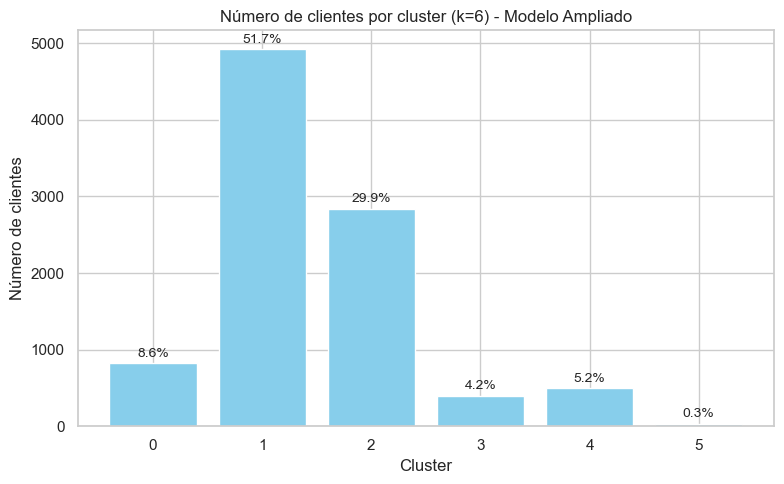

In [113]:
# Sacamos el resumen para k=6 (modelo ampliado)
summary_KM_6_amp = resumenes_clusters_km_amp[6]

# Calculamos el total de clientes
total_clientes = summary_KM_6_amp['num_clientes'].sum()

# Graficamos
plt.figure(figsize=(8,5))
bars = plt.bar(summary_KM_6_amp['cluster_KM_6'], summary_KM_6_amp['num_clientes'], color='skyblue')
plt.title('Número de clientes por cluster (k=6) - Modelo Ampliado')
plt.xlabel('Cluster')
plt.ylabel('Número de clientes')
plt.grid(True)

# Añadimos etiquetas de porcentaje sobre cada barra
for bar in bars:
    height = bar.get_height()
    porcentaje = (height / total_clientes) * 100
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + total_clientes * 0.0045,
        f'{porcentaje:.1f}%',
        ha='center', va='bottom', fontsize=10
    )

plt.tight_layout()
plt.show()

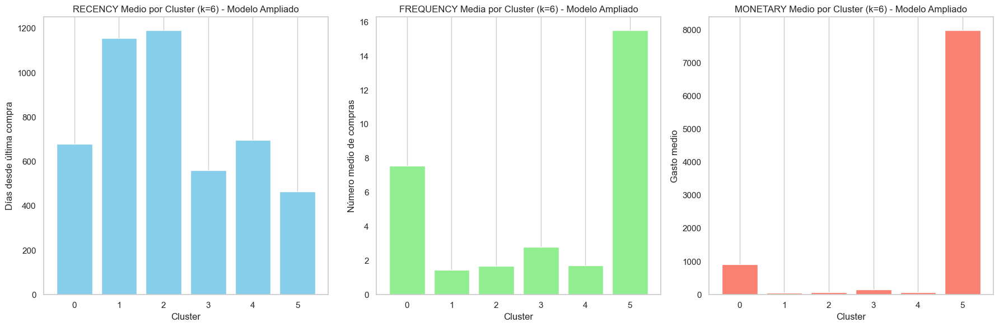

In [114]:
# Gráfico para RFM del modelo ampliado (11 variables)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Recency
axes[0].bar(summary_KM_6_amp['cluster_KM_6'].astype(str),
            summary_KM_6_amp['recency_medio'], color='skyblue')
axes[0].set_title('RECENCY Medio por Cluster (k=6) - Modelo Ampliado')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Días desde última compra')
axes[0].grid(axis='y')

# Frequency
axes[1].bar(summary_KM_6_amp['cluster_KM_6'].astype(str),
            summary_KM_6_amp['frequency_media'], color='lightgreen')
axes[1].set_title('FREQUENCY Media por Cluster (k=6) - Modelo Ampliado')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Número medio de compras')
axes[1].grid(axis='y')

# Monetary
axes[2].bar(summary_KM_6_amp['cluster_KM_6'].astype(str),
            summary_KM_6_amp['monetary_medio'], color='salmon')
axes[2].set_title('MONETARY Medio por Cluster (k=6) - Modelo Ampliado')
axes[2].set_xlabel('Cluster')
axes[2].set_ylabel('Gasto medio')
axes[2].grid(axis='y')

# Ajuste
plt.tight_layout()
plt.show()

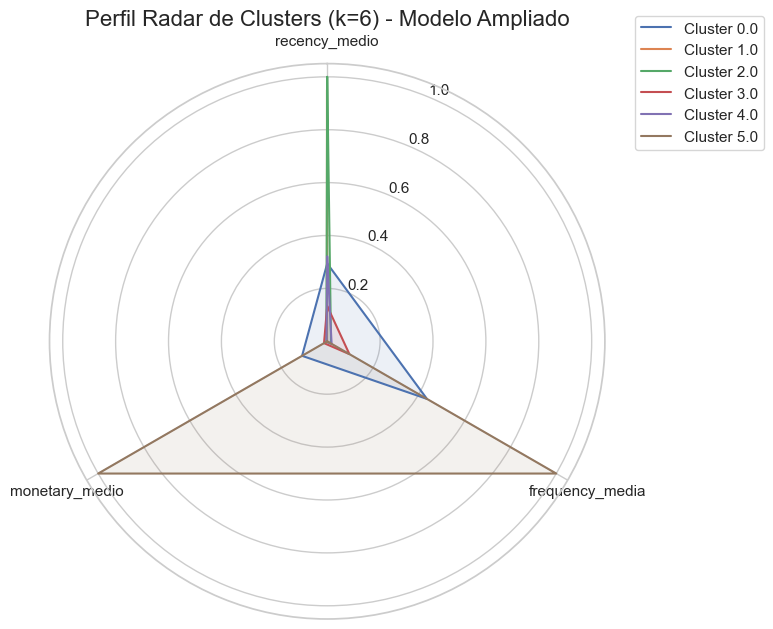

In [115]:
# Variables que vamos a usar
features = ['recency_medio', 'frequency_media', 'monetary_medio']

# Extraemos valores del resumen ampliado
values = summary_KM_6_amp[features].values

# Normalizamos los valores entre 0 y 1 para que sean comparables en el radar plot
scaler_radar = MinMaxScaler()
values_normalized = scaler_radar.fit_transform(values)

# Preparamos el gráfico
num_vars = len(features)

# Ángulos para cada variable
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Para cerrar el círculo

# Graficamos el Radar plot
fig, ax = plt.subplots(figsize=(8,8), subplot_kw=dict(polar=True))

# Graficar cada cluster
for idx, row in enumerate(values_normalized):
    data = row.tolist()
    data += data[:1]  # Cerramos círculo
    ax.plot(angles, data, label=f'Cluster {summary_KM_6_amp.iloc[idx]["cluster_KM_6"]}')
    ax.fill(angles, data, alpha=0.1)

# Configuración
ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)

# Etiquetas
ax.set_thetagrids(np.degrees(angles[:-1]), features)

# Título y leyenda
plt.title('Perfil Radar de Clusters (k=6) - Modelo Ampliado', size=16)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))

# Ajuste
plt.tight_layout()
plt.show()

### Gráfico Radarplot con 7 dimensiones

Las otras 4 variables (dias_cliente, consultas_por_dia, tamano_encoded, antiguedad_encoded) son más contextuales y por eso no se han incluido, y para hacer el gráfico más claro.

In [116]:
# Entrenar el modelo y asignar los clusters
kmeans_final = KMeans(n_clusters=6, random_state=1234, n_init=10)
clientes_rfm_e['cluster_KM_6_amp'] = kmeans_final.fit_predict(X_clustering)

In [117]:
# Crear resumen completo para Radar Plot extendido
summary_KM_6_amp_full = clientes_rfm_e.groupby('cluster_KM_6_amp').agg({
    'recency': 'mean',
    'frequency': 'mean',
    'monetary': 'mean',
    'dias_cliente': 'mean',
    'consultas_por_dia': 'mean',
    'dias_entre_compras': 'mean',
    'media_gasto': 'mean',
    'n_productos_distintos': 'mean',
    'n_sectores_distintos': 'mean',
    'tamano_encoded': 'mean',
    'antiguedad_encoded': 'mean'
}).reset_index()

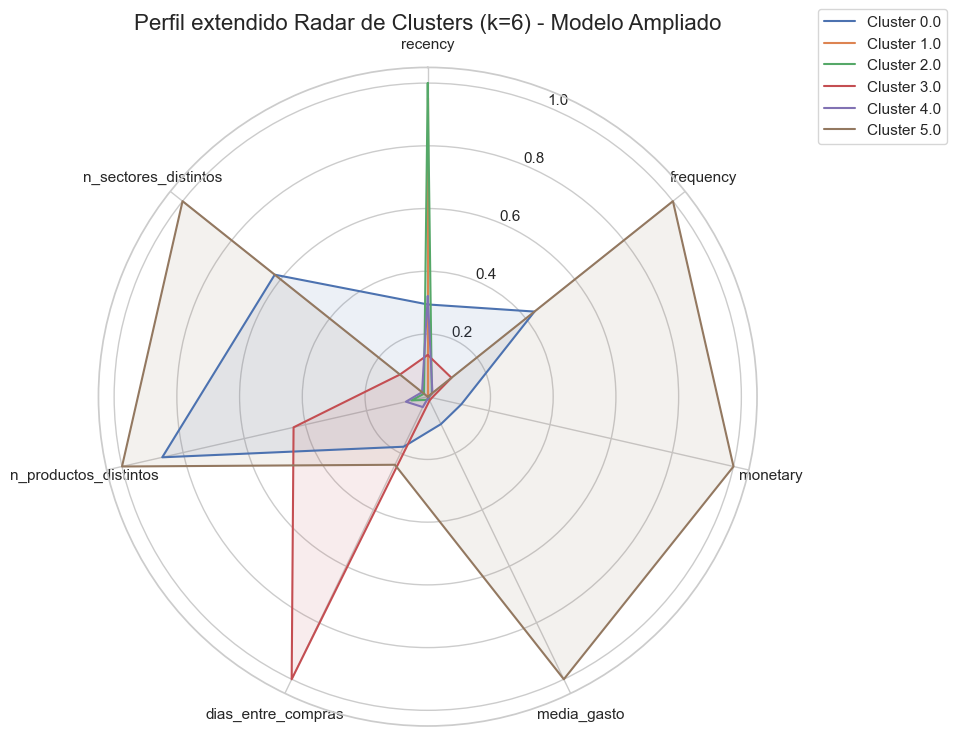

In [118]:
# Variables seleccionadas para el radar plot extendido
features_extended = ['recency',
                     'frequency',
                     'monetary',
                     'media_gasto',
                     'dias_entre_compras',
                     'n_productos_distintos',
                     'n_sectores_distintos']

# Extraer valores
values_extended = summary_KM_6_amp_full[features_extended].values

# Normalizar
scaler_radar_ext = MinMaxScaler()
values_normalized_ext = scaler_radar_ext.fit_transform(values_extended)

# Ángulos
num_vars_ext = len(features_extended)
angles_ext = np.linspace(0, 2 * np.pi, num_vars_ext, endpoint=False).tolist()
angles_ext += angles_ext[:1]

# Graficar radar plot extendido
fig, ax = plt.subplots(figsize=(10,10), subplot_kw=dict(polar=True))

for idx, row in enumerate(values_normalized_ext):
    data = row.tolist()
    data += data[:1]
    ax.plot(angles_ext, data, label=f'Cluster {summary_KM_6_amp_full.iloc[idx]["cluster_KM_6_amp"]}')
    ax.fill(angles_ext, data, alpha=0.1)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles_ext[:-1]), features_extended)

plt.title('Perfil extendido Radar de Clusters (k=6) - Modelo Ampliado', size=16)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()

In [119]:
# 11 Variables a desescalar (las 11 finales)
vars_extended_full = ['recency',
                      'frequency',
                      'monetary',
                      'dias_cliente',
                      'consultas_por_dia',
                      'dias_entre_compras',
                      'media_gasto',
                      'n_productos_distintos',
                      'n_sectores_distintos',
                      'tamano_encoded',
                      'antiguedad_encoded']

# Primero, agrupamos las medias escaladas
cluster_summary_amp_full = clientes_rfm_e.groupby('cluster_KM_6_amp').agg(
    num_clientes=('id', 'count'),
    **{f"{var}_scaled_mean": (var, 'mean') for var in vars_extended_full}
).reset_index()

# Segundo desescalamos cada variable
for var in vars_extended_full:
    mean_var = scaler.mean_[vars_escalar.index(var)]
    std_var = scaler.scale_[vars_escalar.index(var)]
    
    # Creamos la variable desescalada
    cluster_summary_amp_full[f"{var}_medio"] = cluster_summary_amp_full[f"{var}_scaled_mean"] * std_var + mean_var

# Seleccionamos solo las columnas finales de interés
columns_finales_full = ['cluster_KM_6_amp', 'num_clientes'] + [f"{var}_medio" for var in vars_extended_full]
summary_KM_6_amp_extended_full = cluster_summary_amp_full[columns_finales_full]

# Mostramos el resumen
display(summary_KM_6_amp_extended_full)

,cluster_KM_6_amp,num_clientes,recency_medio,frequency_medio,monetary_medio,dias_cliente_medio,consultas_por_dia_medio,dias_entre_compras_medio,media_gasto_medio,n_productos_distintos_medio,n_sectores_distintos_medio,tamano_encoded_medio,antiguedad_encoded_medio
0,0,822,678.643552,7.568127,921.389294,49.463504,8.814400,122.568982,219.835378,4.126521,7.956204,2.395377,5.232360
1,1,4920,1157.213211,1.439431,51.180488,39.883537,0.804443,11.806248,35.529511,0.561992,0.490244,4.993089,6.986179
2,2,2841,1192.080253,1.673706,79.337909,49.637804,1.103630,18.898093,52.457767,0.779655,0.674058,0.860260,4.417107
3,3,399,561.533835,2.802005,161.546366,74.902256,2.464692,637.584151,61.003028,2.363409,1.847118,3.037594,5.847118
4,4,497,697.720322,1.708249,75.128773,1079.762575,1.117649,34.717531,43.477805,0.855131,0.768612,3.305835,5.993964
5,5,33,464.606061,15.515152,7983.575758,29.272727,27.697258,162.549035,1936.338905,4.666667,12.454545,2.303030,4.545455


### Conclusiones modelo ampliado (11 variables)

**Cluster 0. Clientes activos de frecuencia alta y gasto considerable (822 clientes)**

Clientes con recency moderado (679 días), buena frecuencia de compra (7,6 compras) y gasto medio-alto (921). Además, compran una amplia variedad de productos y sectores.

Estrategias posibles:
* Programas de fidelización.
* Incentivos para aumentar ticket medio (cross-selling, bundles).

**Cluster 1. Clientes muy inactivos y de muy bajo valor (4920 clientes)**

Clientes con recency altísima (1157 días), frecuencia mínima (1,4 compras) y gasto bajísimo (51).
Representan la mayoría de la base, pero tienen actividad muy escasa.

Estrategias posibles:
* Automatizar newsletters genéricas.
* Reducir esfuerzos personalizados para optimizar costes.

**Cluster 2. Clientes inactivos de valor ligeramente superior (2841 clientes)**

Recency muy alta (1192 días), frecuencia baja (1,7 compras) y gasto algo mayor (79) que Cluster 1.
Algo más diversos en productos y sectores, pero siguen siendo clientes inactivos.

Estrategias posibles:
* Campañas de reactivación estacional.
* Ofertas masivas de bajo coste para fomentar reactivación.

**Cluster 3. Clientes moderadamente activos de gasto medio (399 clientes)**

Clientes con recency aceptable (561 días), frecuencia moderada (2,8 compras) y gasto medio-bajo (162).
Tienen diversidad en productos y sectores y pueden ser reactivados.

Estrategias posibles:
* Programas para aumentar frecuencia de compra.
* Promociones dirigidas a incrementar el ticket medio.

**Cluster 4. Clientes antiguos y de baja actividad (497 clientes)**

Clientes con recency alto (698 días) y frecuencia baja (1,7 compras).
Permanecen mucho tiempo como clientes (antigüedad alta), pero su actividad es baja.

Estrategias posibles:
* Campañas específicas de recuperación en fechas clave (Black Friday, Navidad).
* Incentivos especiales para recompra tras largos periodos de inactividad.

**Cluster 5. Clientes ultra VIP de altísimo valor (33 clientes)**

Clientes recientes (465 días), con frecuencia altísima (15,5 compras) y gasto desorbitado (7984).
Compran muchos productos y sectores diferentes.

Estrategias posibles:
* Gestión personalizada (gestor VIP).
* Ofertas y servicios exclusivos, programas premium a medida.

**En resumen, según prioridad:**
* Media-Alta. **Clusters 3 y 0** son clave para **crecimiento** (programas de fidelización y crecimiento de ticket).
* Baja. **Clusters 1, 2 y 4** deben tratarse mediante **estrategias automatizadas y de bajo coste.**
* Alta. **Cluster 5** representa un activo estratégico de **máximo valor** que debe protegerse con **atención exclusiva.**

## Alternativas a K-means: DBSCAN

### Valores de epsión (DBSCAN 11 variables)

* DBSCAN mfunciona mejor con variables numéricas continuas o variables codificadas numéricamente.
* Las One Hot Encoding son válidas pero aumentan mucho la dimensión.

Por tanto, a efectos de poder comprar ambos algoritmos **utilizaremos las mismas variables.**

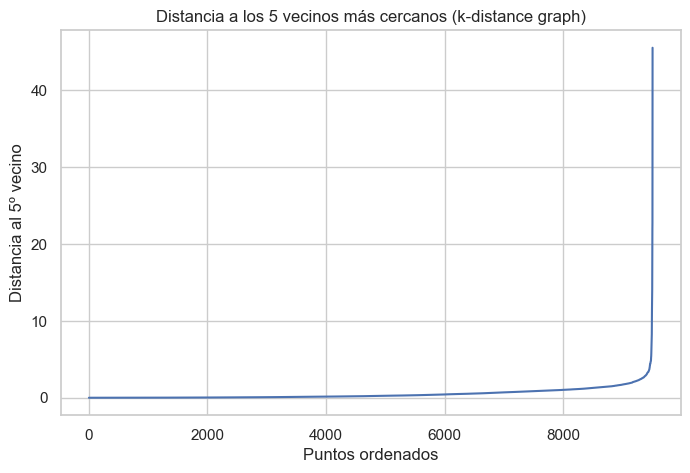

In [120]:
# Visualizar distancias para estimar el mejor valor de eps
neighbors = NearestNeighbors(n_neighbors=5)  # Valor estándar, aunque se puede usar 4 ó 6.
neighbors_fit = neighbors.fit(X_clustering)
distances, indices = neighbors_fit.kneighbors(X_clustering)

# Ordenamos las distancias para visualizar el punto del "codo"
distances = np.sort(distances[:, 4])  # Seleccionamos la 5ª distancia más cercana
plt.figure(figsize=(8,5))
plt.plot(distances)
plt.title('Distancia a los 5 vecinos más cercanos (k-distance graph)')
plt.xlabel('Puntos ordenados')
plt.ylabel('Distancia al 5º vecino')
plt.grid(True)
plt.show()

eps (epsilón) es la distancia máxima que puede haber entre 2 puntos para que se consideren vecinos. Si un punto no tiene suficientes vecinos dentro de eps, se considera ruido (outlier).

Parece que "eps" puede estar entre 1.2 y 1.5.

* min_samples < 5 (ej., 3): detecta microgrupos, pero al haber más clusters también hay más ruido.
* min_samples = 5: detecta clusters medios y es el estándar. Solución equilibrada.
* min_samples > 5 (ej., 8): solo detecta clusters grandes y densos. Pocos clusters y más outliers.

In [121]:
# Instanciamos el modelo DBSCAN
dbscan = DBSCAN(eps=1.5, min_samples=5)

# Ajustamos el modelo y predecimos clusters
dbscan_labels = dbscan.fit_predict(X_clustering)

# Añadimos clusters al dataframe
clientes_rfm_e['cluster_dbscan'] = dbscan_labels

# Cuántos puntos hay en cada cluster
resumen_clusters_dbscan = clientes_rfm_e['cluster_dbscan'].value_counts().sort_index()

In [122]:
# Puntos por cluster
print("Resumen de número de clientes por cluster DBSCAN:")
print(resumen_clusters_dbscan)

Resumen de número de clientes por cluster DBSCAN:
cluster_dbscan
-1     498
 0    5491
 1    3518
 2       5
Name: count, dtype: int64


Vemos que:
* -1: ruido. Puede que sea demasiado ruido (5,2%).
* 0 y 1: Clusters numerosos, 58% y 37%, respectivamente.
* 2: Cluster muy pequeño.

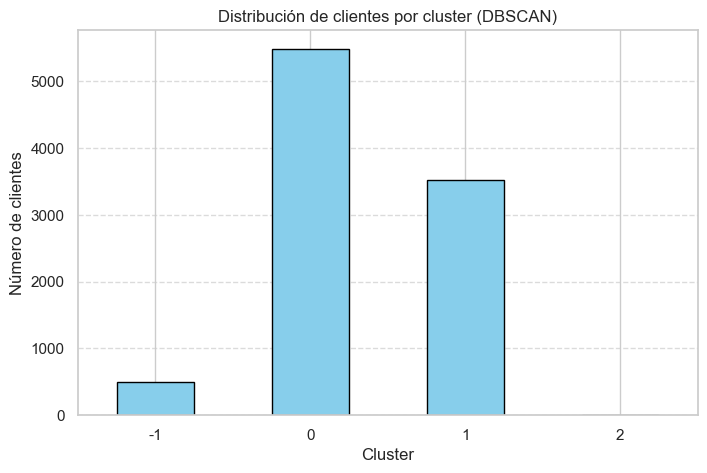

In [123]:
# Crear gráfico de barras
plt.figure(figsize=(8,5))
resumen_clusters_dbscan.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribución de clientes por cluster (DBSCAN)')
plt.xlabel('Cluster')
plt.ylabel('Número de clientes')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### DBSCAN con búsqueda por rejilla (eps x min_samples)

In [124]:
# Rango de valores para eps y min_samples
eps_values = np.arange(1.0, 2.1, 0.1)  # De 1.0 a 2.0 (inclusive) en saltos de 0.1.
min_samples_values = range(3, 11)      # De 3 a 10 de 1 en 1.

# Guardar resultados
results = []

# Búsqueda de combinaciones
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_clustering)

        # Solo calculamos Silhouette si hay al menos 2 clusters (y no solo ruido)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        if n_clusters >= 2:
            score = silhouette_score(X_clustering, labels)
            results.append({'eps': round(eps, 1), 'min_samples': min_samples,
                            'n_clusters': n_clusters, 'silhouette': score})
        else:
            results.append({'eps': round(eps, 1), 'min_samples': min_samples,
                            'n_clusters': n_clusters, 'silhouette': -1})  # Valor negativo si no es válido.

# Convertimos a DataFrame para verlo mejor
results_df = pd.DataFrame(results)

# Resultados ordenados por mejor Silhouette Score (más cerca de 1, mejor)
results_df = results_df.sort_values(by='silhouette', ascending=False)
display(results_df)  # Silhoutte = -1 cuando no se forman al menos 2 clusters.

,eps,min_samples,n_clusters,silhouette
51,1.6,6,2,0.561053
52,1.6,7,2,0.556536
54,1.6,9,2,0.542844
77,1.9,8,2,0.510827
86,2.0,9,2,0.507409
...,...,...,...,...
62,1.7,9,1,-1.000000
63,1.7,10,1,-1.000000
68,1.8,7,1,-1.000000
69,1.8,8,1,-1.000000


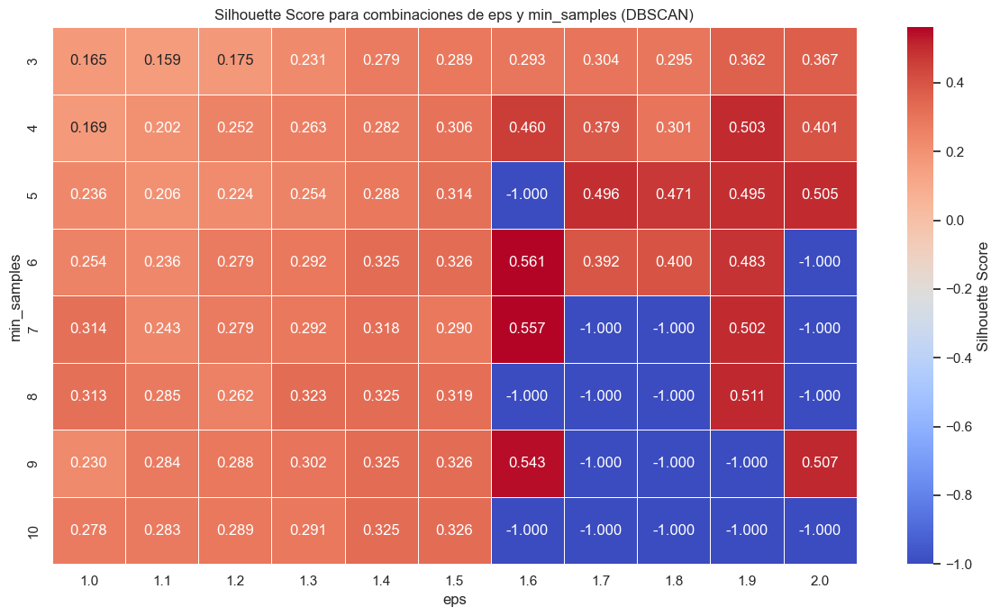

In [125]:
# Giramos ejes en función de las variables
heatmap_data = results_df.pivot(index='min_samples', columns='eps', values='silhouette')

# Graficamos
plt.figure(figsize=(12,7))
sns.heatmap(heatmap_data, annot=True, fmt=".3f", cmap='coolwarm', linewidths=0.5,
            cbar_kws={'label': 'Silhouette Score'})
plt.title('Silhouette Score para combinaciones de eps y min_samples (DBSCAN)')
plt.xlabel('eps')
plt.ylabel('min_samples')
plt.tight_layout()
plt.show()

La opción elegida sería eps=1.6 y min_samples=6 -> Silhoutte Score = 0.561

In [126]:
# Aplicamos nuevamente DBSCAN con la mejor combinación
dbscan_optimo = DBSCAN(eps=1.6, min_samples=6)
clusters_dbscan_optimo = dbscan_optimo.fit_predict(X_clustering)

# Asignamos el resultado al dataset original (machamos la prueba inicial de DBSCAN)
clientes_rfm_e['cluster_dbscan'] = clusters_dbscan_optimo

# Resultados
print("Resumen de número de clientes por cluster (DBSCAN óptimo):")
print(clientes_rfm_e['cluster_dbscan'].value_counts().sort_index())

# Silhouette Score final
silhouette_final = silhouette_score(X_clustering, clusters_dbscan_optimo)
print(f"\nSilhouette Score con parámetros óptimos: {silhouette_final:.4f}")

Resumen de número de clientes por cluster (DBSCAN óptimo):
cluster_dbscan
-1     456
 0    9051
 1       5
Name: count, dtype: int64

Silhouette Score con parámetros óptimos: 0.5611


In [127]:
# Primero, agrupamos las medias escaladas por 'cluster_dbscan'
cluster_summary_dbscan = clientes_rfm_e.groupby('cluster_dbscan').agg(
    num_clientes=('id', 'count'),
    **{f"{var}_scaled_mean": (var, 'mean') for var in vars_extended_full}
).reset_index()

# Segundo, desescalamos cada variable
for var in vars_extended_full:
    mean_var = scaler.mean_[vars_escalar.index(var)]
    std_var = scaler.scale_[vars_escalar.index(var)]
    
    # Creamos la variable desescalada
    cluster_summary_dbscan[f"{var}_medio"] = cluster_summary_dbscan[f"{var}_scaled_mean"] * std_var + mean_var

# Seleccionamos solo las columnas finales de interés
columns_finales_dbscan = ['cluster_dbscan', 'num_clientes'] + [f"{var}_medio" for var in vars_extended_full]
summary_dbscan_extended_full = cluster_summary_dbscan[columns_finales_dbscan]

# Mostramos el resumen
display(summary_dbscan_extended_full)

,cluster_dbscan,num_clientes,recency_medio,frequency_medio,monetary_medio,dias_cliente_medio,consultas_por_dia_medio,dias_entre_compras_medio,media_gasto_medio,n_productos_distintos_medio,n_sectores_distintos_medio,tamano_encoded_medio,antiguedad_encoded_medio
0,-1,456,727.660088,7.892544,1699.100877,147.642544,13.959930,175.556374,421.074861,3.960526,10.247807,2.208333,4.971491
1,0,9051,1092.725003,1.869186,90.397304,97.013811,1.148337,45.138293,46.472894,0.890178,0.843222,3.413435,6.009502
2,1,5,423.600000,4.000000,1373.400000,0.800000,6.455047,188.466667,350.790000,6.200000,18.400000,1.600000,5.000000


- **Cluster -1**: ruido o outliers. **Clientes bastante activos en compras y gasto elevado**. Son clientes intensivos/anómalos que no siguen el patrón mayoritario. Podrían ser muy valiosos.
- **Cluster 0**: mayoría de clientes, la mayoría de datos son muy homogéneos. Gran mayoría de clientes. Alta recency (casi 3 años), pocas compras, bajo gasto. Son **clientes dormidos o inactivos.**
- **Cluster 1:** grupo muy pequeño de clientes, podrían ser atípicos o **VIPs extremos**. Microgrupo de clientes fieles de alto gasto y recency intermedia. Muy interesantes para acciones VIP o personalizadas.

**DBSCAN aparentemente es más eficiente que K-means**, pero **a nivel operativo DBSCAN no parece mejor** que K-means ya que ofrece unos grupos menos segmentados y operativos.

En conclusión, **DBSCAN no genera segmentos útiles para el negocio.** Podría ser útil para detectar clientes especiales o comportamientos raros.

## Alternariva a K-means: SOM (Self Organizing Map)

### Aplicación de SOM sobre el dataset X_clustering

In [128]:
# Definimos dimensiones del SOM (10x10 nodos)
som_grid_rows = 10
som_grid_cols = 10

# Iniciamos el SOM
som = MiniSom(x=som_grid_rows,
              y=som_grid_cols,
              input_len=X_clustering.shape[1],
              sigma=1.0,               # Radio para el tamaño inicial de vecindad.
              learning_rate=0.5,       # Tasa de aprendizaje.
              random_seed=1234)

# Entrenamos SOM
print("Entrenando el SOM...")
som.train_random(data=X_clustering.values, num_iteration=1000)  # Número de iteraciones.
print("Entrenamiento finalizado.")

Entrenando el SOM...
Entrenamiento finalizado.


### Visualizamos SOM: U-Matrix (Univied Distance Matrix)

- Muestra la distancia media entre cada nodo y sus vecinos.
- Permite ver fronteras naturales entre agrupaciones.
- Las zonas claras son para alta distancia (separación), las zonas oscuras baja distancia (grupos similares).

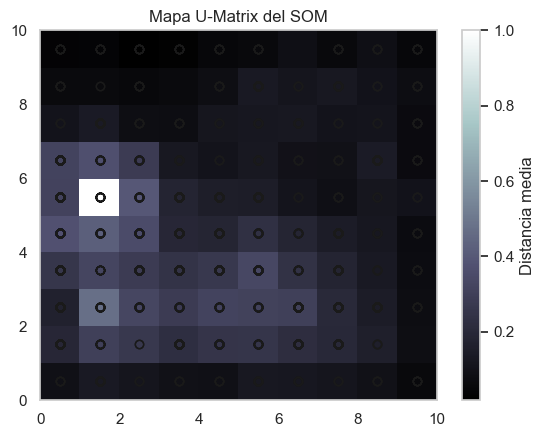

In [129]:
# Activamos una figura básica
bone()

# Graficamos distancia promedio entre nodos (U-Matrix)
pcolor(som.distance_map().T)  # .T para transponer y que quede bien orientado el mapa.

# Añadimos barra de color para interpretar intensidades
colorbar(label='Distancia media')

# Marcamos las posiciones de los clientes (sin etiquetas)
for i, x in enumerate(X_clustering.values):
    w = som.winner(x)  # Coordenadas del "winning node" para cada cliente, proyectado en el nodo ganador correpondiente.
    plot(w[0]+0.5, w[1]+0.5, 'o', markerfacecolor='None', markeredgecolor='k', markersize=6, markeredgewidth=1)

# Graficamos
plt.title("Mapa U-Matrix del SOM")
plt.show()

- Hay grandes zonas oscuras -> grandes clusters de clientes parecidos.
- Zona clara importante en (2, 6) -> frontera fuerte entre al menos 2 grandes clusters.
- El mapa parece sugerir 2 ó 3 grupos principales, aunque no perfectamente separados.

**Conclusión**
- La mayor parte son clientes homogéneos.
- Pocas áreas de ruptura, que son las interesantes para separar.
- Coherente con lo visto en K-means y DBSCAN.

In [130]:
# Asignamos un cluster a cada cliente

# Para cada cliente, encontramos su "Best Matching Unit" (BMU)
# Es decir, el nodo del SOM más cercano al cliente.
bmus = np.array([som.winner(x) for x in X_clustering.values])

# Convertimos los pares de coordenadas (fila, columna) en un solo número de cluster
# Una forma sencilla: convertir las coordenadas en etiquetas únicas
# Ejemplo: nodo (3,5) -> etiqueta "3-5"
cluster_labels_som = np.array([f"{i}-{j}" for i,j in bmus])

# Añadimos las etiquetas de cluster al dataframe original
clientes_rfm_e['cluster_som'] = cluster_labels_som

# Opcional: ver distribución de clientes por nodo
cluster_counts = clientes_rfm_e['cluster_som'].value_counts().sort_index()
display(cluster_counts)

cluster_som
0-0    242
0-1     37
0-2     27
0-3    138
0-4     59
      ... 
9-5    111
9-6     43
9-7     23
9-8     64
9-9     62
Name: count, Length: 97, dtype: int64

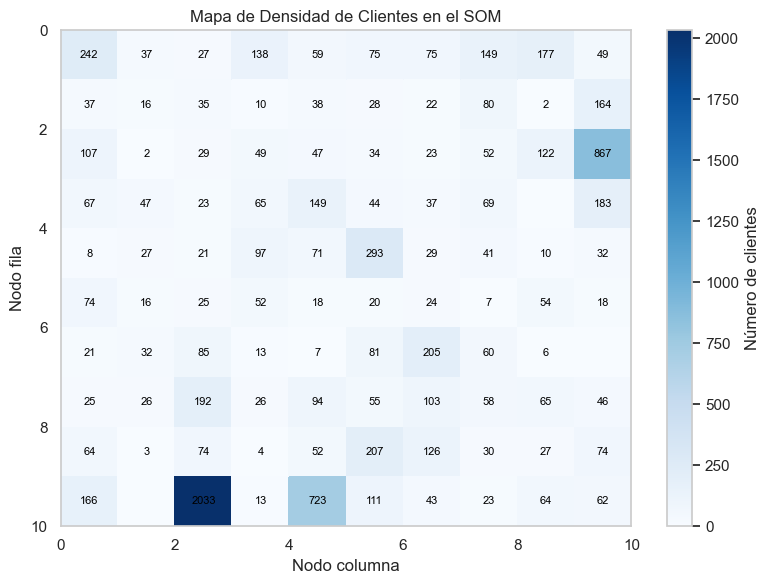

In [131]:
# Mapa de densidades de clientes

# Inicializamos un grid vacío del tamaño del SOM
density_map = np.zeros((som_grid_rows, som_grid_cols))

# Contamos cuántos clientes caen en cada nodo
for i, j in bmus:
    density_map[i, j] += 1

# Visualizamos el mapa de densidad
plt.figure(figsize=(8, 6))
plt.pcolor(density_map, cmap='Blues')  # Cuantos más clientes, más oscuro.
plt.colorbar(label='Número de clientes')
plt.title('Mapa de Densidad de Clientes en el SOM')
plt.xlabel('Nodo columna')
plt.ylabel('Nodo fila')

# Mostramos los valores encima de cada celda
for i in range(density_map.shape[0]):
    for j in range(density_map.shape[1]):
        count = int(density_map[i, j])
        if count > 0:
            plt.text(j + 0.5, i + 0.5, str(count),
                     ha='center', va='center', color='black', fontsize=8)

plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

**Concentración de clientes:**

- Hay una grandísima concentración de clientes en el nodo (fila, columna) -> (10, 2) con 2.033 clientes.
- También hay núcleos importantes en los nodos (10, 5) con 723 clientes y (3, 10) con 867 clientes.
- El resto de los nodos tienen densidades bajas o muy bajas (en torno a 0-300 clientes)

Por tanto:
- **(10,2) es un nodo dominante**, donde la mayoría de los clientes caen en el espacio de características definido por el SOM.
- **Muchos nodos tienen pocos clientes**, lo que puede sugerir:
  * Que el dataset tiene un patrón dominante (muchos clientes parecidos).
  * Que hay pocas agrupaciones diferenciadas de clientes.

### Clustering adicional (K-means) sobre el vector de pesos del SOM

#### Procedimiento a llevar a cabo

1. Cada nodo del SOM guarda un vector de características del mismo tamaño que las variables usadas para el entrenamiento.
2. Estos vectores son el perfil medio que representa a los clientes de ese nodo.
3. Hay que obtener todos los vectores de pesos y aplanarlos para conseguir una matriz, donde cada fila es el perfil de un nodo.

4. Hay que aplicar KMeans sobre esta matriz de modo que cada nodo sea asignado a un cluster, agrupando nodos similares entre sí.
5. Cada cliente ya tiene su BMU (Best Matching Unit), esto es, el nodo al que está asignado en el SOM.
6. Por tanto, hay que buscar el cluster al que pertenece cada nodo BMU y asignar el cliente a ese cluster.

#### Aplicación sobre el SOM con búsqueda del k

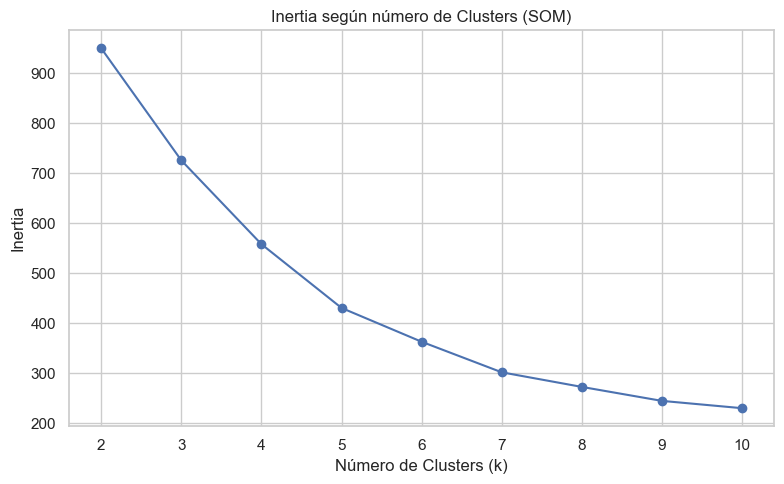

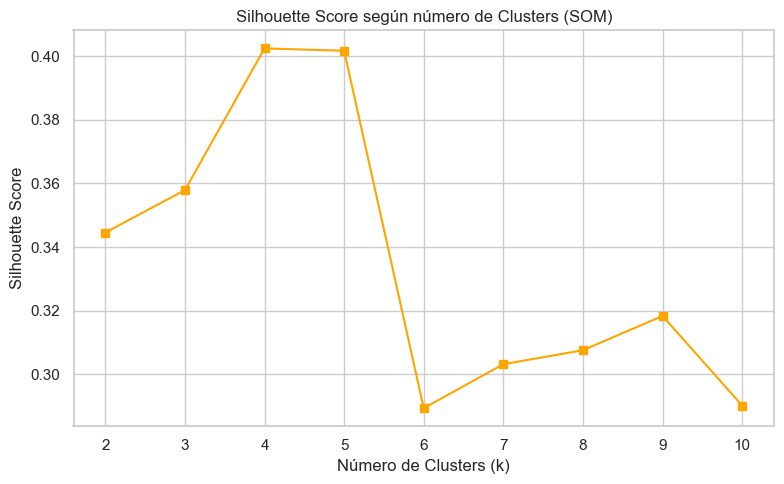

In [132]:
# Obtenemos los vectores de pesos del SOM
weights = som.get_weights()  # Matriz (10, 10, 11) -> 10x10 nodos y 11 variables en cada uno (10x10x11).
weights_flat = weights.reshape(-1, X_clustering.shape[1])  # reshape a (100, 11).

# Definimos rango de k a explorar
k_range = range(2, 11)

# Listas para almacenar resultados
inertia = []
silhouette = []

# Bucle para probar diferentes k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=1234, n_init=10)
    labels = kmeans.fit_predict(weights_flat)  # fit_predict sobre los vectores de pesos (nodos SOM).

    inertia.append(kmeans.inertia_)
    silhouette.append(silhouette_score(weights_flat, labels))

# Gráfico "codo" (Inertia vs k)
plt.figure(figsize=(8,5))
plt.plot(k_range, inertia, marker='o')
plt.title('Inertia según número de Clusters (SOM)')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

# Gráfico Silhouette Score vs k
plt.figure(figsize=(8,5))
plt.plot(k_range, silhouette, marker='s', color='orange')
plt.title('Silhouette Score según número de Clusters (SOM)')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

En principio, el número de clusters aplicables son el 4 y 5.

Para ver cuál de los 2 eligimos vamos a pasar a la parte de negocio y a analizar los resúmenes de información que esos clusters arrojan.

A partir de ahí elegiremos un número de clusters.

In [133]:
# Inicializamos diccionarios para guardar resultados
resumenes_clusters_som = {}
silhouette_scores_som = {}

# Bucle para k=4 y k=5
for k in [4, 5]:
    # Entrenamos KMeans sobre los pesos del SOM
    kmeans_som = KMeans(n_clusters=k, random_state=1234, n_init=10)
    cluster_labels_som = kmeans_som.fit_predict(weights_flat)

    # Asignamos a cada cliente su cluster según su BMU
    cluster_cliente = []
    for idx, row in clientes_rfm_e.iterrows():
        bmu_x = som.winner(X_clustering.values[idx])[0]
        bmu_y = som.winner(X_clustering.values[idx])[1]
        bmu_index = bmu_x * som_grid_cols + bmu_y
        cluster = cluster_labels_som[bmu_index]
        cluster_cliente.append(cluster)
    
    # Guardamos el cluster en una nueva columna (una por k)
    clientes_rfm_e[f'cluster_som_k{k}'] = cluster_cliente

    # Calculamos Silhouette Score
    sil_score = silhouette_score(weights_flat, cluster_labels_som)

    # Calculamos resumen de estadísticas escaladas
    cluster_label = f'cluster_som_k{k}'
    cluster_summary = clientes_rfm_e.groupby(cluster_label).agg(
        num_clientes=('id', 'count'),
        **{f"{var}_scaled_mean": (var, 'mean') for var in vars_extended_full}
    ).reset_index()

    # Desescalamos todas las variables
    for var in vars_extended_full:
        mean_var = scaler.mean_[vars_escalar.index(var)]
        std_var = scaler.scale_[vars_escalar.index(var)]
        cluster_summary[f"{var}_medio"] = cluster_summary[f"{var}_scaled_mean"] * std_var + mean_var

    # Seleccionamos las columnas finales de interés
    columns_finales = [cluster_label, 'num_clientes'] + [f"{var}_medio" for var in vars_extended_full]
    summary = cluster_summary[columns_finales]

    resumenes_clusters_som[k] = summary
    silhouette_scores_som[k] = sil_score

# Mostramos los resúmenes
for k, resumen in resumenes_clusters_som.items():
    print(f"\nResumen para k={k} (Silhouette Score = {silhouette_scores_som[k]:.4f}):\n")
    display(resumen)


Resumen para k=4 (Silhouette Score = 0.4025):



,cluster_som_k4,num_clientes,recency_medio,frequency_medio,monetary_medio,dias_cliente_medio,consultas_por_dia_medio,dias_entre_compras_medio,media_gasto_medio,n_productos_distintos_medio,n_sectores_distintos_medio,tamano_encoded_medio,antiguedad_encoded_medio
0,0,8010,1160.164170,1.627715,71.835081,41.131211,1.072840,19.694273,44.858296,0.742697,0.674782,3.441948,6.021473
1,1,558,702.173835,1.933692,92.279570,1012.139785,1.265508,42.932117,45.240988,1.034050,0.958781,3.476703,6.096774
2,2,603,622.407960,9.112769,1495.459370,40.794362,10.899156,129.380543,338.169498,4.172471,9.510779,2.583748,5.315091
3,3,341,481.363636,2.712610,208.768328,77.909091,2.697391,673.956061,75.995957,2.498534,2.117302,2.469208,5.410557



Resumen para k=5 (Silhouette Score = 0.4017):



,cluster_som_k5,num_clientes,recency_medio,frequency_medio,monetary_medio,dias_cliente_medio,consultas_por_dia_medio,dias_entre_compras_medio,media_gasto_medio,n_productos_distintos_medio,n_sectores_distintos_medio,tamano_encoded_medio,antiguedad_encoded_medio
0,0,406,560.315271,2.674877,191.236453,70.049261,2.579623,625.774672,70.054076,2.396552,1.987685,2.874384,5.665025
1,1,785,597.117197,8.457325,921.415287,37.267516,8.181027,121.504542,204.778999,3.903185,7.626752,2.259873,5.128662
2,2,558,702.173835,1.933692,92.279570,1012.139785,1.265508,42.932117,45.240988,1.034050,0.958781,3.476703,6.096774
3,3,28,429.500000,8.571429,8770.392857,20.785714,37.680575,176.057585,1945.000857,4.928571,14.321429,2.285714,4.428571
4,4,7735,1179.589011,1.485844,64.877440,41.674208,0.977500,14.377688,44.666101,0.664771,0.603361,3.486102,6.054557


* Selecciono k=5 porque permite detectar un segmento pequeño pero muy rentable y, por tanto, aplicarles estrategias personalizadas con mucho beneficio potencial. La idea es explotar la regla de pareto: 20/80.
* Se pierde un poco de simplicidad.

#### Gráficos para k=5 y SOM

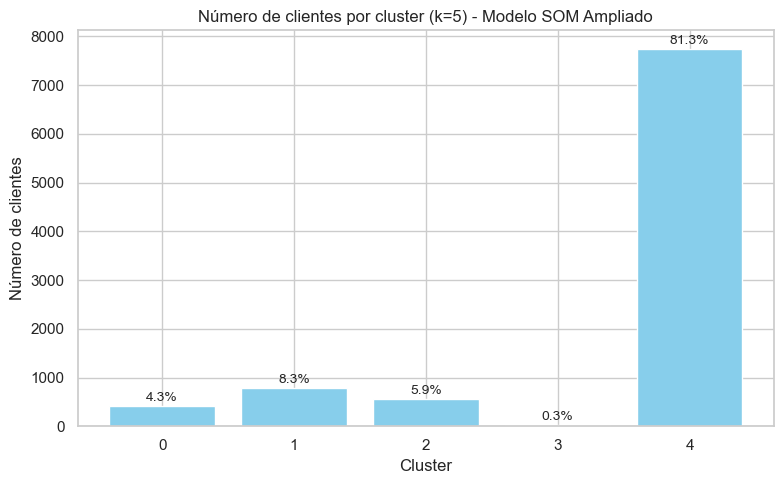

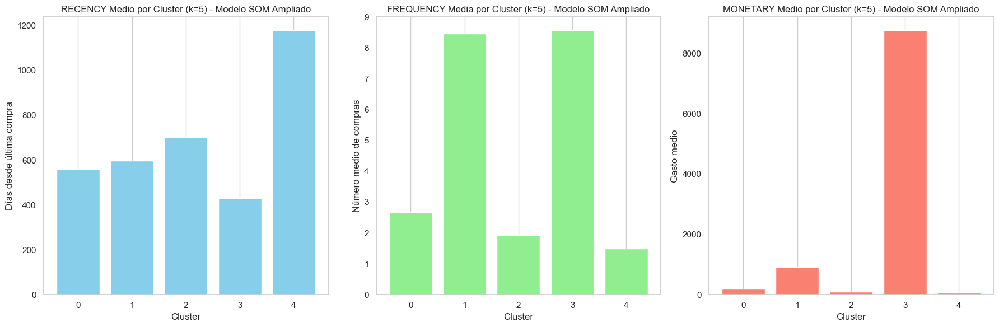

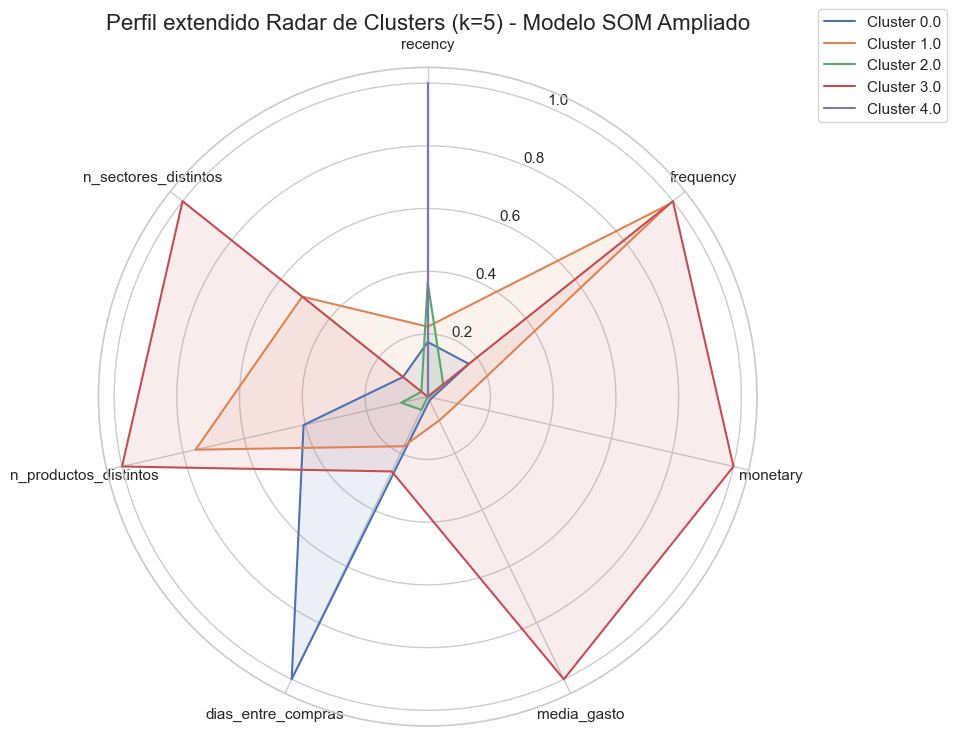

In [134]:
# Este es el resumen que creamos antes
summary_som_k5_extended_full = resumenes_clusters_som[5]

# Calculamos el total de clientes
total_clientes = summary_som_k5_extended_full['num_clientes'].sum()

# Gráfico: Número de clientes por cluster
plt.figure(figsize=(8,5))
bars = plt.bar(summary_som_k5_extended_full['cluster_som_k5'],
               summary_som_k5_extended_full['num_clientes'], color='skyblue')
plt.title('Número de clientes por cluster (k=5) - Modelo SOM Ampliado')
plt.xlabel('Cluster')
plt.ylabel('Número de clientes')
plt.grid(True)

# Añadimos etiquetas de porcentaje sobre cada barra
for bar in bars:
    height = bar.get_height()
    porcentaje = (height / total_clientes) * 100
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + total_clientes * 0.0045,
        f'{porcentaje:.1f}%',
        ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()


# Gráficos separados para Recency, Frequency y Monetary
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Recency
axes[0].bar(summary_som_k5_extended_full['cluster_som_k5'].astype(str),
            summary_som_k5_extended_full['recency_medio'], color='skyblue')
axes[0].set_title('RECENCY Medio por Cluster (k=5) - Modelo SOM Ampliado')
axes[0].set_xlabel('Cluster')
axes[0].set_ylabel('Días desde última compra')
axes[0].grid(axis='y')

# Frequency
axes[1].bar(summary_som_k5_extended_full['cluster_som_k5'].astype(str),
            summary_som_k5_extended_full['frequency_medio'], color='lightgreen')
axes[1].set_title('FREQUENCY Media por Cluster (k=5) - Modelo SOM Ampliado')
axes[1].set_xlabel('Cluster')
axes[1].set_ylabel('Número medio de compras')
axes[1].grid(axis='y')

# Monetary
axes[2].bar(summary_som_k5_extended_full['cluster_som_k5'].astype(str),
            summary_som_k5_extended_full['monetary_medio'], color='salmon')
axes[2].set_title('MONETARY Medio por Cluster (k=5) - Modelo SOM Ampliado')
axes[2].set_xlabel('Cluster')
axes[2].set_ylabel('Gasto medio')
axes[2].grid(axis='y')

plt.tight_layout()
plt.show()



# Variables seleccionadas para el radar plot extendido
features_extended = ['recency_medio',
                     'frequency_medio',
                     'monetary_medio',
                     'media_gasto_medio',
                     'dias_entre_compras_medio',
                     'n_productos_distintos_medio',
                     'n_sectores_distintos_medio']

# Extraer valores
values_extended = summary_som_k5_extended_full[features_extended].values

# Normalizar
scaler_radar_ext = MinMaxScaler()
values_normalized_ext = scaler_radar_ext.fit_transform(values_extended)

# Ángulos para el radar plot
num_vars_ext = len(features_extended)
angles_ext = np.linspace(0, 2 * np.pi, num_vars_ext, endpoint=False).tolist()
angles_ext += angles_ext[:1]  # Para cerrar el círculo

# Radar plot extendido
fig, ax = plt.subplots(figsize=(10,10), subplot_kw=dict(polar=True))

for idx, row in enumerate(values_normalized_ext):
    data = row.tolist()
    data += data[:1]
    ax.plot(angles_ext, data, label=f'Cluster {summary_som_k5_extended_full.iloc[idx]["cluster_som_k5"]}')
    ax.fill(angles_ext, data, alpha=0.1)

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)
ax.set_thetagrids(np.degrees(angles_ext[:-1]), [f.replace('_medio','') for f in features_extended])

plt.title('Perfil extendido Radar de Clusters (k=5) - Modelo SOM Ampliado', size=16)
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.tight_layout()
plt.show()

#### Conclusiones SOM + Kmeans

**Cluster 0. Clientes moderadamente activos (406 clientes)**
* Clientes con actividad aceptable, pero gasto moderado.
* Estrategia recomendada: Incentivar más compras mediante programas de fidelización o bonos de descuento.

**Cluster 1. Clientes activos y de valor medio-alto (785 clientes)**
* Alta frecuencia de compra y gasto notable, además de diversidad de productos.
* Estrategia recomendada: Promover paquetes o bundles y programas de puntos para retenerlos.

**Cluster 2. Clientes antiguos con baja actividad (558 clientes)**
* Clientes muy antiguos, baja frecuencia y gasto limitado.
* Estrategia recomendada: Campañas automatizadas de reactivación, priorizando momentos clave como campañas estacionales.

**Cluster 3. Clientes ultra VIP (28 clientes)**
* Gasto y frecuencia extremadamente altos, son el grupo más valioso aunque pequeño.
* Estrategia recomendada: Atención personalizada: gestor VIP y ofertas exclusivas.

**Cluster 4. Clientes inactivos y de muy bajo valor (7735 clientes)**
* Representan más del 80% de la base, con recency muy alta y gasto mínimo.
* Estrategia recomendada: Automatizar comunicaciones con newsletters y promociones masivas de bajo coste.

En resumen, **priorizaciones por grupo:**
* **Cluster 3. Alta prioridad.** Gestión personalizada.
* **Cluster 1. Media-Alta prioridad.** Programas de retención.
* **Cluster 0. Media prioridad.** Incentivas gasto con descuentos.
* **Cluster 2 y 4. Baja prioridad.** Campañas de reactivación de bajo coste o abandono.

## Comparación entre técnicas

| Técnica          | Nº de Variables | Nº de Clusters | Silhouette Score | Observaciones |
|------------------|------------------|----------------|------------------|---------------|
| KMeans básico    | 3 (R, F, M)       | 6              | 0.5260           | 2 clusters con muy pocos clientes. |
| KMeans ampliado  | 11                | 6              | 0.3758           | Grupos más equilibrados. Grupo Ultra VIP muy rentable. |
| DBSCAN           | 11                | 3 (incluye grupo de ruido) | 0.5610        | Grupos no anómalos muy desbalanceados (95,15% vs. 0,05%). |
| SOM + KMeans     | 11                | 5              | 0.4017           | Grupos operativos comercialmente. 87,2% de clientes de poco valor agrupados. |


## Reducción de dimensionalidad y visualización de los clusters

### PCA

In [135]:
# Creamos una instancia de PCA para reducir a 2 componentes principales
pca = PCA(n_components=2, random_state=1234)

# Ajustamos y transformamos los datos de clustering
X_pca = pca.fit_transform(X_clustering)  # Array de 2 columnas: PC1 y PC2.

In [136]:
# Creamos un nuevo DataFrame para graficar
pca_df = pd.DataFrame({
    'PC1': X_pca[:, 0],
    'PC2': X_pca[:, 1],
    'cluster': clientes_rfm_e['cluster_som_k5']})  # El cluster asignado por SOM + KMeans.

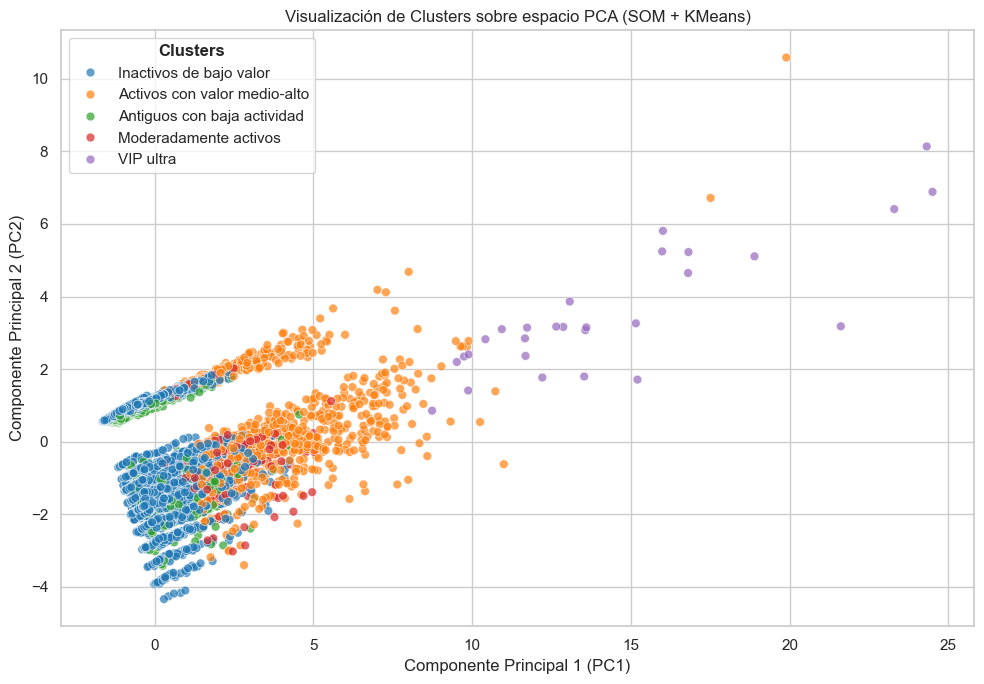

In [137]:
# Diccionario para renombrar los clusters
cluster_labels = {0: 'Moderadamente activos',
                  1: 'Activos con valor medio-alto',
                  2: 'Antiguos con baja actividad',
                  3: 'VIP ultra',
                  4: 'Inactivos de bajo valor'}

# Creamos una nueva columna con las etiquetas
pca_df['cluster_desc'] = pca_df['cluster'].map(cluster_labels)

# Gráfico de dispersión
plt.figure(figsize=(10,7))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='cluster_desc', palette='tab10', s=40, alpha=0.7)

plt.title('Visualización de Clusters sobre espacio PCA (SOM + KMeans)')
plt.xlabel('Componente Principal 1 (PC1)')
plt.ylabel('Componente Principal 2 (PC2)')

# Modificamos su título para ponerlo en negrita
leg = plt.legend(title='Clusters')
leg.get_title().set_fontweight('bold')

plt.grid(True)
plt.tight_layout()
plt.show()

In [138]:
# Varianza explicada
varianza_explicada = pca.explained_variance_ratio_

# Varianza de cada componente
print(f"Varianza explicada por PC1: {varianza_explicada[0]:.4f} ({varianza_explicada[0]*100:.2f}%)")
print(f"Varianza explicada por PC2: {varianza_explicada[1]:.4f} ({varianza_explicada[1]*100:.2f}%)")
print(f"Varianza total explicada (PC1 + PC2): {varianza_explicada.sum():.4f} ({varianza_explicada.sum()*100:.2f}%)")

Varianza explicada por PC1: 0.2981 (29.81%)
Varianza explicada por PC2: 0.1594 (15.94%)
Varianza total explicada (PC1 + PC2): 0.4576 (45.76%)


La varianza conjunta explicada no es muy alta.

Se podría ampliar el número de componentes o emplear otra técnica.

Inicialmente vamos a aplicar PCA sin restringir.

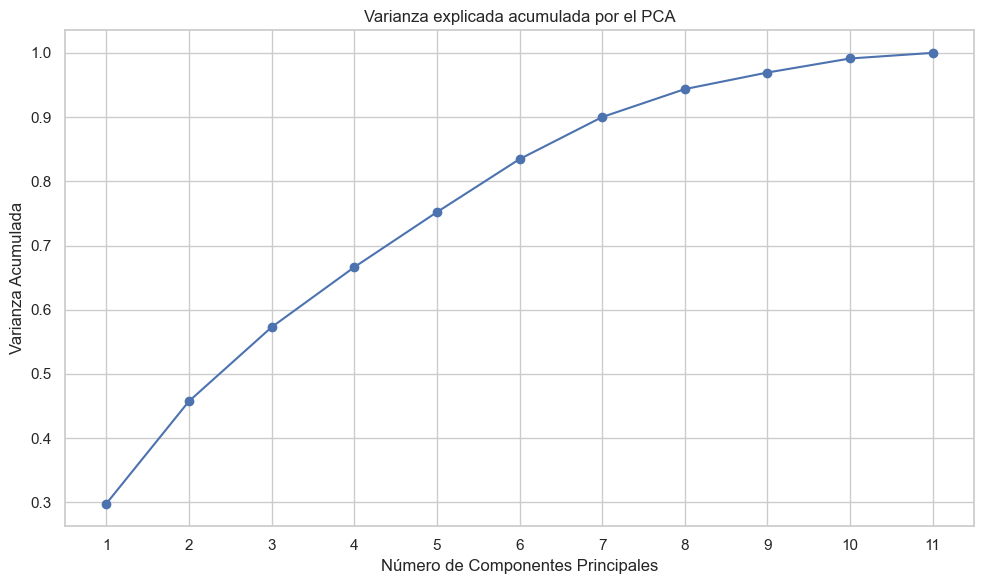

In [139]:
# Ajustamos el PCA sin límite de componentes
pca_full = PCA()
X_pca_full = pca_full.fit_transform(X_clustering)  # X_clustering ya estaba escalado.

# Calculamos la varianza explicada acumulada
varianza_explicada_acumulada = pca_full.explained_variance_ratio_.cumsum()

# Graficamos la varianza acumulada
plt.figure(figsize=(10,6))
plt.plot(range(1, len(varianza_explicada_acumulada) + 1), varianza_explicada_acumulada, marker='o')
plt.title('Varianza explicada acumulada por el PCA')
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Acumulada')
plt.grid(True)
plt.xticks(range(1, len(varianza_explicada_acumulada) + 1))  # Mostramos los números de componentes.
plt.tight_layout()
plt.show()

Vemos que la solución no es el número de componentes ya que la varianza crece prácticamente linealmente.

El problema seguramente tenga que ver con relaciones no lineales entre las variables.

Pasamos a aplicar otro algoritmo.

### UMAP

UMAP (Uniform Manifold Approximation and Projection) es una técnica de reducción de dimensionalidad no lineal.
* Preserva mejor la estructura local y global de los datos que PCA.
* Crea representaciones más separadas y naturales de los clusters ocultos.
* Funciona bien tanto para visualización como para preprocesar antes de clustering.

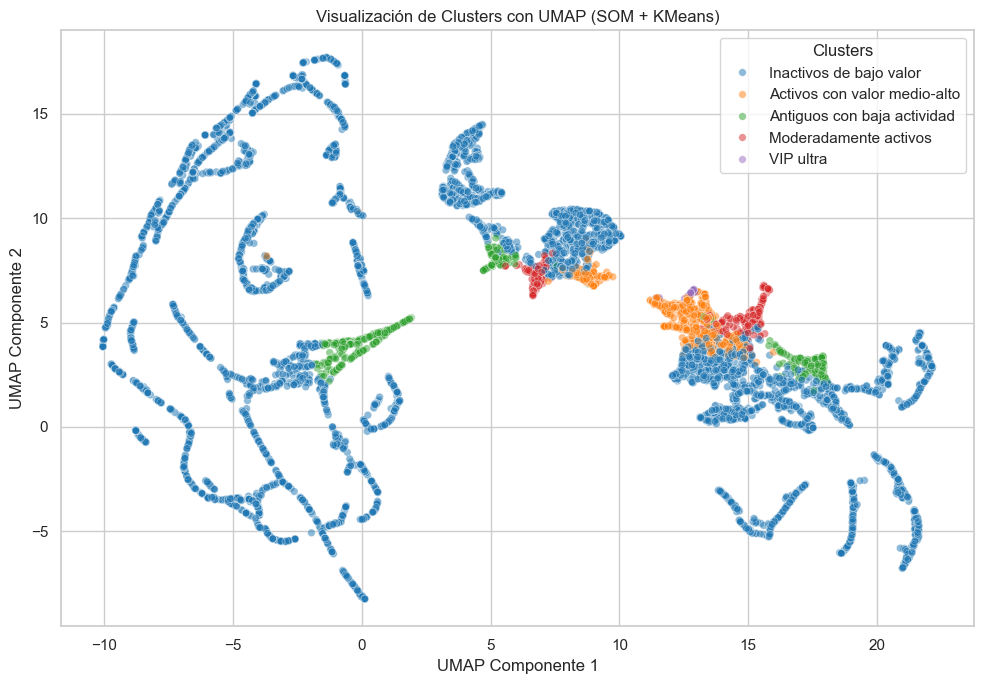

In [140]:
# Instanciamos el modelo
umap_reductor = umap.UMAP(
    n_components=2,    # Visualizar en 2D.
    n_neighbors=15,    # Nº de vecinos a considerar (balance entre estructura local/global).
    min_dist=0.1,      # Distancia mínima entre puntos (compactación de clusters).
    random_state=1234)

# Aplicamos UMAP
X_umap = umap_reductor.fit_transform(X_clustering.values)

# Creamos DataFrame
umap_df = pd.DataFrame({'UMAP1': X_umap[:, 0],
                        'UMAP2': X_umap[:, 1],
                        'cluster': clientes_rfm_e['cluster_som_k5']})

# Creamos una nueva columna con las etiquetas personalizadas
umap_df['cluster_desc'] = umap_df['cluster'].map(cluster_labels)

# Graficamos
plt.figure(figsize=(10,7))
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='cluster_desc', palette='tab10', s=30, alpha=0.5)
plt.title('Visualización de Clusters con UMAP (SOM + KMeans)')
plt.xlabel('UMAP Componente 1')
plt.ylabel('UMAP Componente 2')
plt.legend(title='Clusters', loc='upper right')
plt.grid(True)
plt.tight_layout()
plt.show()

**Aclacración sobre el cluster VIP 🟣**

En el gráfico en 2D el cluster VIP (morado) no se ve demasiado bien.

Lo visualizamos en 3 dimensiones para ver si podemos apreciar mejor la separación.

In [141]:
# UMAP en 3D
umap_3d = umap.UMAP(n_components=3, n_neighbors=15, min_dist=0.1, random_state=1234)
X_umap_3d = umap_3d.fit_transform(X_clustering.values)

# Creamos el DataFrame
umap_df_3d = pd.DataFrame({
    'UMAP1': X_umap_3d[:, 0],
    'UMAP2': X_umap_3d[:, 1],
    'UMAP3': X_umap_3d[:, 2],
    'cluster': clientes_rfm_e['cluster_som_k5']})

# Mapeo de etiquetas de la leyenda
umap_df_3d['cluster_desc'] = umap_df_3d['cluster'].map(cluster_labels)

# Gráfico interactivo con Plotly para poder rotarlo
fig = px.scatter_3d(
    umap_df_3d, 
    x='UMAP1', y='UMAP2', z='UMAP3',
    color='cluster_desc',
    title='Visualización 3D de Clusters con UMAP (SOM + KMeans)',
    labels={'cluster_desc': 'Clusters'},
    opacity=0.5)

# Ajustes de leyenda y ejes
fig.update_layout(
    legend_title_text='Clusters',
    legend=dict(x=0.8, y=0.9),
    scene=dict(xaxis_title='UMAP1', yaxis_title='UMAP2', zaxis_title='UMAP3'))

# Ajuste del tamaño de los puntos
fig.update_traces(marker=dict(size=2))

fig.show()

**Comentarios**

Efectivamente, los puntos 🟣 aparecen moderadamente unidos, pero en 2 regiones separadas.

Esto es algo que tambén ocurre con los clusters de Activos de valor medio-alto y los Moderadamente activos.

En cambio, los Antiguos con baja actividad aparecen 3 regiones diferentes.

* 🟣 VIP. Pocos puntos (grupo poco numeroso), pero algunas zonas bien definidas junto a los Activos de valor medio-alto. **Separación moderada.**
* 🟠 Activos de valor medio-alto. Se agrupan en 2 zonas bien definidas y próximas, aunque separadas. **Separación moderada.**
* 🔴 Moderadamente activos. Se distribuyen en varias regiones entre los Activos de valor medio-alto y los Antiguos con baja actividad. Hay cierto **solapamiento** con los Activos de valor medio-alto.
* 🟢 Antiguos con baja actividad. Hay 3 grupos separados en regiones más aisladas. En parte, **próximos o mezclados** con los clientes Inactivos de bajo valor.
* 🔵 Inactivos de bajo valor. Ocupan la mayor parte del gráfico y están **muy dispersos.**

https://umap-learn.readthedocs.io/en/latest/

https://distill.pub/2016/misread-tsne/

https://scikit-learn.org/stable/modules/generated/sklearn.manifold.trustworthiness.html

### Métricas UMAP

#### Trustworhiness ("confiabilidad")

Mide si y cuánto los vecinos cercanos en el espacio reducido (UMAP en 2D) también eran cercanos en el espacio original.

Permite saber si la proyección ha inventado relaciones que no existían.

El **valor ideal sería cerca de 1**, lo cual impolica que casi no hay errores.**

In [142]:
# Calculamos la métrica de "trustworthiness"
trust = trustworthiness(X_clustering.values, X_umap, n_neighbors=15)
trust

0.9916475403048098

Un valor muy bueno.

#### Continuity ("continuidad")

Mide lo contrario a trustworthiness: verifica si los vecinos cercanos del espacio original siguen siéndolo en la proyección.

Sirve para ver si se pierden relaciones verdaderas al reducir.

**Valor ideal es cerca de 1.**

In [143]:
# Función para calcular continuidad
def continuity(original_data, embedded_data, n_neighbors=15):
    n_samples = original_data.shape[0]

    # Vecinos más cercanos en el espacio original
    knn_orig = NearestNeighbors(n_neighbors=n_neighbors)
    knn_orig.fit(original_data)
    orig_neighbors = knn_orig.kneighbors(return_distance=False)

    # Vecinos más cercanos en el espacio UMAP
    knn_embed = NearestNeighbors(n_neighbors=n_neighbors)
    knn_embed.fit(embedded_data)
    embed_neighbors = knn_embed.kneighbors(return_distance=False)

    continuity_scores = []
    for i in range(n_samples):
        overlap = np.intersect1d(orig_neighbors[i], embed_neighbors[i])
        continuity_i = len(overlap) / n_neighbors
        continuity_scores.append(continuity_i)

    # Promedio general
    continuity_score = np.mean(continuity_scores)
    return continuity_score

# Calculamos la continuidad entre X_clustering (original) y X_umap (UMAP)
continuity_score = continuity(X_clustering.values, X_umap, n_neighbors=15)
continuity_score

0.6038057190916737

Una valor aceptable, pero con pérdida de relaciones de vecindad respecto al espacio original.

Se pierde algo de la estructura de las relaciones más lejanas y mantiene mejor la estructura local.

#### KNN Preservation (preservación de vecinos más cercanos)

Compara los k vecinos más cercanos (K-Nearest Neighbors) en ambos espacios y mide el porcentaje que se mantiene igual.

Sirve para saber cuántos de los vecinos reales siguen siendo vecinos tras reducir.

Valor ideal: 100%.

In [144]:
# Número de vecinos a evaluar
k = 15

# Vecinos en el espacio original
nbrs_orig = NearestNeighbors(n_neighbors=k).fit(X_clustering)
_, indices_orig = nbrs_orig.kneighbors(X_clustering)

# Vecinos en el espacio UMAP
nbrs_umap = NearestNeighbors(n_neighbors=k).fit(X_umap)
_, indices_umap = nbrs_umap.kneighbors(X_umap)

# Cálculo del KNN Preservation
preservation_scores = []

for i in range(len(X_clustering)):
    overlap = np.intersect1d(indices_orig[i], indices_umap[i])
    preservation_scores.append(len(overlap) / k)

knn_preservation_score = np.mean(preservation_scores)
print(f"KNN Preservation Score: {knn_preservation_score:.4f}")

KNN Preservation Score: 0.6279


Es un valor aceptablemente bueno: el 63% de los vecinos originales se mantienen.

---

*Una vez conseguida una separación y visualización razonables pasamos al apartado de los modelos predictivos*

# Modelado predictivo

* Estrategías posibles:
  - Enfoque secuencia. Se pueden segmentar los mismos clientes en 2 momentos temporales. Por ejemplo, un intervalo de un año. Luego, se estudia cómo han cambiado y si han pasado de un cluster a otro. Utilizar esta información para, en el momento actual, saber si es probable que en el futuro cambien de cluster. ¿En qué cluster estarán dentro de 1 año?
  - Enfoque transversal. Se analizan todos los clicentes en un momento del tiempo. Se analizan los clusters que se han logrado (primera parte del trabajo). Luego, se entrena un modelo que asigne probabilidades a cada cliente de estar en un cluster u otro. Los clientes del cluster intermedio que tienen mayores probabilidades (mayor similitud) de haber pertenecido al cluster superior (aunque estén actualmente en el cluster intermedio) serán los candidatos para realizar acciones de up-selling.
*  Se elige la estrategia 2, enfoque transversal, ya que le da más sentido a la estrategia de up-selling como acción empresarial que puede "cambiar" o desplazar a los clientes de un cluster a otro.

## Estudio de posibilidades de Up-selling y Cross-selling

### Light GBM sobre el modelo básico

* Modelo predictivo a partir de **3 variables** (recency, frequency y monetary) y los clusters obtenidos con **K-Means con k=6**.

In [145]:
# Variables explicativas: Solo recency, frequency y monetary.
# Para árboles no se requiere escalar y además facilita la interpretación
X = clientes_rfm[['recency', 'frequency', 'monetary']]

# Target: los 6 clusters del modelo básico
y = clientes_rfm_e['cluster_KM_basico']

In [146]:
# No sería estrictamente necesario porque se va a predecir sobre el mismo dataset.
# División Train-Test (80%-20%)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1234, stratify=y)

In [147]:
# Instanciamos el modelo
modelo_lgbm = LGBMClassifier(
    objective='multiclass',  # Hay 6 clusters.
    num_class=6,
    verbose=-1,
    random_state=1234)

# Entrenamos
modelo_lgbm.fit(X_train, y_train)

LGBMClassifier(num_class=6, objective='multiclass', random_state=1234,
               verbose=-1)

In [148]:
# Guardamos modelo con joblib
joblib.dump(modelo_lgbm, 'modelo_upselling_basico.joblib')

# Cargar modelo
# modelo_upselling_basico = joblib.load('modelo_upselling_basico.joblib')

['modelo_upselling_basico.joblib']

In [149]:
# Seleccionamos los clientes del cluster 1
clientes_cluster1 = clientes_rfm_e[clientes_rfm_e['cluster_KM_basico'] == 1]
X_cluster1 = X.loc[clientes_cluster1.index]  # Variables explicativas de esos clientes

# Predecimos las probabilidades de pertenecer a cada cluster
probs = modelo_lgbm.predict_proba(X_cluster1)  # Cada columna corresponde a la probabilidad de cada cluster.

In [150]:
# Extraemos probabilidad de pertenecer a cluster 3 y cluster 5 (son los de alto valor)
probs_cluster3 = probs[:, 3]
probs_cluster5 = probs[:, 5]

# Creamos un DataFrame con estas probabilidades
clientes_cluster1.loc[:, 'prob_cluster_3'] = probs_cluster3
clientes_cluster1.loc[:, 'prob_cluster_5'] = probs_cluster5

# Definimos candidatos: aquellos con probabilidad > 0.5 en alguno de los dos clusters
clientes_candidatos = clientes_cluster1[
    (clientes_cluster1['prob_cluster_3'] > 0.5) | (clientes_cluster1['prob_cluster_5'] > 0.5)]

print(f"Número de candidatos identificados: {clientes_candidatos.shape[0]}")

Número de candidatos identificados: 0


* No obtenemos candidatos con probabilidades relevantes.
* También hemos probado a sumar probabilidades (cluster 3 + cluster 5), pero la probabilidad sigue siendo muy baja (<1%).

### Light GBM sobre el modelo ampliado

- Vamos a aplicar la **predicción sobre el modelo SOM + KMeans (con k=5)**. Es el modelo que más confianza daba para segmentar los clientes en clusters de negocio operables.
- Vamos a **simplificar los clusters a 2 tipos de clientes: alto valor y bajo valor**.
- Por tanto, necesitamos usar el número de variables ampliadas.

In [151]:
# Simplificamos clusters a 2 grupos: alto y bajo
definir_clusters_bajo_alto = {0: 0, 2: 0, 4: 0, 1: 1, 3: 1}

# Seleccionamos X e y
clientes_prediccion = clientes_rfm.copy()
clientes_prediccion['cluster_som_k5'] = clientes_rfm_e['cluster_som_k5']
clientes_prediccion['valor_cliente'] = clientes_prediccion['cluster_som_k5'].map(definir_clusters_bajo_alto)

X = clientes_prediccion[vars_clustering]
y = clientes_prediccion['valor_cliente']

# Separación Train / Test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1234, stratify=y)

# Entrenamiento del modelo LightGBM
modelo_lgbm = lgb.LGBMClassifier(random_state=1234)

# Combinación de hiperparámetros para buscar
# Si se dan soluciones de esquina habría que definir
# una nueva rejilla para seguir buscando en esa parcela. (se han hecho 2 pasadas)
param_grid = {'num_leaves': [10, 15, 31, 63],
              'max_depth': [-1, 5, 10, 15],  # -1 es sin límite.
              'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5],
              'n_estimators': [50, 100, 200, 500]}

# Instanciamos GridSearchCV
grid_search = GridSearchCV(estimator=modelo_lgbm,
                           param_grid=param_grid,
                           scoring='roc_auc',    # Usamos métrica estandar.
                           cv=10,
                           n_jobs=-1,
                           verbose=2)             # Más información durante el proceso.

In [152]:
# Ajustamos el modelo
grid_search.fit(X_train, y_train)

# Resultados
print("Mejores parámetros encontrados:", grid_search.best_params_)
print(f"Mejor AUC obtenido en train: {grid_search.best_score_:.4f}")

Fitting 10 folds for each of 320 candidates, totalling 3200 fits
Mejores parámetros encontrados: {'learning_rate': 0.3, 'max_depth': -1, 'n_estimators': 50, 'num_leaves': 31}
Mejor AUC obtenido en train: 0.9985


#### Evaluación: Matrix de confusión y Curva ROC


--- Classification Report ---
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      1740
           1       0.93      0.95      0.94       163

    accuracy                           0.99      1903
   macro avg       0.96      0.97      0.97      1903
weighted avg       0.99      0.99      0.99      1903


--- Confusion Matrix ---


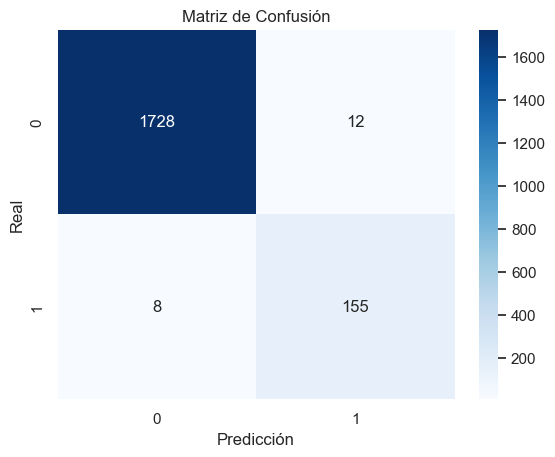

AUC score: 0.9988


In [153]:
# Predicciones (sobre test)
y_pred = grid_search.best_estimator_.predict(X_test)
y_pred_proba = grid_search.best_estimator_.predict_proba(X_test)[:, 1]


# Métricas de evaluación (solo sobre test)
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred))
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()

auc_lgbm = roc_auc_score(y_test, y_pred_proba)
print(f"AUC score: {auc_lgbm:.4f}")

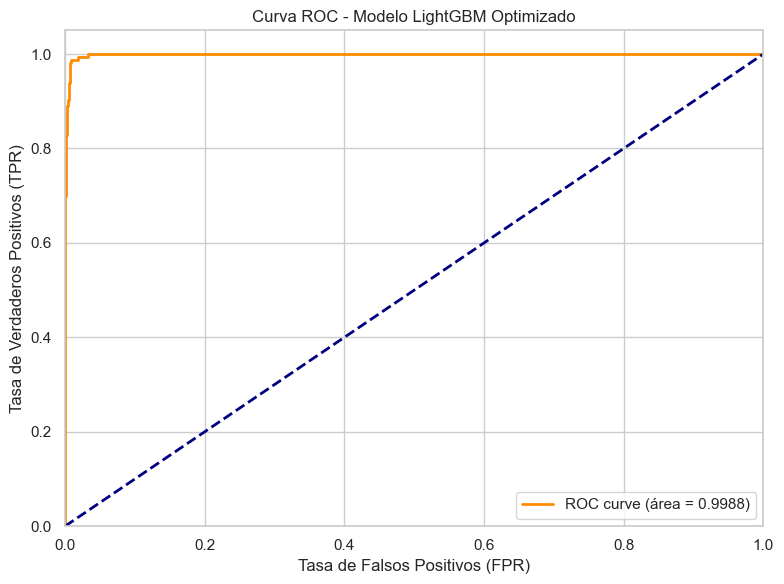

In [154]:
# Calculamos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc_val = auc(fpr, tpr)

# Graficamos la curva ROC
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (área = {roc_auc_val:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Referencia de Línea diagonal.
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC - Modelo LightGBM Optimizado')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

**Selección de clientes (probabilidad >= 50%)**

In [155]:
# Aplicación a TODOS los clientes bajo valor
# Seleccionamos CLIENTES DE BAJO VALOR ACTUALMENTE
clientes_bajo_valor = clientes_prediccion[clientes_prediccion['valor_cliente'] == 0].copy()

# Calculamos probabilidades de ser de alto valor (clientes de bajo valor)
probs_bajo_valor = grid_search.best_estimator_.predict_proba(clientes_bajo_valor[X.columns])[:, 1]
clientes_bajo_valor['probabilidad_alto_valor'] = probs_bajo_valor

# Ordenamos por mayor probabilidad
clientes_bajo_valor_ord = clientes_bajo_valor.sort_values(by='probabilidad_alto_valor', ascending=False)

# Aplicamos un umbral (probabilidad >= u (=0.5))
# Inicialmente se fijó un umbral=0.7, pero dado que se obtenían pocos resultados
# hemos ampliado el umbral hasta 0.5, es decir, igual o más probable que sea de alto valor
# que de bajo valor, según el modelo light GBM.
u = 0.5
clientes_candidatos_final = clientes_bajo_valor_ord[clientes_bajo_valor_ord['probabilidad_alto_valor'] >= u]

# Comprobamos los 20 primeros (solo hay 12)
clientes_candidatos_final[['id', 'probabilidad_alto_valor', 'cluster_som_k5']].head(20)

,id,probabilidad_alto_valor,cluster_som_k5
4162,8765686,0.998855,0
3156,8198496,0.998396,4
7573,9358978,0.990640,0
5599,9504034,0.989062,0
8499,8569148,0.982953,4
1965,7443460,0.946167,4
9197,8396960,0.942108,0
4466,9001861,0.894703,4
722,6720035,0.887673,4
5128,9160289,0.842416,4


#### Búsqueda de "umbral" (threshold) óptimo para la predicción optima en la curva ROC

Lo podemos buscar con el índice de Youden: J = Sensibilidad + Especifidad - 1. TPR (True Positive Rate) - FPR (False Positive Rate).

Es decir, el punto óptimo es donde (TPR + (1 - FPR)) es máximo.

Es la distancia vertical máxima entre la curva ROC y la línea diagonal.

https://www.ibm.com/docs/es/spss-statistics/30.0.0?topic=schemes-area-under-curve

Mejor threshold encontrado: 0.2423


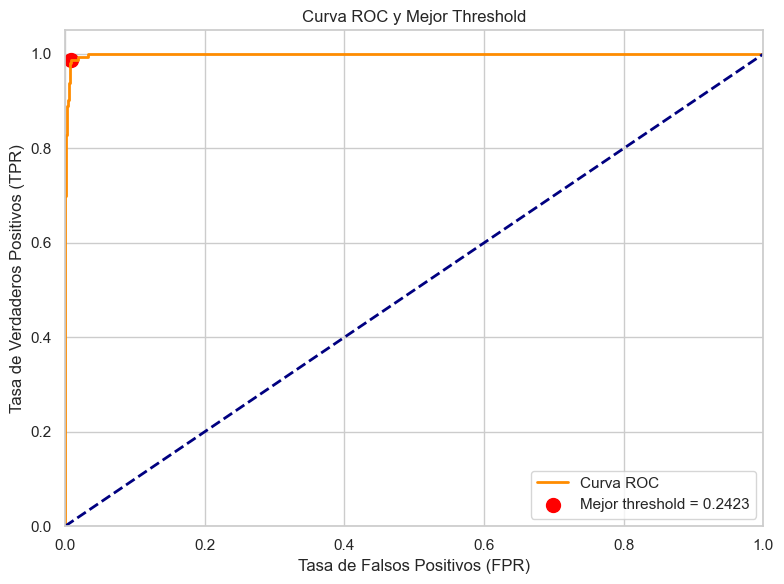

In [156]:
# Volvemos a calcular FPR, TPR y thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculamos el índice de Youden para cada threshold
youden_index = tpr - fpr

# Buscamos el índice donde Youden Index es máximo
best_idx = np.argmax(youden_index)
best_threshold = thresholds[best_idx]

# Mejor TPR asociado al threshold
tpr_best = tpr[np.argmax(tpr - fpr)]

print(f"Mejor threshold encontrado: {best_threshold:.4f}")

# Para visualizarlo:
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.scatter(fpr[best_idx], tpr[best_idx], color='red', label=f'Mejor threshold = {best_threshold:.4f}', s=100)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC y Mejor Threshold')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

Por tanto, a partir de este valor clasificamos a un cliente como positivo.

In [157]:
# Aplicamos un umbral (probabilidad >= u (tpr_best))
u = tpr_best
clientes_candidatos_final = clientes_bajo_valor_ord[clientes_bajo_valor_ord['probabilidad_alto_valor'] >= u]

# Comprobamos los 20 primeros
clientes_candidatos_final[['id', 'probabilidad_alto_valor', 'cluster_som_k5']].head(20)

,id,probabilidad_alto_valor,cluster_som_k5
4162,8765686,0.998855,0
3156,8198496,0.998396,4
7573,9358978,0.990640,0
5599,9504034,0.989062,0


Ahora obtenemos solo 4 clientes a los que dirigir las campañas de up-selling y cross-selling.

Esto supone:
* Menos clientes a los que poder dirigir las ofertas para hacerles "upgrade", por tanto, menos ingresos posibles esperados.
* También supone la posibilidad de enfocar mejor las campañas de marketing y menos derroche de dinero.

Estrategias para estos clientes:

**Up-selling** (venta de un poroducto de mayor precio):
* **Oferta Exclusiva**. Se ofrece a estos clientes un descuento por tiempo limitado para adquirir la versión premium ("cara") que suelen consumir, destacando los beneficios adicionales principales.
* **Paquetes "Premium" pre-configurados**. Crear paquetes que incluyan el producto/servicio base más popular en este cluster junto con características o servicios adicionales de valor añadido, a un precio total mayor pero con una percepción de "mejor oferta", es decir, con un descuento o condiciones ventajosas de financiación o pago, por ejemplo.

**Cross-selling** (venta de productos complementarios):
* **Combos inteligentes**. Agrupar el producto que suelen comprar con 1-2 productos complementarios relevantes y ofrecer el paquete con un pequeño descuento o beneficio (ej. envío gratis).
* **Recomendaciones personalizadas post-compra**. Tras una compra, enviar comunicaciones (email, notificación app) sugiriendo productos específicos que complementen lo recién adquirido, basándose en patrones de compra de clientes de gasto alto.

In [158]:
# Guardamos modelo y threshold
modelo_y_threshold = {'modelo': grid_search.best_estimator_,
                      'threshold_optimo': best_threshold}

# Guardamos el diccionario en un archivo
joblib.dump(modelo_y_threshold, 'modelo_upselling_11.joblib')

['modelo_upselling_11.joblib']

#### Importancia de las variables

En esta última etapa explicativa y para comprender el modelo mostramos qué variables tiene en cuenta el modelo y en qué grado para realizar la asignación de clientes.

"feature_importances_" se utiliza por modelos de árboles de decisión y sus derivados. Calcula la importancia de cada variable basada en cómo contribuye a mejorar el modelo durante el entrenamiento.

El cálculo de la importancia de una variable se basa en la reducción de impureza (índice de Gini o entropía) que cada variable genera en los nodos donde se usa para dividir:
* Cada vez que un árbol divide un nodo usando una variable, se mide cuánto mejora (reduce) la impureza en ese nodo.
  - En clasificación, esta impureza suele ser el índice de Gini o la entropía.
  - En regresión, es el error cuadrático medio (MSE).
* Se suman todas las reducciones de impureza en las que participa cada variable a lo largo de todos los árboles del modelo.
* Se suelen normalizar los valores para que la suma total de importancias sea 100%.

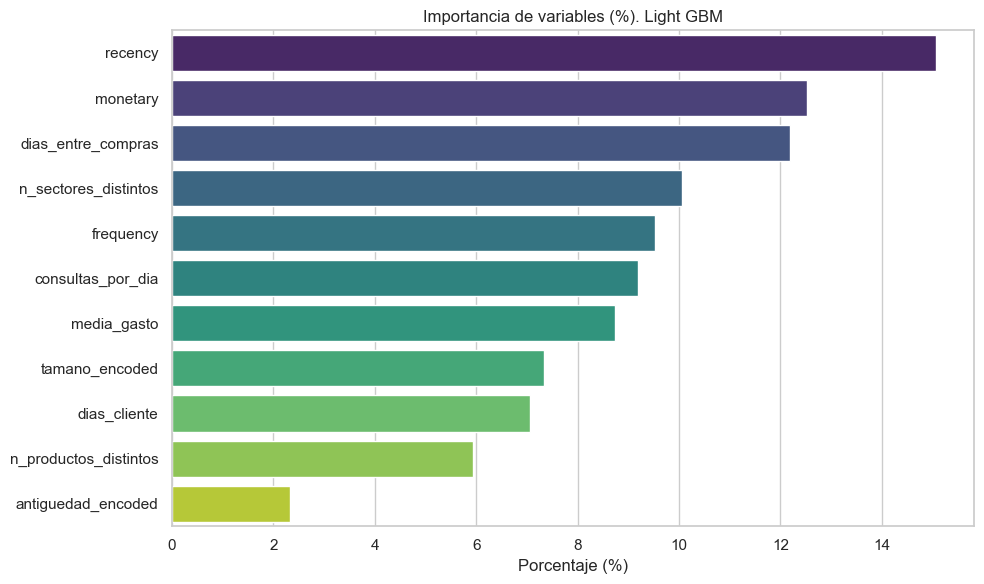

In [159]:
# Importancia de las variables
importances = grid_search.best_estimator_.feature_importances_
features = X.columns

# Normalizamos valores de importancia sobre 100
importances_norm = 100 * importances / importances.sum()

# Creamos un DataFrame para las importancias normalizadas
feat_importance_df = pd.DataFrame({'feature': features, 'importance': importances_norm})
feat_importance_df = feat_importance_df.sort_values(by='importance', ascending=False)

# Graficamos
plt.figure(figsize=(10,6))
sns.barplot(x='importance', y='feature', data=feat_importance_df, palette='viridis', hue='feature')
plt.title('Importancia de variables (%). Light GBM')
plt.xlabel('Porcentaje (%)')
plt.ylabel('')
plt.tight_layout()
plt.show()

- Observamos que la variable menos relevante es la antiguedad del cliente.
- En cambio, R y M están en los primeros 3 posiciones, junto a 'dias_entre_compras'.
- frequency, es importante pero solo aparece en la mitad del gráfico.

##### Árbol de decisión

In [160]:
# Instanciamos un árbol de decisión simple (3 niveles) a efectos explicativos
modelo_arbol_explicativo = DecisionTreeClassifier(
    max_depth=3,       # 3 Nivles solamente.
    random_state=1234,
    class_weight='balanced')  # Corregir posibles desbalances.

# Entrenamos el árbol
modelo_arbol_explicativo.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=3, random_state=1234)

In [161]:
# # Copiamos el modelo para no alterar el modelo el original
# modelo_arbol_explicativo_desescalado = copy.deepcopy(modelo_arbol_explicativo)

# # Mapeamos nombres y posiciones de las variables, a través de un diccionario {nombre_variable: índice}
# indices_vars = {var: scaler.feature_names_in_.tolist().index(var) for var in X_train.columns}

# # Para cada nodo del árbol vamos desescalando los umbrales
# for i, feature_idx in enumerate(modelo_arbol_explicativo_desescalado.tree_.feature):
#     if feature_idx == -2:
#         continue  # Nodo hoja, no hay umbral.

#     feature_name = modelo_arbol_explicativo_desescalado.feature_names_in_[feature_idx]
    
#     if feature_name in indices_vars:
#         idx = indices_vars[feature_name]
#         modelo_arbol_explicativo_desescalado.tree_.threshold[i] = (
#             modelo_arbol_explicativo_desescalado.tree_.threshold[i] * scaler.scale_[idx] + scaler.mean_[idx])

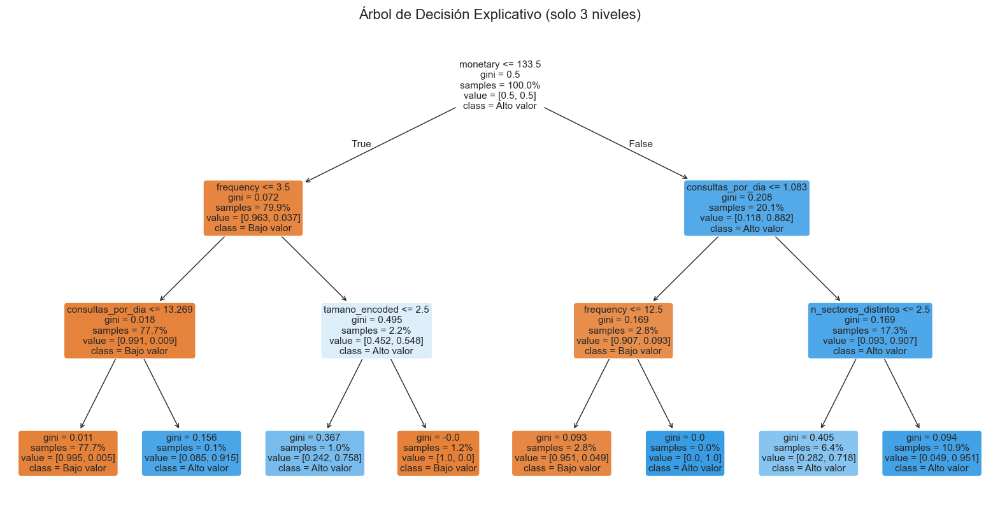

In [162]:
# Gráfico
# Tamaño del gráfico
plt.figure(figsize=(20, 10))

# Graficamos
plot_tree(modelo_arbol_explicativo,
          feature_names=X_train.columns,
          class_names=['Bajo valor', 'Alto valor'],
          filled=True,  # Colorear los nodos según la clase.
          rounded=True,  # Bordes redondeados.
          proportion=True,  # Mostrar porcentajes.
          fontsize=11)  # Tamaño letras.

plt.title('Árbol de Decisión Explicativo (solo 3 niveles)', fontsize=16)
plt.show()

* En el primer nivel se mira "monetary". si es menor o igual a 133.5 el cliente es de "bajo valor". Si es mayor a 133.5 ((20.1%) de todos los clientes), tiende a ser de "alto valor".
* En el segundo nivel, para clientes de alto valor (rama derecha), si las consultas por día son inferiores a 1.083, los clientes tienden a ser de bajo valor; en caso contrario son de alto valor (17,3% del total de clientes).
* La interpretación del resto es igual.

Gastar más de 133.5 + consultar con cierta frecuencia + pertenecer a varios sectores distintos --> Aumenta las probabilidades de ser cliente de "alto valor".

## Estudio cliente recurrente: tipo_cliente_fiel

El cliente fiel es el que compra habitualmente (más de 2 veces en días distintos). Es un cliente **recurrente**.

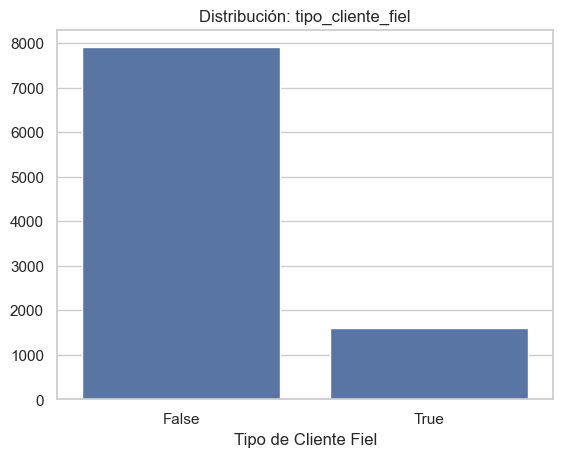

In [163]:
# Gráfico rápido para ver la proporción de True/False en la variable objetivo
total = len(clientes_rfm_e)
conteo = clientes_rfm_e['tipo_cliente_fiel'].value_counts()
porcentajes = (conteo / total * 100).round(2)

# Gráfico seaborn
sns.countplot(data=clientes_rfm_e, x='tipo_cliente_fiel')

# Título y ejes
plt.title('Distribución: tipo_cliente_fiel')
plt.xlabel('Tipo de Cliente Fiel')
plt.ylabel('')

# Mostrar el gráfico
plt.show()

Hay desproporción, por tanto, hay que estratificar la variable target.

### Modelo Light GBM ampliado (11 variables)

In [164]:
# Definimos X e y (target)
X = clientes_rfm[vars_clustering]
y = clientes_rfm['tipo_cliente_fiel']

# Train y test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1234, stratify=y)

# Rejilla de hiperparámetros
param_grid = {'num_leaves': [15, 31, 63],
              'max_depth': [-1, 5, 10],
              'learning_rate': [0.01, 0.1, 0.2],
              'n_estimators': [100, 200, 500]}

In [165]:
# Instanciamos el modelo
modelo_rec_11 = lgb.LGBMClassifier(random_state=1234)

# Instanciamos GridSearchCV
grid_search = GridSearchCV(estimator=modelo_rec_11,
                           param_grid=param_grid,
                           scoring='roc_auc',
                           cv=10,
                           n_jobs=-1,
                           verbose=2)

# Entrenamos
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 81 candidates, totalling 810 fits


GridSearchCV(cv=10, estimator=LGBMClassifier(random_state=1234), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [-1, 5, 10],
                         'n_estimators': [100, 200, 500],
                         'num_leaves': [15, 31, 63]},
             scoring='roc_auc', verbose=2)

In [166]:
# Evaluación del mejor modelo encontrado

# Predicciones sobre el conjunto de test
best_model_rec_11 = grid_search.best_estimator_
y_pred = best_model_rec_11.predict(X_test)
y_pred_proba = best_model_rec_11.predict_proba(X_test)[:, 1]

# Reporte de clasificación
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred))


--- Classification Report ---
              precision    recall  f1-score   support

       False       1.00      1.00      1.00      1582
        True       1.00      1.00      1.00       321

    accuracy                           1.00      1903
   macro avg       1.00      1.00      1.00      1903
weighted avg       1.00      1.00      1.00      1903



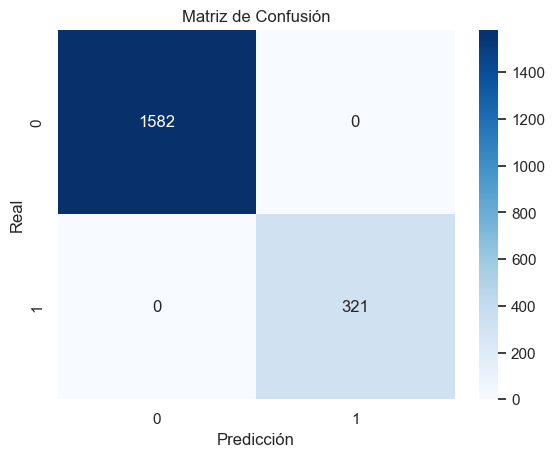

AUC score: 1.0000


In [167]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')  # Valores en formato de entero.
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()

# AUC score
auc = roc_auc_score(y_test, y_pred_proba)
print(f"AUC score: {auc:.4f}")

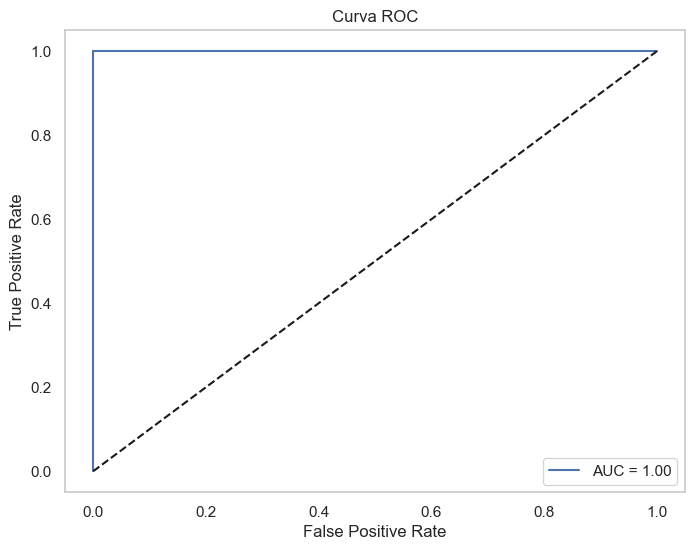

In [168]:
# Calculamos la curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Graficamos
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.grid()
plt.show()

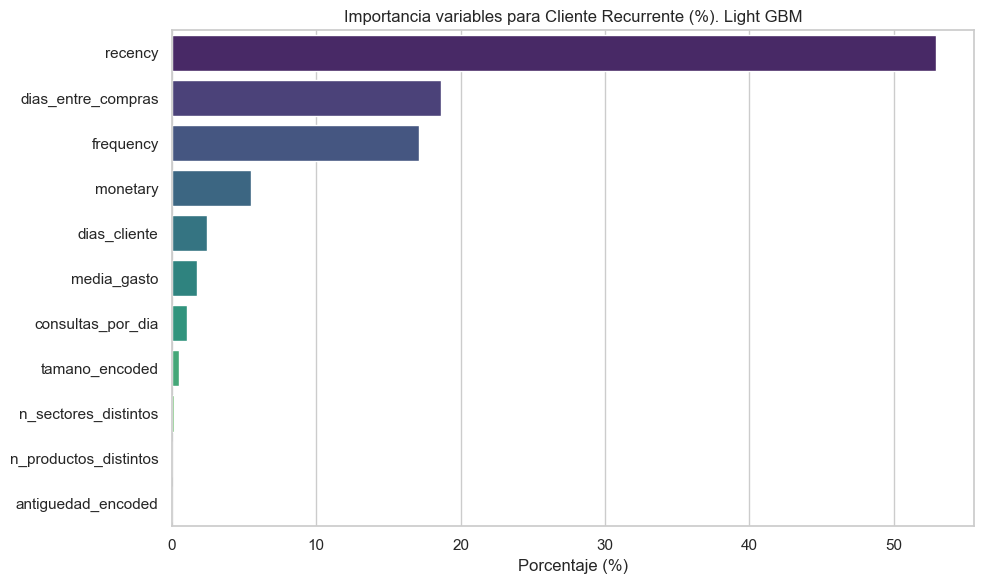

In [169]:
# Importancia de las variables
importances = best_model_rec_11.feature_importances_
features = X.columns

# Normalizamos valores de importancia sobre 100
importances_norm = 100 * importances / importances.sum()

# Creamos un DataFrame para las importancias normalizadas
feat_importance_df = pd.DataFrame({'feature': features, 'importance': importances_norm})
feat_importance_df = feat_importance_df.sort_values(by='importance', ascending=False)

# Graficamos
plt.figure(figsize=(10,6))
sns.barplot(x='importance', y='feature', data=feat_importance_df, palette='viridis', hue='feature')
plt.title('Importancia variables para Cliente Recurrente (%). Light GBM')
plt.xlabel('Porcentaje (%)')
plt.ylabel('')
plt.tight_layout()
plt.show()

Vemos que este modelo clasifica todos los casos perfectamente, por lo que no habría acciones que tomar.

Sin embargo, es debido a un error de construcción ya que le estamos pasando al modelo información que no va a estar disponible en el momento en el que el negocio la requiera para tomar decisiones: recency, frequency, etc.

Es decir, si queremos saber si un cliente va a ser recurrente **no podemos utilizar el historial ya conocido del cliente**. Hay que utilizar datos previos para poder construir el modelo que prediga si el cliente será recurrente o no. Por ejemplo, datos sobre las consultas del cliente, sus características, ubicación, etc.

### Modelo recurrencia del cliente: variables alternativas (Light GBM)

Seleccionamos las variables que son:
* Características del cliente (potencial)
* Acciones que realiza el cliente antes de comprar y convertirse en cliente.

* Se han simplificado las variables disponibles categóricas ya que había demasiadas.
* Se ha simplificado tomando las categorías más numerosas, como en el caso del departamento (BOGOTA y NO APLICA vs. resto) o según la lógica que guardan, como en el caso de estado (ACTIVA y VIVA vs. resto).

In [170]:
# Clonamos el dataset original para no modificarlo
clientes_recurrencia = clientes_rfm.copy()

In [171]:
# Calculamos los días desde la fecha de registro hasta la última fecha disponible:
# días desde que se se registró.
fecha_maxima = clientes_recurrencia['fecha_registro'].max()
clientes_recurrencia['dias_desde_registro'] = (fecha_maxima - clientes_recurrencia['fecha_registro']).dt.days

In [172]:
# Añadimos la variable onehot "estado_VIVA".
# Utilizaremos solo las variables VIVA y ACTIVA. La categoría ausente
# incluye todas las demás.
clientes_recurrencia['estado_VIVA'] = 1 - clientes_recurrencia[[
    'estado_ACTIVA', 'estado_INACTIVA', 'estado_INSOLVENTE', 'estado_EXTINGUIDA']].sum(axis=1)

In [173]:
# Variable sector para categoría 9: sector_9
clientes_recurrencia['sector_9'] = 1 - clientes_recurrencia[[
    'sector_A',
    'sector_B',
    'sector_C',
    'sector_D',
    'sector_E',
    'sector_F',
    'sector_G',
    'sector_H',
    'sector_I',
    'sector_J',
    'sector_K',
    'sector_L',
    'sector_M',
    'sector_N',
    'sector_O',
    'sector_P',
    'sector_Q',
    'sector_R',
    'sector_S',
    'sector_T',
    'sector_U',
    'sector_Z'
    ]].sum(axis=1)

In [174]:
# Variables finales que vamos a usar
vars_recurrencia = ['tamano_encoded',
                    'antiguedad_encoded',
                    'canal_registro_SEM',
                    'canal_registro_WEB',
                    'dias_desde_registro',
                    'consumos_total',
                    'empresas_unicas_consult',
                    'dias_distintos_consulta',
                    'n_productos_distintos',
                    'n_tamanos_distintos',
                    'n_sectores_distintos',
                    'dias_consulta',
                    'consultas_por_dia',
                    'forma_juridica_PERSONA FISICA',
                    'forma_juridica_SOCIEDAD',
                    'forma_juridica_EMPRESARIO',
                    'estado_ACTIVA',
                    'estado_INACTIVA',
                    'departamento_BOGOTA',
                    'departamento_NO APLICA',
                    'sector_9']

In [175]:
# Variables X e y para el modelo
X_recurrencia = clientes_recurrencia[vars_recurrencia]
y_recurrencia = clientes_recurrencia['tipo_cliente_fiel']

print(f"X_recurrencia shape: {X_recurrencia.shape}")
print(f"y_recurrencia shape: {y_recurrencia.shape}")

X_recurrencia shape: (9512, 21)
y_recurrencia shape: (9512,)


In [176]:
# Separación en Train/Test
X_train, X_test, y_train, y_test = train_test_split(
    X_recurrencia, y_recurrencia,
    test_size=0.2,
    random_state=1234,
    stratify=y_recurrencia)

# Configuración de GridSearchCV para LightGBM

# Definimos el modelo
modelo_recurrencia = lgb.LGBMClassifier(random_state=1234)

# Definimos la rejilla de parámetros
param_grid = {'num_leaves': [10, 15, 31, 63],
              'max_depth': [-1, 5, 10],
              'learning_rate': [0.05, 0.01, 0.05, 0.1],
              'n_estimators': [50, 100, 200, 500]}

# Configuramos GridSearchCV
grid_search = GridSearchCV(estimator=modelo_recurrencia,
                           param_grid=param_grid,
                           scoring='roc_auc',
                           cv=10,
                           n_jobs=-1,
                           verbose=2)

In [177]:
# Entrenamos del modelo
grid_search.fit(X_train, y_train)

print(f"\nMejores parámetros encontrados: {grid_search.best_params_}")
print(f"Mejor AUC obtenido (validación cruzada): {grid_search.best_score_:.4f}")

Fitting 10 folds for each of 192 candidates, totalling 1920 fits

Mejores parámetros encontrados: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 100, 'num_leaves': 15}
Mejor AUC obtenido (validación cruzada): 0.9630


#### Evaluación: Matriz de confusión y Curva ROC

In [178]:
# Evaluación sobre test

# Usamos el mejor modelo encontrado
modelo_lgbm_opt = grid_search.best_estimator_

# Predicciones
y_pred = modelo_lgbm_opt.predict(X_test)
y_pred_proba = modelo_lgbm_opt.predict_proba(X_test)[:, 1]

# Métricas de evaluación
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred))


--- Classification Report ---
              precision    recall  f1-score   support

       False       0.91      0.98      0.95      1582
        True       0.86      0.55      0.67       321

    accuracy                           0.91      1903
   macro avg       0.89      0.76      0.81      1903
weighted avg       0.91      0.91      0.90      1903



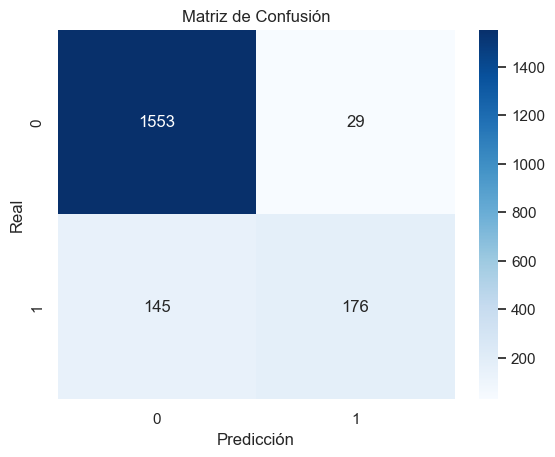

In [179]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()

Vemos que la precision de True, es decir, detección de consumidores que se van a convertir en clientes recurrentes, es más baja (0.86) que la detección de los que no (0.91).

Algo más marcado ocurre con **recall (0.55)**. Y esto es relevante si nos interesa detectar la clase menos frecuente (clientes que se convertirán en recurrentes). El modelo es bastante peor de lo que parecen indicar datos como la AUC (ver a continuación) y los datos combinados o la simple accuracy.

In [180]:
# Puntuación AUC
auc_score = roc_auc_score(y_test, y_pred_proba)
print(f"AUC score en test: {auc_score:.4f}")

AUC score en test: 0.9626


Obtenemos un muy buen valor de AUC (por encima de 0.95).

La Curva ROC obtenida (a continuación) tiene un formato habitual y regular (a diferencia del caso anterior).

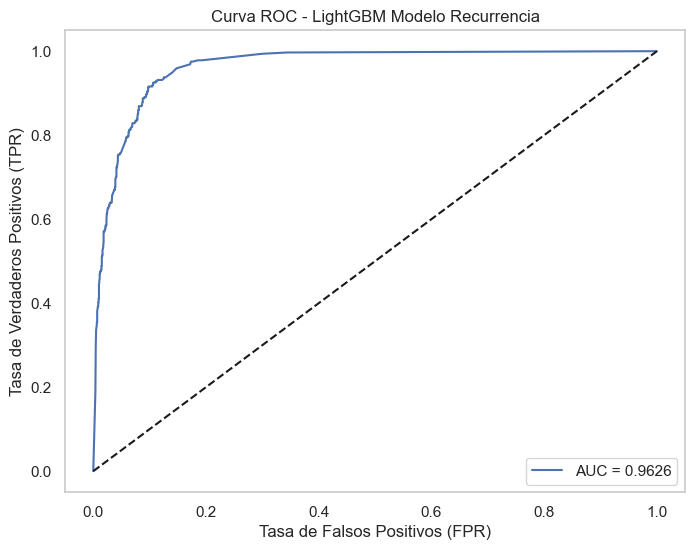

In [181]:
# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.4f}')
plt.plot([0,1], [0,1], 'k--')
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC - LightGBM Modelo Recurrencia')
plt.legend(loc='lower right')
plt.grid()
plt.show()

#### Umbral óptimo según Índice de Youden

Mejor threshold encontrado: 0.2294


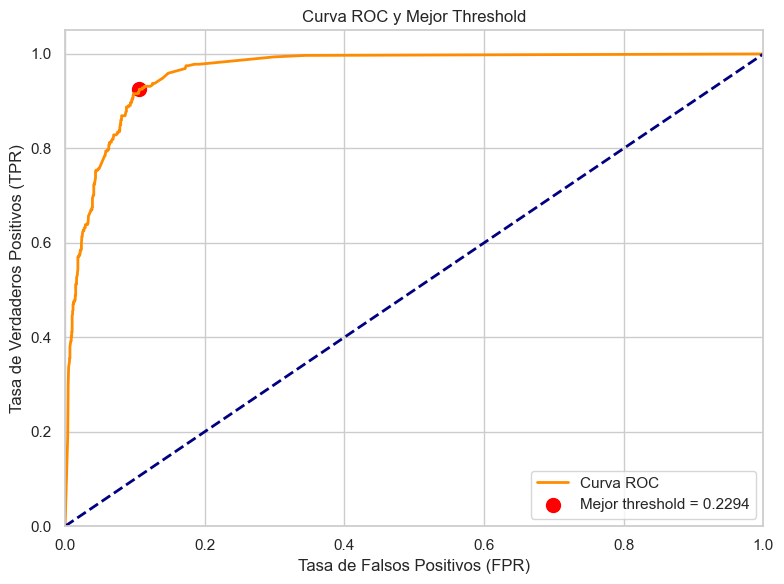

In [182]:
# Calculamos FPR, TPR y thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculamos el índice de Youden para cada threshold
youden_index = tpr - fpr

# Buscamos el índice donde Youden Index es máximo
best_idx = np.argmax(youden_index)
best_threshold = thresholds[best_idx]

# Mejor TPR asociado al threshold
tpr_best = tpr[np.argmax(tpr - fpr)]

print(f"Mejor threshold encontrado: {best_threshold:.4f}")

# Para visualizarlo:
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.scatter(fpr[best_idx], tpr[best_idx], color='red', label=f'Mejor threshold = {best_threshold:.4f}', s=100)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC y Mejor Threshold')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

A partir de este valor (0.2294) clasificamos a un cliente como positivo.

La idea es ajustar el balance entre falsos positivos y falsos negativos, como se indicó más arriba.

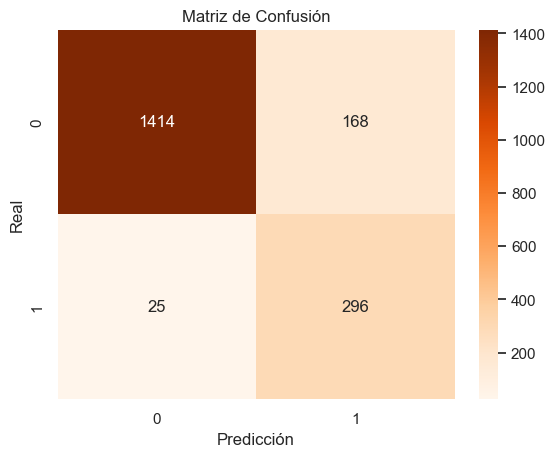

In [183]:
# Umbral modificado para la matriz de confusión
y_pred_threshold = [1 if prob > best_threshold else 0 for prob in y_pred_proba]

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_threshold)
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()

In [184]:
# Informe de clasificación
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred_threshold))


--- Classification Report ---
              precision    recall  f1-score   support

       False       0.98      0.89      0.94      1582
        True       0.64      0.92      0.75       321

    accuracy                           0.90      1903
   macro avg       0.81      0.91      0.85      1903
weighted avg       0.92      0.90      0.91      1903



* Hemos logrado aumentar el recall (True) hasta el 0.92, detectando 37 puntos porcentuales más de clientes recurrentes o fieles.
* Hemos empeorado notablemente la precision (True) que cae hasta 0.64: frente a 67 elementos erróneos antes, ahora creemos detectar clientes fieles de forma errónea en 168 casos.
* A nivel de negocio tenemos 2 posibles situaciones:
  - Los clientes recurrentes son aproximadamente igual de valiosos si se detectan que caros si se falla y se consieran de ese modo cuando realmente no lo son. **Caso A**
  - Los clientes recurrentes son valiosos y podemos emplear recursos en detectarlos, siendo el coste de errar aceptable: elegiríamos esta segunda versión del modelo. **Caso B**

In [185]:
# Diccionario para acumular modelo y threshold
modelo_y_threshold = {'modelo': modelo_lgbm_opt,
    'threshold_optimo': best_threshold}

# Guardamos con joblib
joblib.dump(modelo_y_threshold, 'modelo_recurrente_b.joblib')

['modelo_recurrente_b.joblib']

#### Importancia de las variables. CASO B

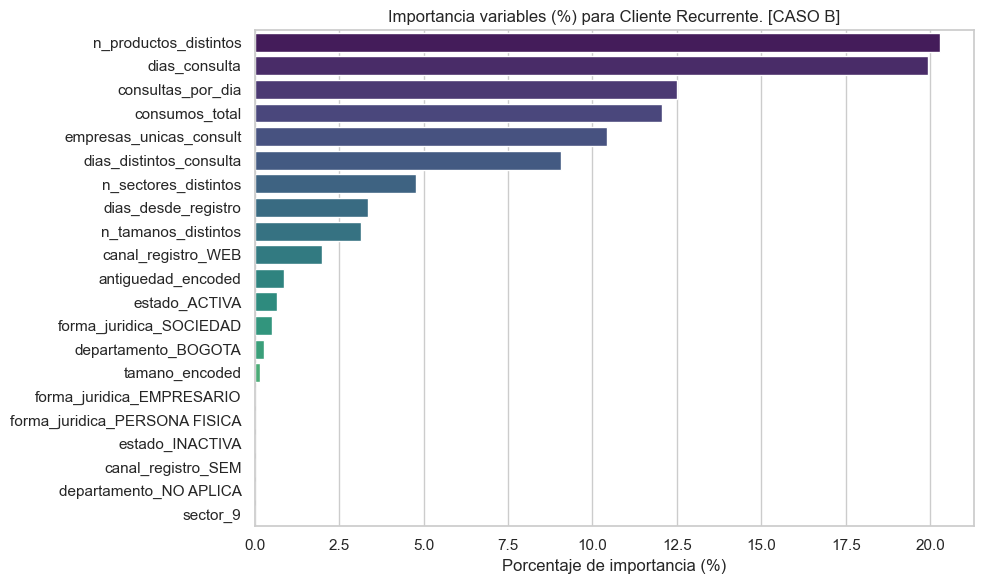

In [186]:
# Extraemos las importancias del modelo optimizado
importances = modelo_lgbm_opt.feature_importances_
features = X_recurrencia.columns

# Normalizamos las importancias (suma 100)
importances_norm = 100 * importances / importances.sum()

# Creamos DataFrame de Importancia
feat_importance_df = pd.DataFrame({'feature': features,
                                   'importance': importances_norm
                                   }).sort_values(by='importance', ascending=False)

# Graficamos las varibles según importancia
plt.figure(figsize=(10,6))
sns.barplot(x='importance', y='feature', data=feat_importance_df,
            palette='viridis', hue='feature', dodge=False)  # Para que no se separen barras iguales.

plt.title('Importancia variables (%) para Cliente Recurrente. [CASO B]')
plt.xlabel('Porcentaje de importancia (%)')
plt.ylabel('')
plt.legend([],[], frameon=False)  # Ocultamos leyenda innecesaria
plt.tight_layout()
plt.show()

* Destacamos que hay variables que resultan poco o nada relevantes para el funcionamiento del modelo: las 6 últimas. En principio, se podrían eliminar y lograr un modelo más parsimonioso sin pérdida de potencia predictiva.
* Las 2 variables más relevantes son: n_productos_distintos y dias_consulta.
* Hay 8 variables (desde dias_desde_registro hasta tamano_encoded) cuya relevancia es muy baja (inferior al 5% cada una) y, por tanto, si tuvieramos la necesidad de implementar un modelo muy ligero, también podríamos eliminar ya que se perdería poca potencia. Es decir, nos quedaría un modelo con solo 7 variables para predecir si un cliente va a ser recurrente o no.

#### Modelo recurrencia optimizado mini (7 variables)

In [187]:
# Variables finales que vamos a usar
vars_recurrencia_7 = ['n_productos_distintos',
                      'dias_consulta',
                      'consultas_por_dia',
                      'consumos_total',
                      'empresas_unicas_consult',
                      'dias_distintos_consulta',
                      'n_sectores_distintos']

# Variables X e y para el modelo
X_recurrencia_7 = clientes_recurrencia[vars_recurrencia_7]
y_recurrencia_7 = clientes_recurrencia['tipo_cliente_fiel']

# Separación en Train/Test
X_train, X_test, y_train, y_test = train_test_split(X_recurrencia_7, y_recurrencia_7,
                                                    test_size=0.2,
                                                    random_state=1234,
                                                    stratify=y_recurrencia)

# Definimos el modelo
modelo_recurrencia_7 = lgb.LGBMClassifier(random_state=1234)

# Definimos la rejilla de parámetros
param_grid = {'num_leaves': [15, 31, 63],
              'max_depth': [-1, 5, 10],
              'learning_rate': [0.01, 0.05, 0.1],
              'n_estimators': [100, 200, 500]}

# Configuramos GridSearchCV
grid_search = GridSearchCV(estimator=modelo_recurrencia_7,
                           param_grid=param_grid,
                           scoring='roc_auc',
                           cv=10,
                           n_jobs=-1,
                           verbose=2)

In [189]:
# Entrenamos del modelo de 7 variables
grid_search.fit(X_train, y_train)

print(f"\nMejores parámetros encontrados: {grid_search.best_params_}")
print(f"Mejor AUC obtenido (validación cruzada): {grid_search.best_score_:.4f}")

Fitting 10 folds for each of 81 candidates, totalling 810 fits

Mejores parámetros encontrados: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 500, 'num_leaves': 15}
Mejor AUC obtenido (validación cruzada): 0.9632


In [190]:
# Usamos el mejor modelo encontrado
modelo_recurrencia_7 = grid_search.best_estimator_

# Predicciones
y_pred = modelo_recurrencia_7.predict(X_test)
y_pred_proba = modelo_recurrencia_7.predict_proba(X_test)[:, 1]

# Métricas de evaluación
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred))


--- Classification Report ---
              precision    recall  f1-score   support

       False       0.96      0.94      0.95      1582
        True       0.72      0.80      0.76       321

    accuracy                           0.92      1903
   macro avg       0.84      0.87      0.86      1903
weighted avg       0.92      0.92      0.92      1903



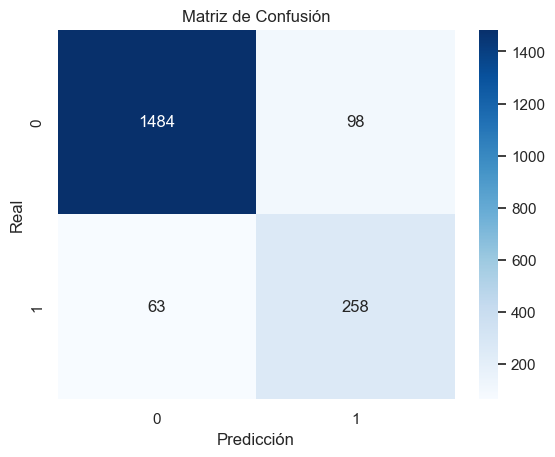

In [191]:
# Matriz de confusión
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()# Matriz de confusión

In [192]:
# Puntuación AUC
auc_score = roc_auc_score(y_test, y_pred_proba)
print(f"AUC score en test: {auc_score:.4f}")

AUC score en test: 0.9646


Mejor threshold encontrado: 0.2136


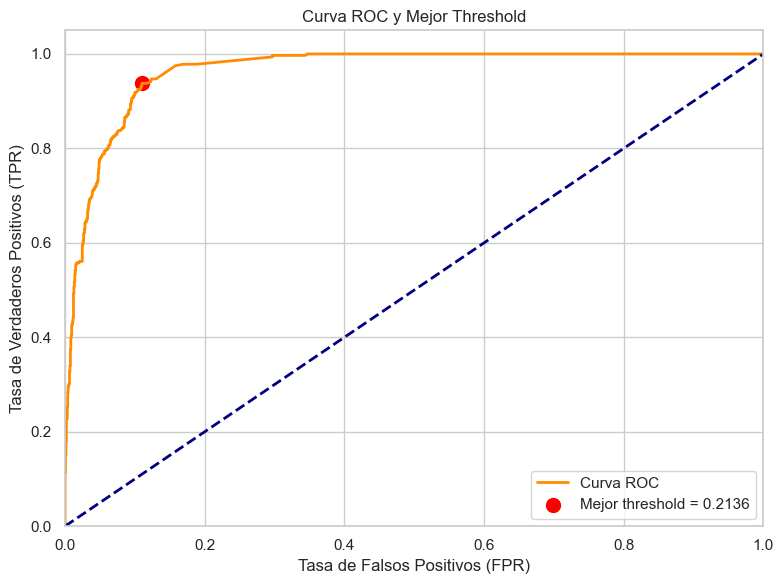

In [193]:
# Índice de Youden

# Calculamos FPR, TPR y thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculamos el índice de Youden para cada threshold
youden_index = tpr - fpr

# Buscamos el índice donde Youden Index es máximo
best_idx = np.argmax(youden_index)
best_threshold = thresholds[best_idx]

# Mejor TPR asociado al threshold
tpr_best = tpr[np.argmax(tpr - fpr)]

print(f"Mejor threshold encontrado: {best_threshold:.4f}")

# Para visualizarlo:
plt.figure(figsize=(8,6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.scatter(fpr[best_idx], tpr[best_idx], color='red', label=f'Mejor threshold = {best_threshold:.4f}', s=100)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos (FPR)')
plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
plt.title('Curva ROC y Mejor Threshold')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

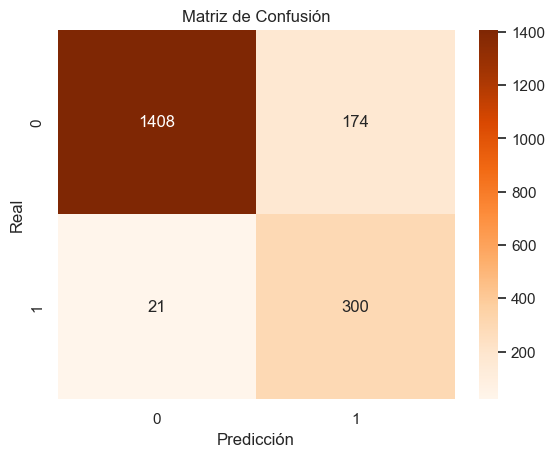

In [194]:
# Umbral modificado para la matriz de confusión
y_pred_threshold = [1 if prob > best_threshold else 0 for prob in y_pred_proba]

# Matriz de confusión
cm = confusion_matrix(y_test, y_pred_threshold)
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()

In [195]:
# Informe de clasificación
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred_threshold))


--- Classification Report ---
              precision    recall  f1-score   support

       False       0.99      0.89      0.94      1582
        True       0.63      0.93      0.75       321

    accuracy                           0.90      1903
   macro avg       0.81      0.91      0.84      1903
weighted avg       0.93      0.90      0.90      1903



Observamos un buen desempeño del modelo:
* El modelo ha sido optimizado igualmente con el Índice de Youden.
* Tras **reducir de 21 a 7 variables** el modelo:
  - Mejora en la detección de TP (pasa de 258 a 300).
  - Empeora en la la detección de TN (pasa de 1484 a 1408), es decir, comete 76 errores más en FN (de 98 a 174).

In [196]:
# Diccionario para guardar modelo y threshold
modelo_y_threshold = {'modelo': modelo_recurrencia_7,
                      'threshold_optimo': best_threshold}

# Guardamos con joblib
joblib.dump(modelo_y_threshold, 'modelo_recurrencia_7.joblib')

['modelo_recurrencia_7.joblib']

# Interpretabilidad con SHAP (SHapley Additive exPlanations)

**Objetivo general:**

Explicar por qué el modelo toma ciertas decisiones. Entender **qué variables influyen más** y **cómo influyen** en la predicción de:
* Recurrencia.
* Up-selling / Cross-selling.

SHAP es una técnica basada en teoría de juegos que explica la predicción de un modelo atribuyendo a cada variable una contribución positiva o negativa.

https://foqum.io/blog/termino/shap/#:~:text=SHAP%20(SHapley%20Additive%20exPlanations)%20es,de%20la%20teor%C3%ADa%20de%20juegos.

https://tutegomeze.medium.com/shap-shapley-additive-explanations-9a0d0e7e63d5

https://www.youtube.com/watch?v=yAXQXZdUSI0

https://www.youtube.com/watch?v=Y5IuiGEkbGk

## Modelo y explainer

In [197]:
# Cargamos el modelo y threshold
modelo_y_threshold = joblib.load('modelo_recurrencia_7.joblib')
modelo_rec_7 = modelo_y_threshold['modelo']
threshold_rec_7 = modelo_y_threshold['threshold_optimo']

In [198]:
# Cargamos el explainer para LightGBM
explainer = shap.Explainer(modelo_rec_7, X_train)  # Construcción del explainer.
shap_values = explainer(X_test)  # Evaluación de las predicciones explicadas de los datos de test.

 95%|=================== | 1807/1903 [00:16<00:00]       

## Gráficos de interpretación

### Summary plot

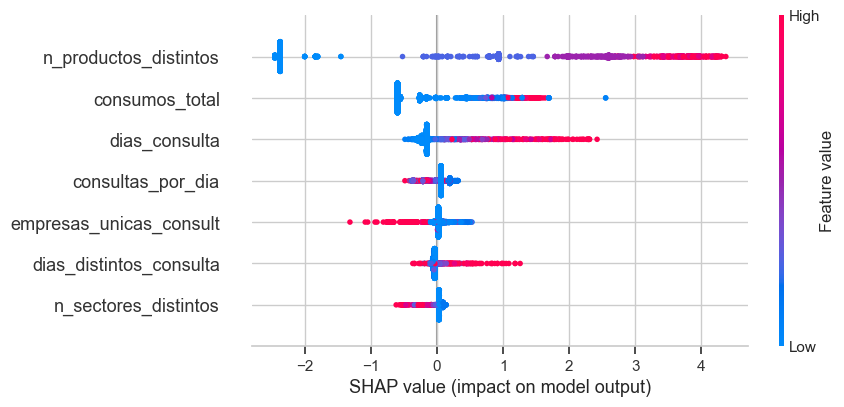

In [199]:
# Importancia de las variables (summary plot)
shap.plots.beeswarm(shap_values, max_display=7)  # Mostrar 7 variables como máximo.

* Cada punto es un cliente. El eje X muestra el impacto SHAP: cuánto empuja ese valor la predicción hacia mayor probabilidad de ser recurrente (derecha o SHAP positivo) o no (izquierda o SHAP negativo -clase 0-).
* La variable más importante sería "n_productos_distintos". Las siguientes siguen en importancia en orden descendente.
* El color indica los valores que toma cada variable para ese cliente. Rojo para valores altos y azul para valores bajos.
  - Por ejemplo, los valores altos en "n_productos_distintos" (rojos), indican valores bajos en Shapley, lo que indica que están empujando hacia la clase 0 (cliente no recurrente).
* Se observa que las variables que generan mayor impacto en la predicción (valores muy altos o muy bajos) son "n_productos_distintos", y luego un segundo bloque formado por "consumos_total" y "dias_consulta".
* Por ejemplo, n_productos_distintos: es la variable más influyente. Clientes con muchos productos distintos (rojo) tienden a aumentar la probabilidad de ser recurrentes (SHAP positivo).


En conclusión, los **clientes que consumen más productos, más veces y durante más días**, tienen mayor probabilidad de ser **clientes recurrentes** o fieles.

### Dependencia entre las variables

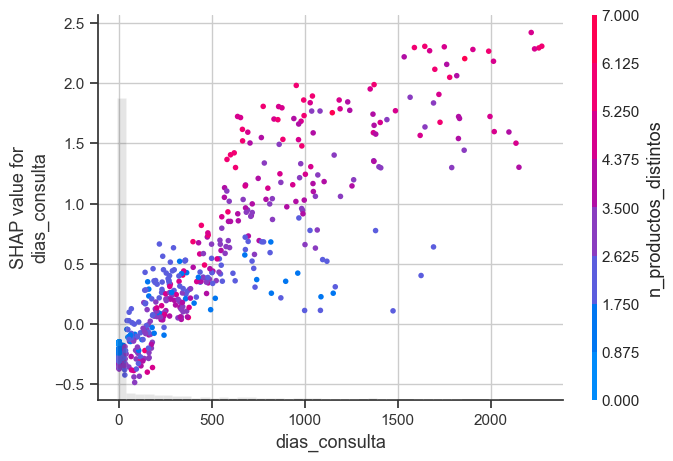

In [200]:
# Dependencia individual de una variable
shap.plots.scatter(shap_values[:, "dias_consulta"], color=shap_values)

* El eje X muestra el valor real de "dias_consulta".
* El eje Y muestra el valor SHAP, que es el impacto que ese valor concreto de "dias_consulta" tiene en la predicción del modelo (ser cliente recurrente).
* El color codifica la variable "n_productos_distintos", e indica cómo modula el impacto de "dias_consulta".
* Las barras grises indican frecuencia de observaciones. Indica junto con los valores SHAP si un rango de valores tiene impacto negativo en la predicción (por ejemplo, valores SHAP muy bajos).
* Por tanto, observamos lo siguiente:
  - **A mayor número de días de consulta el valor de SHAP también aumenta**, lo que quiere decir que cuánto más largo es el periodo de consulta del cliente mayor es su contribución a que sea considerado cliente fiel.
  - **Valores SHAP positivos** indican que esa observación empuja la predicción hacia 1 (fiel). Así, que a partir de 250-300 días, la mayoría de puntos tienen valores SHAP positivos, es decir, contribuyen a la fidelidad.
  - Los colores (n_productos_distintos) indican que cuando es rojo hay más productos distintos: se observa que los puntos colores implican valores más altos de SHAP. Esto conlleva una **interacción positiva** en el sentido de que si un cliente ha consultando durante mucho tiempo y además ha visto muchos productos distintos, su **probabilidad de ser recurrente/fiel es más alta todavía**.

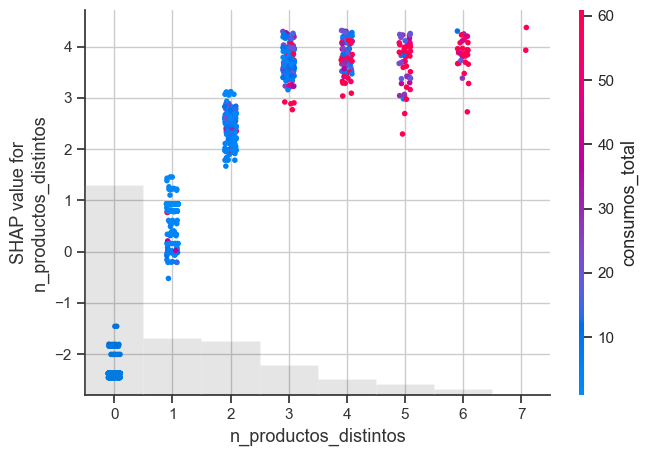

In [201]:
# Dependencia individual de una variable:
# Comprobar si el número de productos distintos influye más en clientes que consumen/consultan mucho.
shap.plots.scatter(shap_values[:, "n_productos_distintos"], color=shap_values[:, 'consumos_total'])

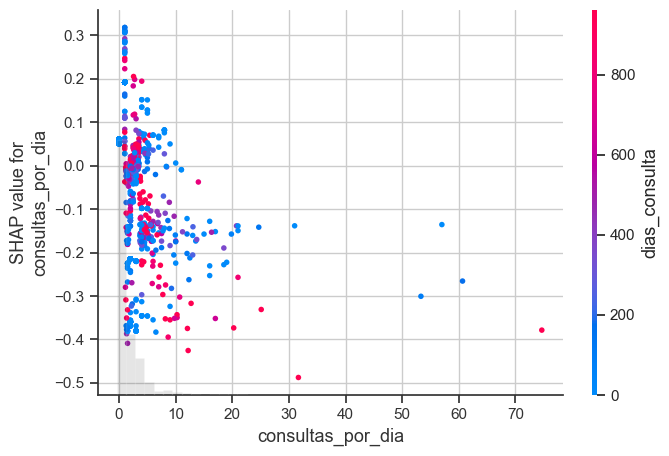

In [202]:
#  Comprobar si los clientes con más días activos, pero menos consultas diarias tienen menos impacto.
shap.plots.scatter(shap_values[:, "consultas_por_dia"], color=shap_values[:, 'dias_consulta'])

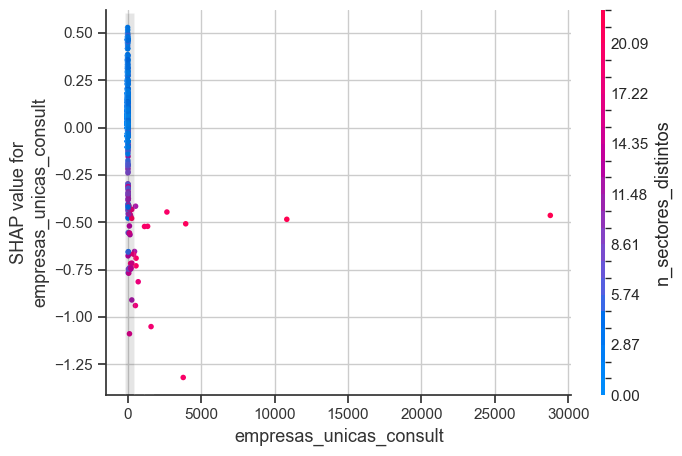

In [203]:
# Comprobar si la diversidad de sectores amplifica el impacto de consultar muchas empresas.
shap.plots.scatter(shap_values[:, "empresas_unicas_consult"], color=shap_values[:, 'n_sectores_distintos'])

Interpretación:
* **"n_productos_distintos" y "consumos_total"**
  - Si un cliente compra muchos productos y además consulta mucho, es probable que impacte sobre una mayor recurrencia/fidelidad.
  - El eje vertical indica mayor importancia (mayor escala) que la variable anterior (dias_consulta).
  - Clientes con pocos productos consultados (0 ó 1) tienen valores SHAP negativos o bajos, es decir, el modelo no los considerará recurrentes.
  - De 3 a 7 productos distintos los valores SHAP crecen y el modelo considerará más probable que estos clientes sean recurrentes.
  - Los valores más alto son más rojos lo que indica una "sinergia" positiva entre productos distintos y consumo_total.
* **"consultas_por_dia" y "dias_consulta"**
  - Si los usuarios no solo consultan muchos días, sino que también lo hacen con frecuencia diaria, podría indicar que hay un comportamiento recurrente.
  - Consultar muchos productos por día no implica ser más recurrente.
  - Los usuarios muy activos en pocos días (dias_consulta; azul) parece que son más ocasionales que recurrentes.
  - Hay pocos puntos con SHAP positivo, por tanto, esta variable (consultas_por_dia) no parece favorecer la recurrencia del cliente.
  - En definitiva, muchas consultas en pocos días no conlleva un comportamiento recurrente. El modelo penaliza las consultas concentradas.
* **"empresas_unicas_consult" y "n_sectores_distintos"**
  - Si un cliente consulta muchos sectores distintos y muchas empresas, podría estar buscanco más intensamente, lo cual podría relacionarse con mayor recurrencia.
  - Los puntos más negativos de SHAP tienden a ser fojos (muchos sectores): los clientes que consultan muchas empresas en muchos sectores diferentes se consideran poco recurrentes.
  - Por tanto, consultar muchas empresas parece positivo, pero una exploración masiva en empresas y sectores disminuye la probabilidad de recurrencia.

**Conclusión**

Los clientes que **consultan durante más tiempo, consultan más productos distintos y tienen mayores volúmenes de consulta** muestran mayores probabilidades de ser **recurrentes**.

Por el contrario, las **consultas muy concentradas en pocos días o una búsqueda dispersa en múltiples empresas y sectores** tienden a tener valores SHAP negativos, indicando **menor probabilidad de fidelización**.

En conjunto, **se valora más la actividad sostenida y enfocada que la intensidad puntual o la exploración amplia**.

### Fuerza de predicción para un cliente

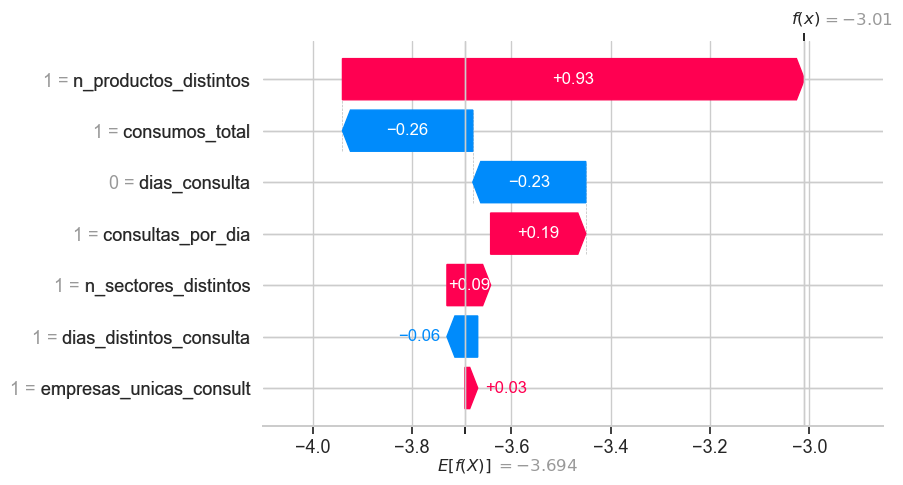

In [204]:
# Fuerza de predicción para un cliente específico: se selecciona el cliente 0
shap.plots.waterfall(shap_values[0])

* **E[f(x)]**. La media de las predicciones del modelo para todos los datos es -3.694.
* **f(x)**. Predicción del modelo para este cliente concreto (antes de aplicar la función sigmoide -logit-, esto es, la salida curda del modelo).
* **valores SHAP**. Son los valores de cada barra e indican la contribución individual de una variable al desplazamiento desde el valor medio (E[f(x)]) hacia la predicción final (f(x)):
  - Las barras rojas o positivas empujan la predicción hacia un valor mayor, es decir, mayor probabilidad de que el cliente sea recurrente.
  - Las barras azules o negativas empujan la predicción hacia un valor menor, es decir, menor probabilidad de recurrencia.
  - Las barras suman desde el valor base E[f(x)] hacia la predicción final, pero el orden de las barras no es el orden de la suma.
* **Etiquetas como *1 = n_productos_distintos***. Indican el valor concreto la variable para este cliente. Por ejemplo, *1 = n_productos_distintos* y *0 = dias_consulta*, el ciente ha consultado 1 producto distinto y 0 días de consulta (días entre la primera y última consulta).

**Cliente 0**

- La probabilidad general de ser recurrente es baja (valor medio de -3.694).
- La probabilidad final de ser cliente es -3.01, valor bajo pero algo mayor que la media.
- Las variables que más influyen son:
  * n_productos_distintos: +0.93. Variable que más aumenta la predicción. El modelo considera así el haber consulta 1 producto.
  * consumos_total (-0.26) y dias_consulta (-0.23), ambas reducen la predicción. El cliente apenas ha consultado, lo que le aleja de ser un cliente recurrente.
  * consultas_por_dia y n_sectores_distintos, aportan algo a favor de la fidelidad del cliente.
  * dias_distintos_consulta y empresas_unicas_consult, tienen un impacto muy bajo.

Este cliente es considerado poco probable que sea recurrente, pero su predicción (-3.01 ~ 4.7%) está por encima de la media (-3.694).

### Resumen variables top

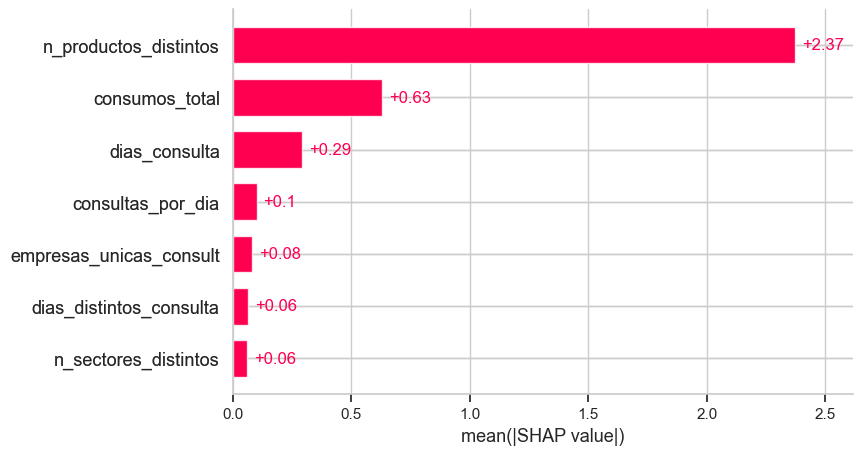

In [205]:
# Variables más importantes según media SHAP: mayor peso con independencia del signo.
shap.plots.bar(shap_values, max_display=10)

# Conclusiones y recomendaciones

## Resumen de los segmentos encontrados

A lo largo del trabajo se han identificado distintos grupos de clientes mediante técnicas de clustering, incluyendo enfoques como KMeans y SOM + KMeans. Estos segmentos han permitido clasificar a los clientes en grupos más homogéneos en cuanto a frecuencia de compra, gasto promedio, variedad de productos consumidos y actividad en la plataforma. En concreto:
- **Cluster 3 y 5** han sido identificados como los grupos de mayor valor (alta frecuencia y alto gasto).
- **Clusters 0, 2 y 4** han representado perfiles de bajo valor o con potencial por desarrollar.
- Se han detectado grupos inactivos, otros altamente activos pero poco rentables, y un grupo reducido con consumo recurrente y alto valor, catalogado como VIP.

## Clientes potenciales para cross-selling y up-selling

A partir de los modelos desarrollados se han detectado:
- Clientes de clusters 0, 2, 4 (modelo ampliado) con un perfil susceptible de **up-selling**: tienen un comportamiento similar a clientes de alto valor, aunque actualmente no lo son.
- Mediante modelos predictivos (LightGBM) se han estimado probabilidades de pertenencia a clusters de alto valor, lo que ha permitido identificar **candidatos con alta probabilidad** de migrar a segmentos superiores.
- Se propone realizar campañas dirigidas a estos perfiles para aumentar su consumo (recomendaciones personalizadas, promociones, nuevos productos).

## Modelo de clientes recurrentes, adecuación y aplicabilidad

Se ha construido un **modelo predictivo de recurrencia utilizando** LightGBM, tomando como variables explicativas sólo aquellas disponibles antes de que el cliente realice compras. Se consigue hacer un modelo reducido más parsimonioso pasando de las 21 variables iniciales a las **7 variables finales**. El modelo:
- Presenta buenos niveles de desempeño (AUC, precisión y recall).
- Ha sido interpretado con SHAP para entender la influencia de cada variable.
- Permite clasificar potenciales clientes como "ocasionales" o "fieles", según se anticipe que van a repetir compras o no (+2 compras).
- Puede ser aplicado para:
  - acciones de retención
    * bonificaciones por permanencia.
    * recordatorios automáticos si el cliente no ha realizado consultas/compras en X días.
  - alertas comerciales: mensajes al equipo comercial cuando se detecten ciertos patrones en el cliente:
    * "Este cliente ha bajado su frecuencia de consulta"
    * "Este cliente presenta características similares a los clientes que ya abandonaron"
  - campañas automatizadas (emails o notificaciones programadas)
    * Campaña de bienvenida tras registro.
    * Campaña de productos relacionados cuando hay interés en un sector.

## Recomendaciones estratégicas

- **Clientes de bajo valor con alta probabilidad de pertenecer a segmentos de alto valor** deben ser objetivo prioritario de acciones de up-selling. -> *modelo_upselling_11*
- **Clientes VIP actuales** pueden integrarse en programas de fidelización exclusivos. -> *clusters detectados*
- **Clientes con alta actividad en pocos días** requieren campañas de retención, ya que podrían estar en riesgo de abandono. -> *clusters detectados*
- El **modelo de recurrencia** se puede implementar como herramienta de negocio para segmentación dinámica, priorización de leads y personalización de la oferta comercial. -> *modelo_recurrencia_7*

---

Se concluye con la validación de la utilidad práctica de los modelos desarrollados, ya que permiten **comprender mejor el perfil y comportamiento actual de los clientes (vía clusterización)** y, al mismo tiempo, **apoyar la toma de decisiones estratégicas orientadas al aumento de la facturación y la fidelización**.